In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
import sklearn 
from datetime import datetime, timedelta
import openpyxl


ModuleNotFoundError: No module named 'sklearn'

In [ ]:


!pip install sklearn



zsh:1: command not found: pip


In [ ]:
random.seed(72)
np.random.seed(72)

# Weather Data Wallis

**Dataset Sion**

In [ ]:
sion2000 = pd.read_csv("Data//sion2000.csv")
sion2001 = pd.read_csv("Data//sion2001.csv")
sion2002 = pd.read_csv("Data//sion2002.csv")
sion2003 = pd.read_csv("Data//sion2003.csv")
sion2004 = pd.read_csv("Data//sion2004.csv")
sion2005 = pd.read_csv("Data//sion2005.csv")
sion2006 = pd.read_csv("Data//sion2006.csv")
sion2007 = pd.read_csv("Data//sion2007.csv")
sion2008 = pd.read_csv("Data//sion2008.csv")
sion2009 = pd.read_csv("Data//sion2009.csv")
sion2010 = pd.read_csv("Data//sion2010.csv")
sion2011 = pd.read_csv("Data//sion2011.csv")
sion2012 = pd.read_csv("Data//sion2012.csv")
sion2013 = pd.read_csv("Data//sion2013.csv")
sion2014 = pd.read_csv("Data//sion2014.csv")
sion2015 = pd.read_csv("Data//sion2015.csv")
sion2016 = pd.read_csv("Data//sion2016.csv")
sion2017 = pd.read_csv("Data//sion2017.csv")
sion2018 = pd.read_csv("Data//sion2018.csv")
sion2019 = pd.read_csv("Data//sion2019.csv")
sion2020 = pd.read_csv("Data//sion 2020.csv")
sion2021 = pd.read_csv("Data//sion2021.csv")
sion2022 = pd.read_csv("Data//sion2022.csv")
sion2023 = pd.read_csv("Data//sion2023.csv")

dataframes = []
for year in range(2000, 2024):
    try:
        if year == 2020:
            # Handle the special case for 2020
            filepath = "Data//sion 2020 (1).csv"
        else:
            # General case
            filepath = f"Data//sion{year}.csv"
        
        # Read the CSV and append to the list
        dataframes.append(pd.read_csv(filepath))
    except FileNotFoundError:
        print(f"File for year {year} not found: {filepath}")

# Concatenate all the dataframes
sion = pd.concat(dataframes, ignore_index=True)

File for year 2020 not found: Data//sion 2020 (1).csv


In [ ]:
# Durchschnitt der ersten 6 Zeilen
averages_sion = [sion.head(6).mean(numeric_only=True)]

# Durchschnitt für jeweils 7 Zeilen
for i in range(6, len(sion), 7):
    chunk = sion.iloc[i:i + 7]
    averages_sion.append(chunk.mean(numeric_only=True))

# Neuer DataFrame aus den Durchschnitten
averages_df_sion = pd.DataFrame(averages_sion)

# Hinzufügen einer Datumsspalte
start_date = datetime.strptime("2000-01-03", "%Y-%m-%d")
dates = [start_date + timedelta(days=7 * i) for i in range(len(averages_df_sion))]
averages_df_sion.insert(0, "Date", dates)

averages_df_sion

,Date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2000-01-03,-2.483333,-6.100000,2.016667,0.000000,78.333333,69.000000,6.540000,NaN,1030.900000,NaN
1,2000-01-10,-1.728571,-5.257143,3.085714,0.000000,51.428571,78.000000,5.200000,NaN,1029.350000,NaN
2,2000-01-17,-2.414286,-6.457143,2.142857,0.000000,48.571429,186.000000,4.375000,NaN,1027.675000,NaN
3,2000-01-24,-3.371429,-7.185714,1.185714,0.128571,42.857143,116.000000,4.666667,NaN,1023.916667,NaN
4,2000-01-31,1.500000,-2.342857,6.171429,3.085714,28.571429,NaN,4.414286,NaN,1027.083333,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1197,2022-12-12,-0.071429,-3.285714,2.271429,9.357143,100.000000,109.000000,4.800000,20.014286,1013.457143,NaN
1198,2022-12-19,3.128571,0.842857,5.785714,11.985714,37.142857,95.428571,4.114286,19.857143,1016.171429,NaN
1199,2022-12-26,2.628571,-1.371429,7.771429,0.000000,0.000000,137.428571,4.571429,20.857143,1033.414286,NaN
1200,2023-01-02,4.771429,0.414286,9.742857,0.342857,0.000000,159.428571,8.057143,31.471429,1021.957143,NaN


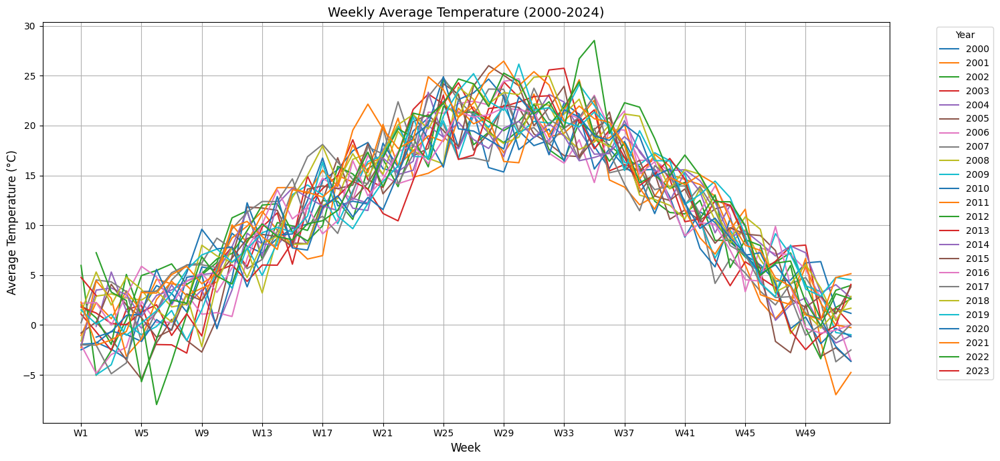

In [ ]:
# Load the data into a DataFrame (update 'your_data.csv' with your actual file name)
# Assuming the dataset is in a CSV file

# Ensure 'Date' is in datetime format
averages_df_sion['Date'] = pd.to_datetime(averages_df_sion['Date'])

# Extract year and month
averages_df_sion['Year'] = averages_df_sion['Date'].dt.year
averages_df_sion['Week'] = averages_df_sion['Date'].dt.isocalendar().week

averages_df_sion = averages_df_sion[averages_df_sion['Week'] <= 52]

# Group by Year and Month and calculate the monthly average temperature
weekly_avg_temp = averages_df_sion.groupby(['Year', "Week"])['tavg'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 53 weeks

plt.title('Weekly Average Temperature (2000-2024)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#Rename 
averages_df_sion = averages_df_sion.rename(columns={'tavg': 'tavg_sion', 'prcp': 'prcp_sion', "wspd": 'wspd_sion', 'snow': 'snow_sion', 'tmin': 'tmin_sion', "tmax": 'tmax_sion',"wdir": 'wdir_sion', 'wpgt': 'wpgt_sion', 'pres': 'pres_sion'})
averages_df_sion

,Date,tavg_sion,tmin_sion,tmax_sion,prcp_sion,snow_sion,wdir_sion,wspd_sion,wpgt_sion,pres_sion,tsun,Year,Week
0,2000-01-03,-2.483333,-6.100000,2.016667,0.000000,78.333333,69.000000,6.540000,NaN,1030.900000,NaN,2000,1
1,2000-01-10,-1.728571,-5.257143,3.085714,0.000000,51.428571,78.000000,5.200000,NaN,1029.350000,NaN,2000,2
2,2000-01-17,-2.414286,-6.457143,2.142857,0.000000,48.571429,186.000000,4.375000,NaN,1027.675000,NaN,2000,3
3,2000-01-24,-3.371429,-7.185714,1.185714,0.128571,42.857143,116.000000,4.666667,NaN,1023.916667,NaN,2000,4
4,2000-01-31,1.500000,-2.342857,6.171429,3.085714,28.571429,NaN,4.414286,NaN,1027.083333,NaN,2000,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1197,2022-12-12,-0.071429,-3.285714,2.271429,9.357143,100.000000,109.000000,4.800000,20.014286,1013.457143,NaN,2022,50
1198,2022-12-19,3.128571,0.842857,5.785714,11.985714,37.142857,95.428571,4.114286,19.857143,1016.171429,NaN,2022,51
1199,2022-12-26,2.628571,-1.371429,7.771429,0.000000,0.000000,137.428571,4.571429,20.857143,1033.414286,NaN,2022,52
1200,2023-01-02,4.771429,0.414286,9.742857,0.342857,0.000000,159.428571,8.057143,31.471429,1021.957143,NaN,2023,1


**Dataset Sierre**

In [ ]:
sierre2018 = pd.read_csv("Data//Sierre2018.csv")
sierre2019 = pd.read_csv("Data//Sierre2019.csv")
sierre2020 = pd.read_csv("Data//Sierre2020.csv")
sierre2021 = pd.read_csv("Data//Sierre2021.csv")
sierre2022 = pd.read_csv("Data//Sierre2022.csv")
sierre2023 = pd.read_csv("Data//Sierre2023.csv")

# Initialize an empty list to hold the DataFrames
dataframes = []

# Loop through the range of years
for year in range(2018, 2024):
    try:
        # Construct the file path dynamically
        filepath = f"Data//sierre{year}.csv"
        
        # Read the CSV file and append to the list
        dataframes.append(pd.read_csv(filepath))
    except FileNotFoundError:
        # Handle missing files gracefully
        print(f"File for year {year} not found: {filepath}")

# Concatenate all the DataFrames into one
sierre = pd.concat(dataframes, ignore_index=True)
sierre

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2186,2023-12-27,4.2,-0.3,9.6,NaN,NaN,38.0,8.5,20.4,1024.0,NaN
2187,2023-12-28,3.9,1.7,6.5,NaN,NaN,30.0,6.5,16.7,1024.7,NaN
2188,2023-12-29,3.8,2.3,5.9,NaN,NaN,338.0,4.9,13.0,1022.5,NaN
2189,2023-12-30,1.8,-0.1,4.6,NaN,NaN,41.0,5.3,20.4,1021.4,NaN


In [ ]:
# Durchschnitt der ersten 6 Zeilen
averages_sierre = [sierre.head(6).mean(numeric_only=True)]

# Durchschnitt für jeweils 7 Zeilen
for i in range(6, len(sion), 7):
    chunk = sierre.iloc[i:i + 7]
    averages_sierre.append(chunk.mean(numeric_only=True))

# Neuer DataFrame aus den Durchschnitten
averages_df_sierre = pd.DataFrame(averages_sion)

# Hinzufügen einer Datumsspalte
start_date = datetime.strptime("2018-01-01", "%Y-%m-%d")
dates = [start_date + timedelta(days=7 * i) for i in range(len(averages_df_sierre))]
averages_df_sierre.insert(0, "Date", dates)

averages_df_sierre

,Date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2018-01-01,-2.483333,-6.100000,2.016667,0.000000,78.333333,69.000000,6.540000,NaN,1030.900000,NaN
1,2018-01-08,-1.728571,-5.257143,3.085714,0.000000,51.428571,78.000000,5.200000,NaN,1029.350000,NaN
2,2018-01-15,-2.414286,-6.457143,2.142857,0.000000,48.571429,186.000000,4.375000,NaN,1027.675000,NaN
3,2018-01-22,-3.371429,-7.185714,1.185714,0.128571,42.857143,116.000000,4.666667,NaN,1023.916667,NaN
4,2018-01-29,1.500000,-2.342857,6.171429,3.085714,28.571429,NaN,4.414286,NaN,1027.083333,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1197,2040-12-10,-0.071429,-3.285714,2.271429,9.357143,100.000000,109.000000,4.800000,20.014286,1013.457143,NaN
1198,2040-12-17,3.128571,0.842857,5.785714,11.985714,37.142857,95.428571,4.114286,19.857143,1016.171429,NaN
1199,2040-12-24,2.628571,-1.371429,7.771429,0.000000,0.000000,137.428571,4.571429,20.857143,1033.414286,NaN
1200,2040-12-31,4.771429,0.414286,9.742857,0.342857,0.000000,159.428571,8.057143,31.471429,1021.957143,NaN


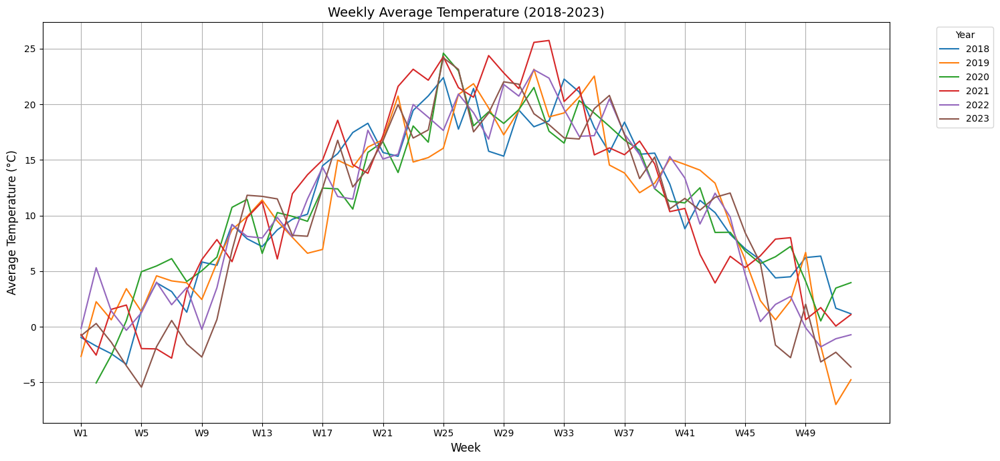

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_sierre['Date'] = pd.to_datetime(averages_df_sierre['Date'])

# Extract year and week number
averages_df_sierre['Year'] = averages_df_sierre['Date'].dt.year
averages_df_sierre['Week'] = averages_df_sierre['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_sierre = averages_df_sierre[(averages_df_sierre['Year'] >= 2018) & (averages_df_sierre['Year'] <= 2023)]
averages_df_sierre = averages_df_sierre[averages_df_sierre['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_temp = averages_df_sierre.groupby(['Year', 'Week'])['tavg'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Temperature (2018-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

It seems like it fluctuates about the same like the sion and also has a Sinuskurve 
we predict the missing weekly data using the average temp of the Sierre dataset from 2018-2023. We add a random noice component. 

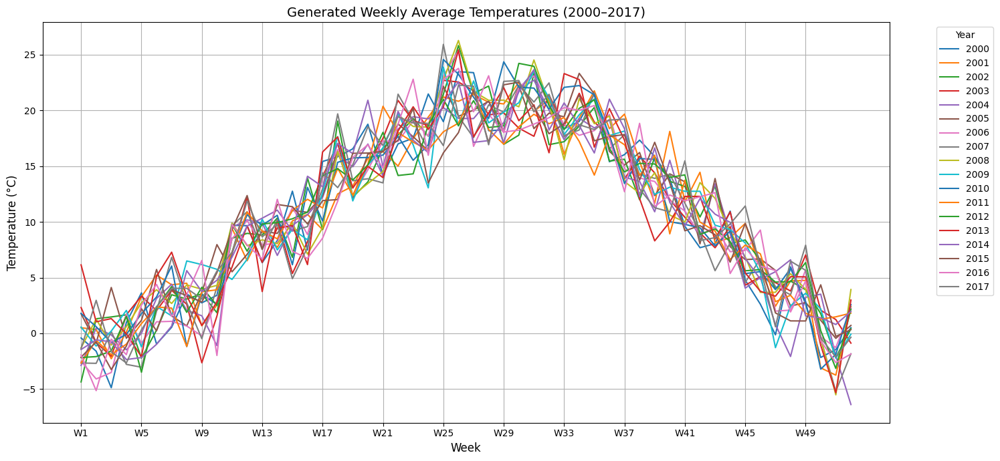

In [ ]:
# Assume 'weekly_avg_temp' is your weekly average temperature DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_temp = weekly_avg_temp.mean(axis=0)

# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2018)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean temperatures
    random_noise = np.random.normal(0, 2, size=len(weekly_mean_temp))  
    generated_temps = weekly_mean_temp + random_noise
    
    # Store the generated data
    for week, temp in zip(weeks, generated_temps):
        generated_data.append({"Year": year, "Week": week, "tavg": temp})

# Convert the list of generated data into a DataFrame
generated_df = pd.DataFrame(generated_data)

# Display the generated data (optional)
generated_df.columns

plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df[generated_df['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['tavg'], label=str(year))

plt.title('Generated Weekly Average Temperatures (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


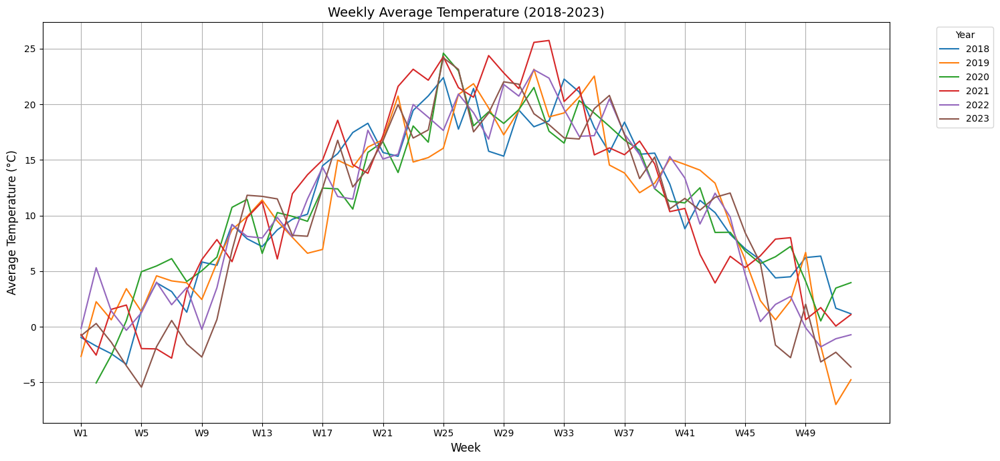

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_sierre['Date'] = pd.to_datetime(averages_df_sierre['Date'])

# Extract year and week number
averages_df_sierre['Year'] = averages_df_sierre['Date'].dt.year
averages_df_sierre['Week'] = averages_df_sierre['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_sierre = averages_df_sierre[(averages_df_sierre['Year'] >= 2018) & (averages_df_sierre['Year'] <= 2023)]
averages_df_sierre = averages_df_sierre[averages_df_sierre['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_temp = averages_df_sierre.groupby(['Year', 'Week'])['tavg'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Temperature (2018-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Convert Year and Week to Date
generated_df['Date'] = generated_df.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

# Drop Year and Week columns as they're no longer needed
generated_df = generated_df.drop(columns=['Year', 'Week'])

# Merge real_data (2018-2023) and generated_df (2000-2017)
# Assuming real_data has a 'Date' column and other relevant columns
merged_data_sierre = pd.concat([averages_df_sierre, generated_df], ignore_index=True)

# Sort the merged data by Date
merged_data_sierre = merged_data_sierre.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame
merged_data_sierre

,Date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,Year,Week
0,2000-01-03,-0.411242,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
1,2000-01-10,-1.599595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
2,2000-01-17,-4.871539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
3,2000-01-24,0.973337,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
4,2000-01-31,3.632865,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,2023-11-27,-2.771429,-7.542857,1.371429,0.371429,34.285714,91.500000,4.785714,NaN,1007.028571,NaN,2023.0,48
1244,2023-12-04,2.028571,-1.142857,5.085714,3.842857,4.285714,140.000000,3.871429,NaN,1011.357143,NaN,2023.0,49
1245,2023-12-11,-3.157143,-6.871429,-0.971429,0.000000,68.571429,NaN,NaN,NaN,NaN,NaN,2023.0,50
1246,2023-12-18,-2.285714,-6.185714,1.871429,1.128571,7.142857,172.000000,7.483333,NaN,1028.683333,NaN,2023.0,51


Plot actual prcp and generate missing values 

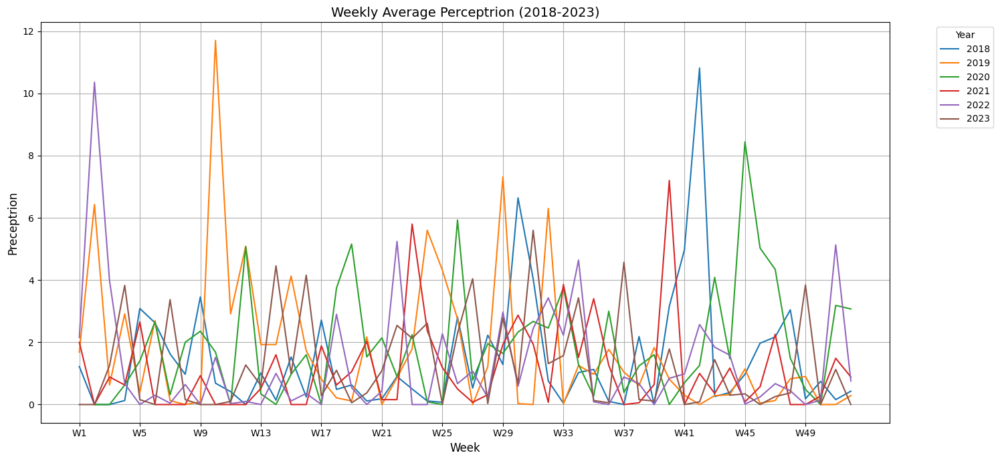

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_sierre['Date'] = pd.to_datetime(averages_df_sierre['Date'])

# Extract year and week number
averages_df_sierre['Year'] = averages_df_sierre['Date'].dt.year
averages_df_sierre['Week'] = averages_df_sierre['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_sierre = averages_df_sierre[(averages_df_sierre['Year'] >= 2018) & (averages_df_sierre['Year'] <= 2023)]
averages_df_sierre = averages_df_sierre[averages_df_sierre['Week'] <= 52]

# Group by Year and Week and calculate the weekly average Prcp
weekly_avg_prcp = averages_df_sierre.groupby(['Year', 'Week'])['prcp'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_prcp.index:
    plt.plot(range(1, 53), weekly_avg_prcp.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Perceptrion (2018-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Preceptrion', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

Index(['Year', 'Week', 'prcp'], dtype='object')


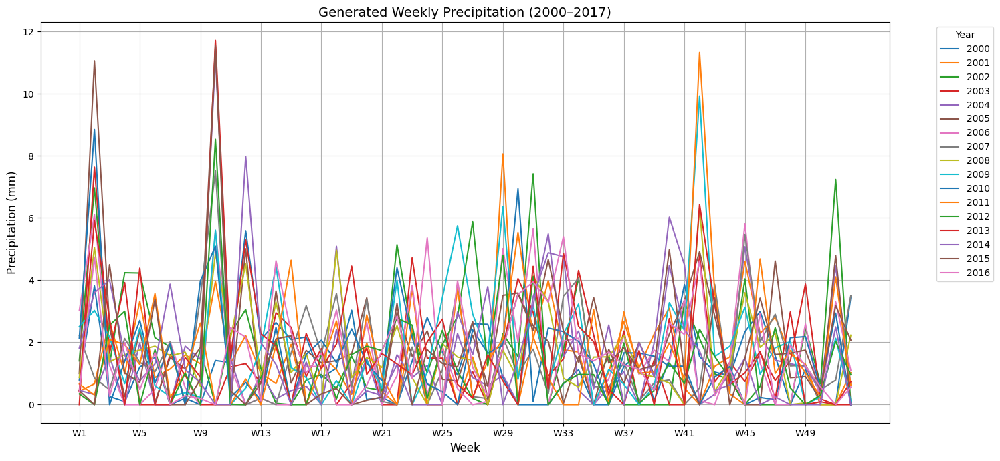

In [ ]:
# Compute the mean across all available years for each week
weekly_mean_prcp = weekly_avg_prcp.mean(axis=0)
weekly_std_prcp = weekly_avg_prcp.std(axis=0)

# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2017)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean precipitation
    random_noise = np.random.normal(0, weekly_std_prcp.values, size=len(weekly_mean_prcp))  
    generated_prcp = weekly_mean_prcp + random_noise
    
    # Ensure precipitation values are non-negative
    generated_prcp = [max(0, value) for value in generated_prcp]
    
    # Store the generated data
    for week, prcp in zip(weeks, generated_prcp):
        generated_data.append({"Year": year, "Week": week, "prcp": prcp})

# Convert the list of generated data into a DataFrame
generated_df1 = pd.DataFrame(generated_data)

# Display the generated data (optional)
print(generated_df1.columns)

# Plot the generated data
plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df1[generated_df1['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['prcp'], label=str(year))

plt.title('Generated Weekly Precipitation (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Precipitation (mm)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
generated_df1

,Year,Week,prcp
0,2000,1,0.785401
1,2000,2,3.816001
2,2000,3,0.260596
3,2000,4,0.099203
4,2000,5,1.202356
...,...,...,...
879,2016,48,1.908437
880,2016,49,1.234943
881,2016,50,0.566881
882,2016,51,0.000000


In [ ]:
# Convert weekly_avg_prcp from wide to long format
weekly_avg_prcp_reset = weekly_avg_prcp.reset_index()  # Reset index to expose 'Year'
long_prcp = weekly_avg_prcp_reset.melt(
    id_vars='Year',           # Keep 'Year' as a column
    var_name='Week',          # Name for the variable column (previously wide headers)
    value_name='prcp'         # Name for the values
)

# Ensure Week is numeric
long_prcp['Week'] = long_prcp['Week'].astype(int)

# Concatenate generated_df1 (2000–2016) with long_prcp (2017–2023)
merged_prcp = pd.concat([generated_df1, long_prcp], ignore_index=True)

# Sort by Year and Week for continuity
merged_prcp = merged_prcp.sort_values(by=['Year', 'Week']).reset_index(drop=True)

# Convert Year and Week to Date (start of the week)
merged_prcp['Date'] = merged_prcp.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

merged_prcp = merged_prcp.drop(columns=['Year', 'Week'])
merged_prcp
    

,prcp,Date
0,0.785401,2000-01-03
1,3.816001,2000-01-10
2,0.260596,2000-01-17
3,0.099203,2000-01-24
4,1.202356,2000-01-31
...,...,...
1191,0.371429,2023-11-27
1192,3.842857,2023-12-04
1193,0.000000,2023-12-11
1194,1.128571,2023-12-18


In [ ]:
# Merge real_data (2018–2023) and generated_df (2000–2017)
merged_data_sierre1 = pd.concat([merged_data_sierre, merged_prcp], ignore_index=True)

# Group by Date and combine rows with the same date
merged_data_sierre1 = merged_data_sierre1.groupby('Date').agg({
    'tavg': 'mean',  # Take the mean if duplicates exist
    'prcp': 'mean',
}).reset_index()

# Sort the merged data by Date
merged_data_sierre1 = merged_data_sierre1.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame
merged_data_sierre1

,Date,tavg,prcp
0,2000-01-03,-0.411242,0.785401
1,2000-01-10,-1.599595,3.816001
2,2000-01-17,-4.871539,0.260596
3,2000-01-24,0.973337,0.099203
4,2000-01-31,3.632865,1.202356
...,...,...,...
1244,2023-11-27,-2.771429,0.371429
1245,2023-12-04,2.028571,3.842857
1246,2023-12-11,-3.157143,0.000000
1247,2023-12-18,-2.285714,1.128571


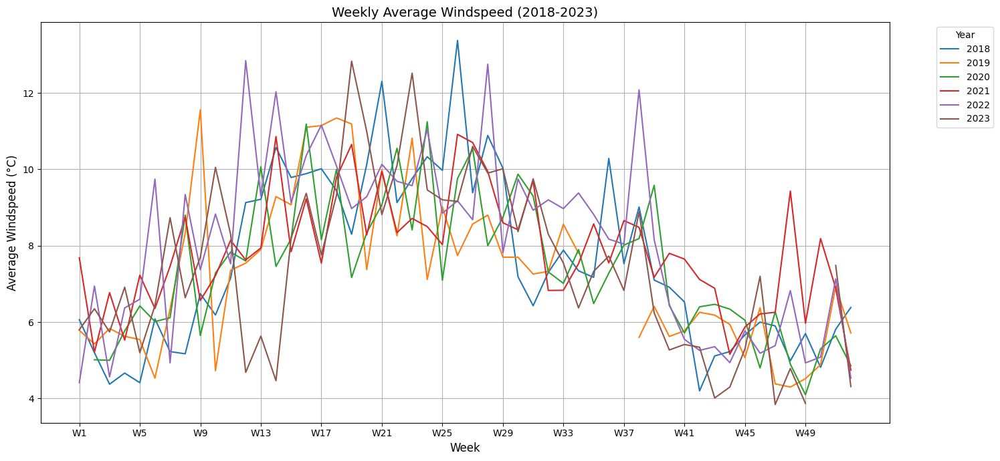

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_sierre['Date'] = pd.to_datetime(averages_df_sierre['Date'])

# Extract year and week number
averages_df_sierre['Year'] = averages_df_sierre['Date'].dt.year
averages_df_sierre['Week'] = averages_df_sierre['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_sierre = averages_df_sierre[(averages_df_sierre['Year'] >= 2018) & (averages_df_sierre['Year'] <= 2023)]
averages_df_sierre = averages_df_sierre[averages_df_sierre['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_wspd = averages_df_sierre.groupby(['Year', 'Week'])['wspd'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_wspd.index:
    plt.plot(range(1, 53), weekly_avg_wspd.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Windspeed (2018-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Windspeed (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)]) 
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

Index(['Year', 'Week', 'wspd'], dtype='object')


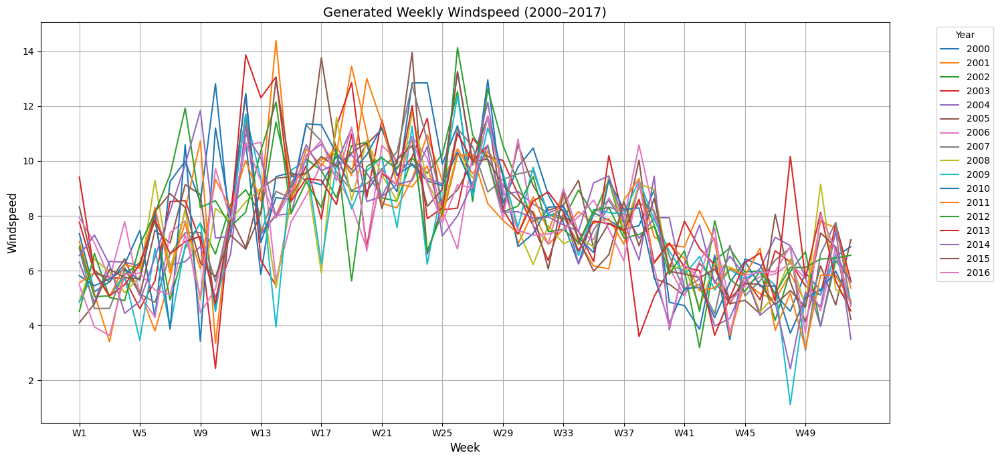

In [ ]:
# Compute the mean across all available years for each week
weekly_mean_wspd = weekly_avg_wspd.mean(axis=0)
weekly_std_wspd = weekly_avg_wspd.std(axis=0)

# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2017)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean precipitation
    random_noise = np.random.normal(0, weekly_std_wspd, size=len(weekly_mean_wspd))  
    generated_wspd = weekly_mean_wspd + random_noise
    
    # Ensure precipitation values are non-negative
    generated_wspd = [max(0, value) for value in generated_wspd]
    
    # Store the generated data
    for week, wspd in zip(weeks, generated_wspd):
        generated_data.append({"Year": year, "Week": week, "wspd": wspd})

# Convert the list of generated data into a DataFrame
generated_df2 = pd.DataFrame(generated_data)

# Display the generated data (optional)
print(generated_df2.columns)

# Plot the generated data
plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df2[generated_df2['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['wspd'], label=str(year))

plt.title('Generated Weekly Windspeed (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#We have to code this easier 
generated_df2['Date'] = generated_df2.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)
generated_df2

,Year,Week,wspd,Date
0,2000,1,7.347522,2000-01-03
1,2000,2,5.230095,2000-01-10
2,2000,3,5.592553,2000-01-17
3,2000,4,6.234835,2000-01-24
4,2000,5,7.464722,2000-01-31
...,...,...,...,...
879,2016,48,6.889556,2016-11-28
880,2016,49,3.731066,2016-12-05
881,2016,50,8.051528,2016-12-12
882,2016,51,6.713183,2016-12-19


In [ ]:
weekly_avg_wspd

Week,1,2,3,4,5,6,7,8,9,10,...,43,44,45,46,47,48,49,50,51,52
Year,,,,,,,,,,,,,,,,,,,,,
2018,6.062857,5.200000,4.375000,4.666667,4.414286,6.085714,5.228571,5.171429,6.742857,6.185714,...,5.114286,5.228571,5.666667,6.000000,5.900000,4.985714,5.700000,4.816667,5.814286,6.383333
2019,5.783333,5.428571,5.833333,5.628571,5.542857,4.533333,6.342857,8.328571,11.557143,4.728571,...,6.183333,5.940000,5.071429,6.375000,4.383333,4.300000,4.520000,4.885714,6.933333,5.714286
2020,NaN,5.014286,5.000000,5.771429,6.425000,6.014286,6.114286,8.800000,5.650000,7.285714,...,6.466667,6.340000,6.050000,4.800000,6.275000,4.900000,4.100000,5.300000,5.642857,4.857143
2021,7.683333,5.214286,6.771429,5.528571,7.228571,6.357143,7.460000,8.750000,6.566667,7.214286,...,6.885714,5.157143,5.871429,6.214286,6.257143,9.428571,5.971429,8.185714,6.885714,4.742857
2022,4.414286,6.942857,4.566667,6.371429,6.600000,9.742857,4.933333,9.340000,7.371429,8.828571,...,5.357143,4.940000,5.771429,5.185714,5.385714,6.825000,4.933333,5.083333,7.133333,4.533333
2023,5.800000,6.350000,5.742857,6.914286,5.200000,6.433333,8.733333,6.640000,7.700000,10.050000,...,4.014286,4.300000,5.300000,7.200000,3.842857,4.785714,3.871429,NaN,7.483333,4.314286


In [ ]:
# Convert weekly_avg_prcp from wide to long format
weekly_avg_wspd_reset = weekly_avg_wspd.reset_index()  # Reset index to expose 'Year'
long_wspd = weekly_avg_wspd_reset.melt(
    id_vars='Year',           # Keep 'Year' as a column
    var_name='Week',          # Name for the variable column (previously wide headers)
    value_name='wspd'         # Name for the values
)

# Ensure Week is numeric
long_wspd['Week'] = long_wspd['Week'].astype(int)

# Concatenate generated_df1 (2000–2016) with long_prcp (2017–2023)
merged_wspd = pd.concat([generated_df2, long_wspd], ignore_index=True)

# Sort by Year and Week for continuity
merged_wspd = merged_wspd.sort_values(by=['Year', 'Week']).reset_index(drop=True)

# Convert Year and Week to Date (start of the week)
merged_wspd['Date'] = merged_wspd.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

merged_wspd = merged_wspd.drop(columns=['Year', 'Week'])
merged_wspd

,wspd,Date
0,7.347522,2000-01-03
1,5.230095,2000-01-10
2,5.592553,2000-01-17
3,6.234835,2000-01-24
4,7.464722,2000-01-31
...,...,...
1191,4.785714,2023-11-27
1192,3.871429,2023-12-04
1193,NaN,2023-12-11
1194,7.483333,2023-12-18


In [ ]:
# Merge real_data (2018–2023) and generated_df (2000–2017)
merged_data_sierre2 = pd.concat([merged_data_sierre1, merged_wspd], ignore_index=True)

# Group by Date and combine rows with the same date
merged_data_sierre2 = merged_data_sierre2.groupby('Date').agg({
    'tavg': 'mean',  # Take the mean if duplicates exist
    'prcp': 'mean',
    'wspd': 'mean',
}).reset_index()

# Sort the merged data by Date
merged_data_sierre2 = merged_data_sierre2.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame & rename columns
merged_data_sierre2 = merged_data_sierre2.rename(columns={'tavg': 'tavg_sierre', 'prcp': 'prcp_sierre', "wspd": 'wspd_sierre'})
merged_data_sierre2 

,Date,tavg_sierre,prcp_sierre,wspd_sierre
0,2000-01-03,-0.411242,0.785401,7.347522
1,2000-01-10,-1.599595,3.816001,5.230095
2,2000-01-17,-4.871539,0.260596,5.592553
3,2000-01-24,0.973337,0.099203,6.234835
4,2000-01-31,3.632865,1.202356,7.464722
...,...,...,...,...
1244,2023-11-27,-2.771429,0.371429,4.785714
1245,2023-12-04,2.028571,3.842857,3.871429
1246,2023-12-11,-3.157143,0.000000,NaN
1247,2023-12-18,-2.285714,1.128571,7.483333


**St.Bernhard DataSet**

In [ ]:
# Adjusted to handle Bernhard files
dataframes = []

for year in range(2000, 2024):
    try:
        # General case for all years
        filepath = f"Data//Bernhard{year}.csv"
        
        # Read the CSV and append to the list
        dataframes.append(pd.read_csv(filepath))
    except FileNotFoundError:
        print(f"File for year {year} not found: {filepath}")

# Concatenate all the dataframes
bernhard = pd.concat(dataframes, ignore_index=True)

# Display the concatenated dataframe (optional)
bernhard

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2000-01-01,NaN,-9.4,-6.5,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2000-01-02,NaN,-7.8,-0.8,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2000-01-03,NaN,-3.8,-0.9,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2000-01-04,NaN,-7.4,-0.4,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,2000-01-05,NaN,-6.0,0.1,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
8427,2023-12-27,1.7,-0.5,4.1,0.0,NaN,285.0,12.2,31.5,NaN,NaN
8428,2023-12-28,0.1,-2.8,2.2,0.1,NaN,278.0,12.4,31.5,NaN,NaN
8429,2023-12-29,-2.1,-4.3,0.0,0.2,NaN,285.0,8.8,25.9,NaN,NaN
8430,2023-12-30,-4.4,-6.9,-2.5,0.0,NaN,270.0,12.4,31.5,NaN,NaN


In [ ]:
# Durchschnitt der ersten 6 Zeilen
averages_bernhard = [bernhard.head(6).mean(numeric_only=True)]

# Durchschnitt für jeweils 7 Zeilen
for i in range(6, len(bernhard), 7):
    chunk = bernhard.iloc[i:i + 7]
    averages_bernhard.append(chunk.mean(numeric_only=True))

# Neuer DataFrame aus den Durchschnitten
averages_df_bernhard = pd.DataFrame(averages_bernhard)

# Hinzufügen einer Datumsspalte
start_date = datetime.strptime("2000-01-03", "%Y-%m-%d")  # Startdatum
dates = [start_date + timedelta(days=7 * i) for i in range(len(averages_df_bernhard))]
averages_df_bernhard.insert(0, "Date", dates)

# Ausgabe der ersten Zeilen des neuen DataFrames
averages_df_bernhard

,Date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2000-01-03,NaN,-6.583333,-1.516667,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
1,2000-01-10,NaN,-9.542857,-6.228571,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
2,2000-01-17,NaN,-9.642857,-4.942857,0.614286,NaN,NaN,NaN,NaN,NaN,NaN
3,2000-01-24,NaN,-14.185714,-9.171429,4.957143,NaN,NaN,NaN,NaN,NaN,NaN
4,2000-01-31,NaN,-6.028571,-0.571429,9.600000,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1200,2023-01-02,-8.014286,-11.857143,-4.785714,11.400000,NaN,164.714286,22.571429,52.371429,NaN,NaN
1201,2023-01-09,-3.957143,-6.714286,-0.642857,12.271429,NaN,161.857143,17.971429,50.800000,NaN,NaN
1202,2023-01-16,-2.585714,-4.571429,-0.328571,0.457143,NaN,104.714286,17.514286,35.742857,NaN,NaN
1203,2023-01-23,-2.271429,-4.900000,0.500000,1.057143,NaN,97.857143,28.771429,66.114286,NaN,NaN


In [ ]:
#Keine guten Daten für sow, sunshine und pres für uns sind nur wdspd, tvag und prcp wirklich relevant de rest droppen wir 
columns_to_drop = ["snow", "wdir", "wpgt", "pres", "tsun"]
averages_df_bernhard = averages_df_bernhard.drop(columns=columns_to_drop)
averages_df_bernhard

,Date,tavg,tmin,tmax,prcp,wspd
0,2000-01-03,NaN,-6.583333,-1.516667,0.000000,NaN
1,2000-01-10,NaN,-9.542857,-6.228571,0.000000,NaN
2,2000-01-17,NaN,-9.642857,-4.942857,0.614286,NaN
3,2000-01-24,NaN,-14.185714,-9.171429,4.957143,NaN
4,2000-01-31,NaN,-6.028571,-0.571429,9.600000,NaN
...,...,...,...,...,...,...
1200,2023-01-02,-8.014286,-11.857143,-4.785714,11.400000,22.571429
1201,2023-01-09,-3.957143,-6.714286,-0.642857,12.271429,17.971429
1202,2023-01-16,-2.585714,-4.571429,-0.328571,0.457143,17.514286
1203,2023-01-23,-2.271429,-4.900000,0.500000,1.057143,28.771429


In [ ]:
# Count the missing values for each column
missing_values = averages_df_bernhard.isnull().sum()

# Display the result
print("Missing values in each column:")
print(missing_values)


Missing values in each column:
Date      0
tavg     79
tmin      0
tmax      7
prcp     11
wspd    920
dtype: int64


In [ ]:
# Drop the 'wspd' column
averages_df_bernhard = averages_df_bernhard.drop(columns=["wspd"])
# Fill missing values in 'tavg' and 'prcp' using the mean of the same week across all years
for col in ['tavg', 'prcp',"tmax"]:
    for i in range(len(averages_df_bernhard)):
        # Check if the value is NaN
        if pd.isna(averages_df_bernhard.loc[i, col]):
            # Extract the week of the current row
            current_date = averages_df_bernhard.loc[i, 'Date']
            current_week = current_date.isocalendar()[1]  # Week number
            
            # Filter rows with the same week but exclude NaN values
            same_week_rows = averages_df_bernhard[
                averages_df_bernhard['Date'].apply(lambda x: x.isocalendar()[1]) == current_week
            ][col].dropna()
            
            # Calculate the mean of the same week across all other years
            if not same_week_rows.empty:
                week_mean = same_week_rows.mean()
                averages_df_bernhard.loc[i, col] = week_mean

averages_df_bernhard = averages_df_bernhard.rename(columns={'tavg': 'tavg_bernhard', 'prcp': 'prcp_bernhard', "tmin": 'tmin_bernhard', 'tmax': 'tmax_bernhard'})
averages_df_bernhard


,Date,tavg_bernhard,tmin_bernhard,tmax_bernhard,prcp_bernhard
0,2000-01-03,-5.930519,-6.583333,-1.516667,0.000000
1,2000-01-10,-6.330519,-9.542857,-6.228571,0.000000
2,2000-01-17,-6.437013,-9.642857,-4.942857,0.614286
3,2000-01-24,-4.964286,-14.185714,-9.171429,4.957143
4,2000-01-31,-5.551558,-6.028571,-0.571429,9.600000
...,...,...,...,...,...
1200,2023-01-02,-8.014286,-11.857143,-4.785714,11.400000
1201,2023-01-09,-3.957143,-6.714286,-0.642857,12.271429
1202,2023-01-16,-2.585714,-4.571429,-0.328571,0.457143
1203,2023-01-23,-2.271429,-4.900000,0.500000,1.057143


In [ ]:
missing_values = averages_df_bernhard.isnull().sum()

# Display the result
print("Missing values in each column:")
print(missing_values)
#There are no missing data left

Missing values in each column:
Date             0
tavg_bernhard    0
tmin_bernhard    0
tmax_bernhard    0
prcp_bernhard    0
dtype: int64


**Aigle DataSet**

In [ ]:
aigle2018 = pd.read_csv("Data//Aigle2018.csv")
aigle2019 = pd.read_csv("Data//Aigle2019.csv")
aigle2020 = pd.read_csv("Data//Aigle2020.csv")
aigle2021 = pd.read_csv("Data//Aigle2021.csv")
aigle2022 = pd.read_csv("Data//Aigle2022.csv")
aigle2023 = pd.read_csv("Data//Aigle2023.csv")

# Initialize an empty list to hold the DataFrames
dataframes1 = []

# Loop through the range of years
for year in range(2018, 2024):
    try:
        # Construct the file path dynamically
        filepath1 = f"Data//Aigle{year}.csv"
        
        # Read the CSV file and append to the list
        dataframes1.append(pd.read_csv(filepath1))
    except FileNotFoundError:
        # Handle missing files gracefully
        print(f"File for year {year} not found: {filepath1}")

# Concatenate all the DataFrames into one
aigle = pd.concat(dataframes1, ignore_index=True)
aigle


,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2186,2023-12-27,3.2,-0.3,7.0,NaN,NaN,176.0,6.7,20.4,1024.7,NaN
2187,2023-12-28,2.9,-0.5,6.5,NaN,NaN,166.0,5.1,18.5,1025.1,NaN
2188,2023-12-29,5.5,2.6,9.3,NaN,NaN,170.0,4.8,14.8,1022.9,NaN
2189,2023-12-30,5.2,2.6,9.3,NaN,NaN,168.0,5.9,20.4,1020.8,NaN


 For the first half of 2018 there is no data, recording starts at 21.7.2018 we drop the oberservations before, we only focus on wspd and tvag as there is no Niederschlag in this dataset

In [ ]:
aigle = aigle[["date", "tavg", "wspd"]]
aigle = aigle[aigle['date'] >= '2018-07-21']
aigle

,date,tavg,wspd
201,2018-07-21,18.5,6.2
202,2018-07-22,19.7,7.2
203,2018-07-23,21.6,7.7
204,2018-07-24,22.2,6.6
205,2018-07-25,23.3,8.2
...,...,...,...
2186,2023-12-27,3.2,6.7
2187,2023-12-28,2.9,5.1
2188,2023-12-29,5.5,4.8
2189,2023-12-30,5.2,5.9


In [ ]:
# Durchschnitt der ersten 6 Zeilen
averages_aigle = [aigle.head(6).mean(numeric_only=True)]

# Durchschnitt für jeweils 7 Zeilen
for i in range(6, len(sion), 7):
    chunk = aigle.iloc[i:i + 7]
    averages_aigle.append(chunk.mean(numeric_only=True))

# Neuer DataFrame aus den Durchschnitten
averages_df_aigle = pd.DataFrame(averages_aigle)

# Hinzufügen einer Datumsspalte
start_date = datetime.strptime("2018-07-23", "%Y-%m-%d")
dates = [start_date + timedelta(days=7 * i) for i in range(len(averages_df_aigle))]
averages_df_aigle.insert(0, "Date", dates)

averages_df_aigle

,Date,tavg,wspd
0,2018-07-23,21.450000,7.083333
1,2018-07-30,23.128571,6.742857
2,2018-08-06,23.928571,8.800000
3,2018-08-13,19.257143,6.728571
4,2018-08-20,21.457143,7.014286
...,...,...,...
1197,2041-07-01,NaN,NaN
1198,2041-07-08,NaN,NaN
1199,2041-07-15,NaN,NaN
1200,2041-07-22,NaN,NaN


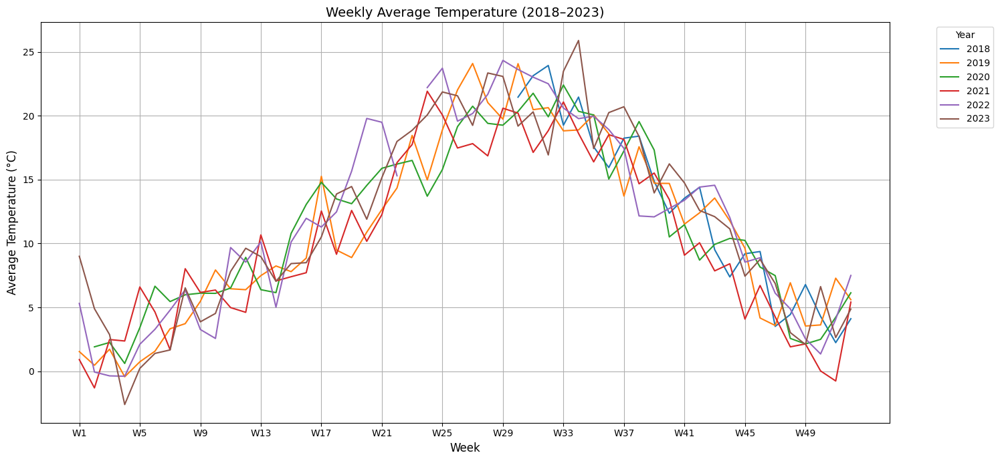

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_aigle['Date'] = pd.to_datetime(averages_df_aigle['Date'])

# Extract year and week number
averages_df_aigle['Year'] = averages_df_aigle['Date'].dt.year
averages_df_aigle['Week'] = averages_df_aigle['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_aigle = averages_df_aigle[(averages_df_aigle['Year'] >= 2018) & (averages_df_aigle['Year'] <= 2023)]
averages_df_aigle = averages_df_aigle[averages_df_aigle['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_temp = averages_df_aigle.groupby(['Year', 'Week'])['tavg'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Temperature (2018–2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

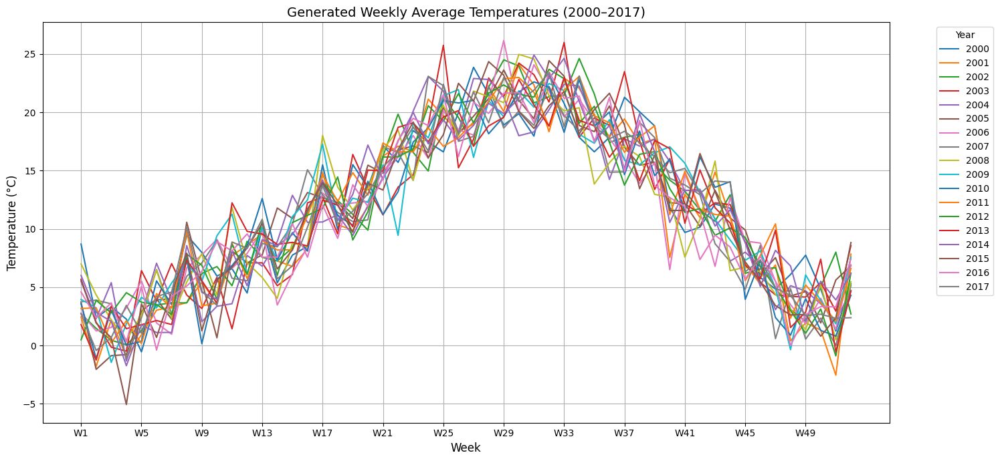

In [ ]:
# Assume 'weekly_avg_temp' is your weekly average temperature DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_temp = weekly_avg_temp.mean(axis=0)

# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2018)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean temperatures
    random_noise = np.random.normal(0, 2, size=len(weekly_mean_temp))  
    generated_temps = weekly_mean_temp + random_noise
    
    # Store the generated data
    for week, temp in zip(weeks, generated_temps):
        generated_data.append({"Year": year, "Week": week, "tavg": temp})

# Convert the list of generated data into a DataFrame
generated_df = pd.DataFrame(generated_data)

plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df[generated_df['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['tavg'], label=str(year))

plt.title('Generated Weekly Average Temperatures (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

# Convert Year and Week to Date
generated_df['Date'] = generated_df.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

# Drop Year and Week columns as they're no longer needed
generated_df = generated_df.drop(columns=['Year', 'Week'])

# Merge real_data (2018-2023) and generated_df (2000-2017)
# Assuming real_data has a 'Date' column and other relevant columns
merged_data_aigle = pd.concat([averages_df_aigle, generated_df], ignore_index=True)

# Sort the merged data by Date
merged_data_aigle = merged_data_aigle.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame
merged_data_aigle

,Date,tavg,wspd,Year,Week
0,2000-01-03,8.700877,NaN,NaN,<NA>
1,2000-01-10,2.387637,NaN,NaN,<NA>
2,2000-01-17,3.314527,NaN,NaN,<NA>
3,2000-01-24,2.267254,NaN,NaN,<NA>
4,2000-01-31,-0.540552,NaN,NaN,<NA>
...,...,...,...,...,...
1214,2023-11-27,3.028571,9.757143,2023.0,48
1215,2023-12-04,2.100000,11.228571,2023.0,49
1216,2023-12-11,6.628571,9.657143,2023.0,50
1217,2023-12-18,2.642857,4.385714,2023.0,51


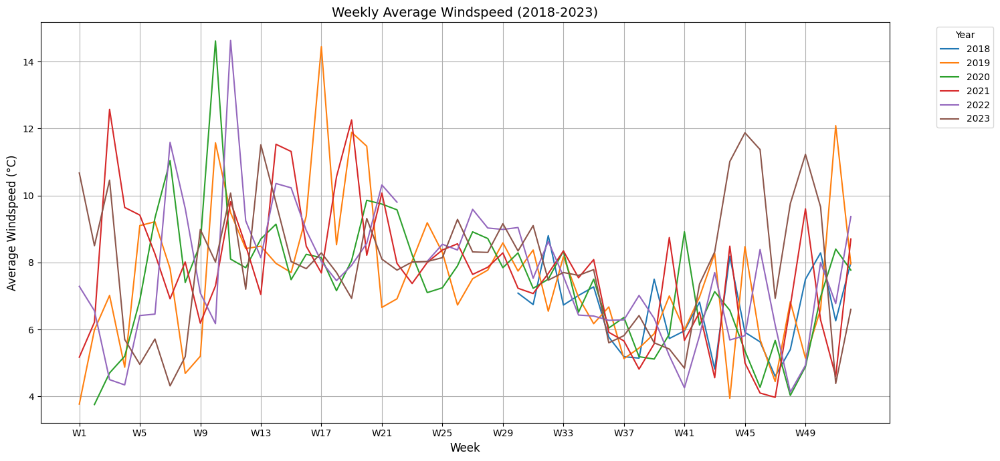

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_aigle['Date'] = pd.to_datetime(averages_df_aigle['Date'])

# Extract year and week number
averages_df_aigle['Year'] = averages_df_aigle['Date'].dt.year
averages_df_aigle['Week'] = averages_df_aigle['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_aigle = averages_df_aigle[(averages_df_aigle['Year'] >= 2018) & (averages_df_aigle['Year'] <= 2023)]
averages_df_aigle = averages_df_aigle[averages_df_aigle['Week'] <= 52]

# Group by Year and Week and calculate the weekly average windspeed
weekly_avg_wspd = averages_df_aigle.groupby(['Year', 'Week'])['wspd'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_wspd.index:
    plt.plot(range(1, 53), weekly_avg_wspd.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Windspeed (2018-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Windspeed (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)]) 
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

Index(['Year', 'Week', 'wspd'], dtype='object')


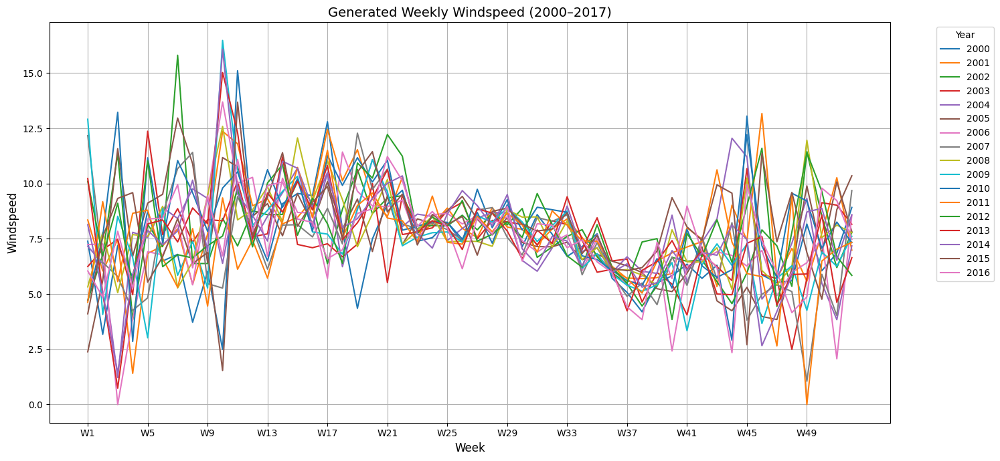

In [ ]:

# Assume 'weekly_avg_prcp' is your weekly average precipitation DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_wspd = weekly_avg_wspd.mean(axis=0)
weekly_std_wspd = weekly_avg_wspd.std(axis=0)

# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2017)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean precipitation
    random_noise = np.random.normal(0, weekly_std_wspd, size=len(weekly_mean_wspd))  
    generated_wspd = weekly_mean_wspd + random_noise
    
    # Ensure precipitation values are non-negative
    generated_wspd = [max(0, value) for value in generated_wspd]
    
    # Store the generated data
    for week, wspd in zip(weeks, generated_wspd):
        generated_data.append({"Year": year, "Week": week, "wspd": wspd})

# Convert the list of generated data into a DataFrame
generated_df2 = pd.DataFrame(generated_data)

# Display the generated data (optional)
print(generated_df2.columns)

# Plot the generated data
plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df2[generated_df2['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['wspd'], label=str(year))

plt.title('Generated Weekly Windspeed (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:

generated_df2['Date'] = generated_df2.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)
generated_df2
# Convert weekly_avg_prcp from wide to long format
weekly_avg_wspd_reset = weekly_avg_wspd.reset_index()  # Reset index to expose 'Year'
long_wspd = weekly_avg_wspd_reset.melt(
    id_vars='Year',           # Keep 'Year' as a column
    var_name='Week',          # Name for the variable column (previously wide headers)
    value_name='wspd'         # Name for the values
)

# Ensure Week is numeric
long_wspd['Week'] = long_wspd['Week'].astype(int)

# Concatenate generated_df1 (2000–2016) with long_prcp (2017–2023)
merged_wspd = pd.concat([generated_df2, long_wspd], ignore_index=True)

# Sort by Year and Week for continuity
merged_wspd = merged_wspd.sort_values(by=['Year', 'Week']).reset_index(drop=True)

# Convert Year and Week to Date (start of the week)
merged_wspd['Date'] = merged_wspd.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

merged_wspd = merged_wspd.drop(columns=['Year', 'Week'])
merged_wspd

,wspd,Date
0,7.395098,2000-01-03
1,3.180928,2000-01-10
2,7.200038,2000-01-17
3,5.763300,2000-01-24
4,8.738478,2000-01-31
...,...,...
1191,9.757143,2023-11-27
1192,11.228571,2023-12-04
1193,9.657143,2023-12-11
1194,4.385714,2023-12-18


In [ ]:
# Merge real_data (2018–2023) and generated_df (2000–2017)
merged_data_aigle1 = pd.concat([merged_data_aigle, merged_wspd], ignore_index=True)

# Group by Date and combine rows with the same date
merged_data_aigle1 = merged_data_aigle1.groupby('Date').agg({
    'tavg': 'mean',  # Take the mean if duplicates exist
    'wspd': 'mean',
}).reset_index()

# Sort the merged data by Date
merged_data_aigle1 = merged_data_aigle1.sort_values(by='Date').reset_index(drop=True)

#Rename
merged_data_aigle1 = merged_data_aigle1.rename(columns={'tavg': 'tavg_aigle', 'wspd': 'wspd_aigle'})

# Display the merged DataFrame
merged_data_aigle1

,Date,tavg_aigle,wspd_aigle
0,2000-01-03,8.700877,7.395098
1,2000-01-10,2.387637,3.180928
2,2000-01-17,3.314527,7.200038
3,2000-01-24,2.267254,5.763300
4,2000-01-31,-0.540552,8.738478
...,...,...,...
1244,2023-11-27,3.028571,9.757143
1245,2023-12-04,2.100000,11.228571
1246,2023-12-11,6.628571,9.657143
1247,2023-12-18,2.642857,4.385714


**Merge the whole weather data frames**

We have all dataframes now for each of the 4 weather stations it could be that they dont have the exact same data in the week which could be really different to merge. For this reason we try to merge the data on the closest data, we allow a 3 day tolerance 

In [ ]:
averages_df_sion['Date'] = pd.to_datetime(averages_df_sion['Date'])
merged_data_sierre2['Date'] = pd.to_datetime(merged_data_sierre2['Date'])
averages_df_bernhard['Date'] = pd.to_datetime(averages_df_bernhard['Date'])
merged_data_aigle1['Date'] = pd.to_datetime(merged_data_aigle1['Date'])

averages_df_sion = averages_df_sion.sort_values(by='Date')
merged_data_sierre2 = merged_data_sierre2.sort_values(by='Date')
averages_df_bernhard = averages_df_bernhard.sort_values(by='Date')
merged_data_aigle1 = merged_data_aigle1.sort_values(by='Date')

# Perform sequential asof merges
merged = pd.merge_asof(
    averages_df_sion,
    merged_data_sierre2,
    on='Date',
    direction='nearest',  # Choose nearest match
    tolerance=pd.Timedelta('3 days')  # Allow a 3-day tolerance
)

merged = pd.merge_asof(
    merged,
    averages_df_bernhard,
    on='Date',
    direction='nearest',  # Choose nearest match
    tolerance=pd.Timedelta('3 days')  # Allow a 3-day tolerance
)

wallis_weatherdataset = pd.merge_asof(
    merged,
    merged_data_aigle1,
    on='Date',
    direction='nearest',  # Choose nearest match
    tolerance=pd.Timedelta('3 days')  # Allow a 3-day tolerance
)

# Display the merged DataFrame
wallis_weatherdataset

,Date,tavg_sion,tmin_sion,tmax_sion,prcp_sion,snow_sion,wdir_sion,wspd_sion,wpgt_sion,pres_sion,...,Week,tavg_sierre,prcp_sierre,wspd_sierre,tavg_bernhard,tmin_bernhard,tmax_bernhard,prcp_bernhard,tavg_aigle,wspd_aigle
0,2000-01-03,-2.483333,-6.100000,2.016667,0.000000,78.333333,69.000000,6.540000,NaN,1030.900000,...,1,-0.411242,0.785401,7.347522,-5.930519,-6.583333,-1.516667,0.000000,8.700877,7.395098
1,2000-01-10,-1.728571,-5.257143,3.085714,0.000000,51.428571,78.000000,5.200000,NaN,1029.350000,...,2,-1.599595,3.816001,5.230095,-6.330519,-9.542857,-6.228571,0.000000,2.387637,3.180928
2,2000-01-17,-2.414286,-6.457143,2.142857,0.000000,48.571429,186.000000,4.375000,NaN,1027.675000,...,3,-4.871539,0.260596,5.592553,-6.437013,-9.642857,-4.942857,0.614286,3.314527,7.200038
3,2000-01-24,-3.371429,-7.185714,1.185714,0.128571,42.857143,116.000000,4.666667,NaN,1023.916667,...,4,0.973337,0.099203,6.234835,-4.964286,-14.185714,-9.171429,4.957143,2.267254,5.763300
4,2000-01-31,1.500000,-2.342857,6.171429,3.085714,28.571429,NaN,4.414286,NaN,1027.083333,...,5,3.632865,1.202356,7.464722,-5.551558,-6.028571,-0.571429,9.600000,-0.540552,8.738478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1193,2022-12-12,-0.071429,-3.285714,2.271429,9.357143,100.000000,109.000000,4.800000,20.014286,1013.457143,...,50,-1.800000,0.142857,5.083333,-3.300000,-5.957143,-0.814286,16.285714,1.357143,8.000000
1194,2022-12-19,3.128571,0.842857,5.785714,11.985714,37.142857,95.428571,4.114286,19.857143,1016.171429,...,51,-1.071429,5.128571,7.133333,-2.114286,-5.342857,1.057143,1.228571,4.071429,6.771429
1195,2022-12-26,2.628571,-1.371429,7.771429,0.000000,0.000000,137.428571,4.571429,20.857143,1033.414286,...,52,-0.714286,0.757143,4.533333,-6.442857,-9.242857,-3.100000,1.914286,7.500000,9.371429
1196,2023-01-02,4.771429,0.414286,9.742857,0.342857,0.000000,159.428571,8.057143,31.471429,1021.957143,...,1,-0.800000,0.000000,5.800000,-8.014286,-11.857143,-4.785714,11.400000,9.000000,10.671429


# Tessin Weather Data

**Minusio Dataset**

In [ ]:
dataframes = []

# Loop through the years from 2000 to 2023
for year in range(2000, 2024):
    try:
        # General case for all years
        filepath = f"Data//tessin{year}.csv"
        
        # Read the CSV file and append to the list
        dataframes.append(pd.read_csv(filepath))
    except FileNotFoundError:
        # Print a message if the file is not found
        print(f"File for year {year} not found: {filepath}")

# Concatenate all the dataframes into one
tessin = pd.concat(dataframes, ignore_index=True)

# Display the concatenated DataFrame (optional)
tessin

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2000-01-01,-2.2,-5.7,1.8,NaN,NaN,96.0,3.9,NaN,1027.5,NaN
1,2000-01-02,-1.7,-5.9,3.9,NaN,NaN,94.0,5.6,NaN,1028.7,NaN
2,2000-01-03,-1.5,-5.7,5.0,NaN,NaN,NaN,2.7,NaN,1031.3,NaN
3,2000-01-04,-1.2,-5.6,5.1,NaN,NaN,NaN,3.1,NaN,1025.5,NaN
4,2000-01-05,-0.3,-3.8,4.8,NaN,NaN,NaN,2.9,NaN,1024.1,NaN
...,...,...,...,...,...,...,...,...,...,...,...
8761,2023-12-27,2.8,-2.3,8.8,0.0,NaN,92.0,2.3,9.3,1027.4,NaN
8762,2023-12-28,5.6,0.9,8.8,0.0,NaN,98.0,4.3,13.0,1028.1,NaN
8763,2023-12-29,6.2,4.4,8.5,0.0,NaN,41.0,2.0,7.4,1023.7,NaN
8764,2023-12-30,4.1,-0.5,9.4,0.0,NaN,110.0,2.1,7.4,1021.8,NaN


In [ ]:
# Durchschnitt der ersten 6 Zeilen
averages_tessin = [tessin.head(6).mean(numeric_only=True)]

# Durchschnitt für jeweils 7 Zeilen
for i in range(6, len(tessin), 7):
    chunk = tessin.iloc[i:i + 7]
    averages_tessin.append(chunk.mean(numeric_only=True))

# Neuer DataFrame aus den Durchschnitten
averages_df_minusio = pd.DataFrame(averages_tessin)

# Hinzufügen einer Datumsspalte
start_date = datetime.strptime("2000-01-03", "%Y-%m-%d")  # Startdatum
dates = [start_date + timedelta(days=7 * i) for i in range(len(averages_df_minusio))]
averages_df_minusio.insert(0, "Date", dates)

# Display the DataFrame
averages_df_minusio

,Date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2000-01-03,-1.380000,-5.340000,4.120000,NaN,NaN,95.000000,3.640000,NaN,1027.420000,NaN
1,2000-01-10,0.600000,-2.683333,4.500000,NaN,NaN,128.000000,3.200000,NaN,1029.100000,NaN
2,2000-01-17,2.900000,-1.675000,7.900000,NaN,NaN,118.666667,6.700000,NaN,1023.775000,NaN
3,2000-01-24,2.233333,-3.616667,8.266667,NaN,NaN,96.200000,8.716667,NaN,1017.900000,NaN
4,2000-01-31,2.683333,-2.650000,9.050000,NaN,NaN,102.500000,5.433333,NaN,1023.466667,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1248,2023-12-04,2.971429,-0.742857,6.885714,9.742857,NaN,73.000000,6.471429,29.371429,1013.357143,NaN
1249,2023-12-11,4.571429,1.000000,8.428571,1.271429,NaN,104.428571,3.257143,13.214286,1014.085714,NaN
1250,2023-12-18,3.671429,-0.942857,10.928571,0.000000,NaN,83.142857,5.214286,24.585714,1028.485714,NaN
1251,2023-12-25,6.214286,1.171429,13.228571,0.000000,NaN,115.000000,3.742857,21.171429,1017.771429,NaN


In [ ]:
missing_values = averages_df_minusio.isnull().sum()

# Display the result
print("Missing values in each column:")
print(missing_values)


Missing values in each column:
Date       0
tavg       7
tmin       7
tmax       7
prcp     744
snow    1253
wdir      80
wspd      23
wpgt     969
pres       8
tsun    1253
dtype: int64


In [ ]:
missing_prcp = averages_df_minusio[averages_df_minusio['Date'].dt.year == 2012]
missing_prcp

,Date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
626,2012-01-02,2.242857,-1.957143,7.614286,NaN,NaN,87.666667,5.128571,NaN,1019.585714,NaN
627,2012-01-09,3.642857,-0.928571,10.028571,NaN,NaN,93.333333,5.400000,NaN,1023.800000,NaN
628,2012-01-16,-0.557143,-5.142857,6.585714,NaN,NaN,94.000000,4.142857,NaN,1025.442857,NaN
629,2012-01-23,3.128571,-2.214286,9.985714,NaN,NaN,87.250000,5.971429,NaN,1016.842857,NaN
630,2012-01-30,-0.357143,-2.757143,1.914286,NaN,NaN,236.000000,3.328571,NaN,1022.728571,NaN
631,2012-02-06,-4.700000,-10.642857,1.314286,NaN,NaN,159.000000,5.428571,NaN,1022.242857,NaN
632,2012-02-13,-1.000000,-6.857143,4.385714,NaN,NaN,107.166667,7.114286,NaN,1018.157143,NaN
633,2012-02-20,3.371429,-1.185714,9.528571,NaN,NaN,139.000000,3.771429,NaN,1025.000000,NaN
634,2012-02-27,8.842857,1.342857,17.671429,NaN,NaN,73.000000,6.457143,NaN,1020.442857,NaN
635,2012-03-05,7.928571,2.714286,13.842857,NaN,NaN,151.333333,4.814286,NaN,1021.171429,NaN


There are lot of missing values for tsun and for wpgt, same for snow we will drop this columns (later after merging). We have also a lot of missing values in prcp before 2013. Because it is really important for our prediction and the other datasets have no prcp we have to use it and generate the missing prcp data for the minusio dataset


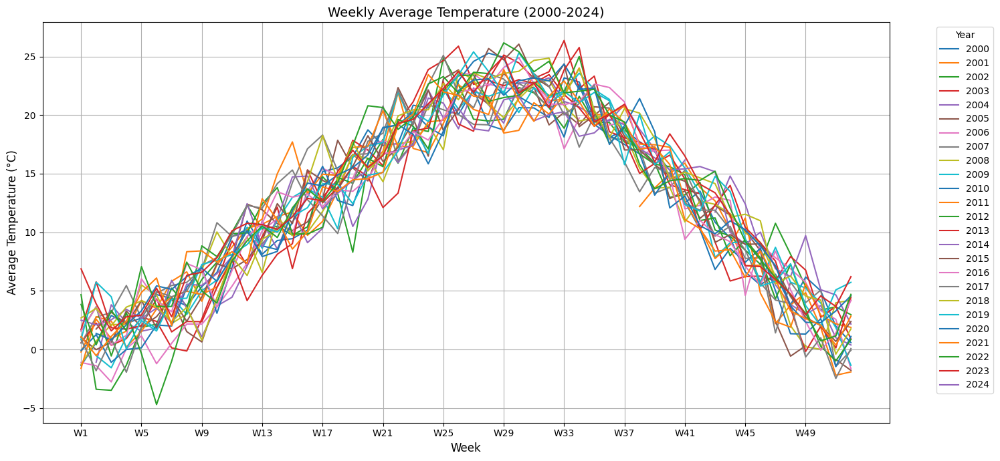

In [ ]:
#Plotting temperature from minusio

# Ensure 'Date' is in datetime format
averages_df_minusio['Date'] = pd.to_datetime(averages_df_minusio['Date'])

# Extract year and month
averages_df_minusio['Year'] = averages_df_minusio['Date'].dt.year
averages_df_minusio['Week'] = averages_df_minusio['Date'].dt.isocalendar().week

averages_df_minusio = averages_df_minusio[averages_df_minusio['Week'] <= 52]

# Group by Year and Month and calculate the monthly average temperature
weekly_avg_temp = averages_df_minusio.groupby(['Year', "Week"])['tavg'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 53 weeks

plt.title('Weekly Average Temperature (2000-2024)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()


/var/folders/kz/cdns3q5j33910y0dt9d7416m0000gn/T/ipykernel_14214/3038685196.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  averages_df_minusio['Date'] = pd.to_datetime(averages_df_minusio['Date'])
/var/folders/kz/cdns3q5j33910y0dt9d7416m0000gn/T/ipykernel_14214/3038685196.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  averages_df_minusio['Year'] = averages_df_minusio['Date'].dt.year
/var/folders/kz/cdns3q5j33910y0dt9d7416m0000gn/T/ipykernel_14214/3038685196.py:6: SettingWithCopyWarning: 
A value i

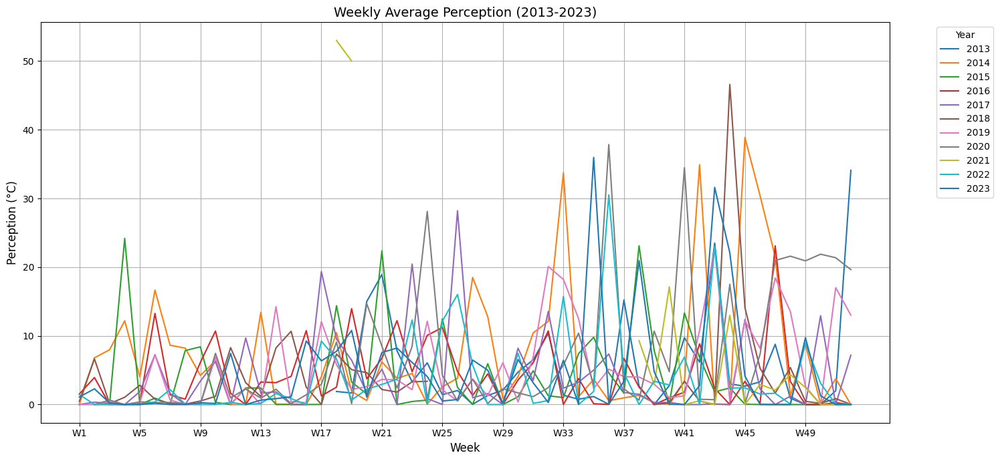

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_minusio['Date'] = pd.to_datetime(averages_df_minusio['Date'])

# Extract year and week number
averages_df_minusio['Year'] = averages_df_minusio['Date'].dt.year
averages_df_minusio['Week'] = averages_df_minusio['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_minusio = averages_df_minusio[(averages_df_minusio['Year'] >= 2013) & (averages_df_minusio['Year'] <= 2023)]
averages_df_minusio = averages_df_minusio[averages_df_minusio['Week'] <= 52]

# Group by Year and Week and calculate the weekly average precipitation
weekly_avg_prcp = averages_df_minusio.groupby(['Year', 'Week'])['prcp'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_prcp.index:
    plt.plot(range(1, 53), weekly_avg_prcp.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Perception (2013-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Perception (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

Index(['Year', 'Week', 'prcp'], dtype='object')


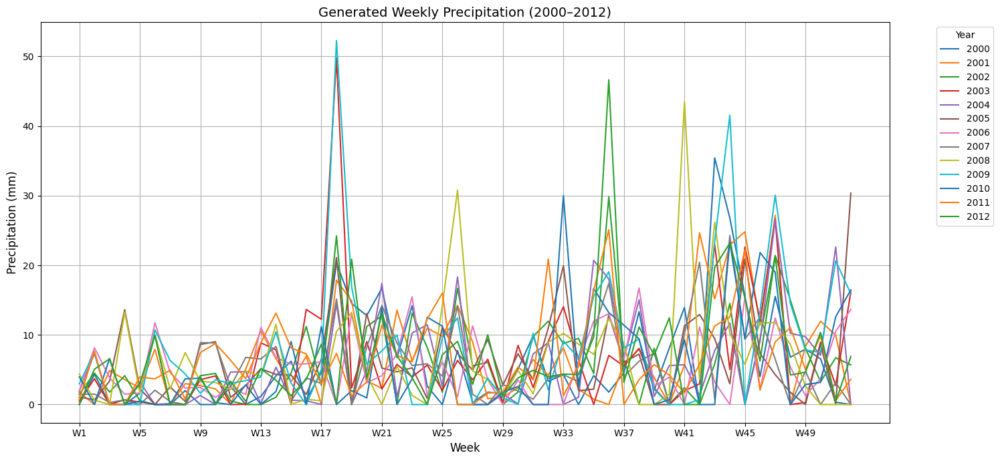

In [ ]:
# Compute the mean across all available years for each week
weekly_mean_prcp = weekly_avg_prcp.mean(axis=0)
weekly_std_prcp = weekly_avg_prcp.std(axis=0)

# Generate data for the missing years (2000–2012)
missing_years = range(2000, 2013)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean precipitation
    random_noise = np.random.normal(0, weekly_std_prcp, size=len(weekly_mean_prcp))  
    generated_prcp = weekly_mean_prcp + random_noise
    
    # Ensure precipitation values are non-negative
    generated_prcp = [max(0, value) for value in generated_prcp]
    
    # Store the generated data
    for week, prcp in zip(weeks, generated_prcp):
        generated_data.append({"Year": year, "Week": week, "prcp": prcp})

# Convert the list of generated data into a DataFrame
generated_df1 = pd.DataFrame(generated_data)

# Display the generated data (optional)
print(generated_df1.columns)

# Plot the generated data
plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df1[generated_df1['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['prcp'], label=str(year))

plt.title('Generated Weekly Precipitation (2000–2012)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Precipitation (mm)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#Merging

# Convert weekly_avg_prcp from wide to long format
weekly_avg_prcp_reset = weekly_avg_prcp.reset_index()  # Reset index to expose 'Year'
long_prcp = weekly_avg_prcp_reset.melt(
    id_vars='Year',           # Keep 'Year' as a column
    var_name='Week',          # Name for the variable column (previously wide headers)
    value_name='prcp'         # Name for the values
)

# Ensure Week is numeric
long_prcp['Week'] = long_prcp['Week'].astype(int)

# Concatenate generated_df1 (2000–2016) with long_prcp (2017–2023)
merged_prcp = pd.concat([generated_df1, long_prcp], ignore_index=True)

# Sort by Year and Week for continuity
merged_prcp = merged_prcp.sort_values(by=['Year', 'Week']).reset_index(drop=True)

# Convert Year and Week to Date (start of the week)
merged_prcp['Date'] = merged_prcp.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

merged_prcp = merged_prcp.drop(columns=['Year', 'Week'])
merged_prcp['Date'] = pd.to_datetime(merged_prcp['Date'])
merged_prcp

,prcp,Date
0,0.000000,2000-01-03
1,4.348509,2000-01-10
2,0.094005,2000-01-17
3,0.000000,2000-01-24
4,1.629867,2000-01-31
...,...,...
1243,0.000000,2023-11-27
1244,9.742857,2023-12-04
1245,1.271429,2023-12-11
1246,0.000000,2023-12-18


In [ ]:
#Ensure datetime on averages_df
averages_df_minusio['Date'] = pd.to_datetime(averages_df_minusio['Date'])
# Merge the two datasets on the 'Date' column
merged_data_minusio = pd.merge(averages_df_minusio, merged_prcp, on="Date", how="inner")
merged_data_minusio = merged_data_minusio.drop(columns='prcp_x')
merged_data_minusio = merged_data_minusio.rename(columns={'tavg': 'tavg_minusio', 'prcp_y': 'prcp_minusio', "wspd": 'wspd_minusio', 'tmin': 'tmin_minusio', 'tmax_y': 'tmax_minusio', "wdir": 'wdir_minusio'})
merged_data_minusio

,Date,tavg_minusio,tmin_minusio,tmax,snow,wdir_minusio,wspd_minusio,wpgt,pres,tsun,prcp_minusio
0,2000-01-03,-1.380000,-5.340000,4.120000,NaN,95.000000,3.640000,NaN,1027.420000,NaN,0.000000
1,2000-01-10,0.600000,-2.683333,4.500000,NaN,128.000000,3.200000,NaN,1029.100000,NaN,4.348509
2,2000-01-17,2.900000,-1.675000,7.900000,NaN,118.666667,6.700000,NaN,1023.775000,NaN,0.094005
3,2000-01-24,2.233333,-3.616667,8.266667,NaN,96.200000,8.716667,NaN,1017.900000,NaN,0.000000
4,2000-01-31,2.683333,-2.650000,9.050000,NaN,102.500000,5.433333,NaN,1023.466667,NaN,1.629867
...,...,...,...,...,...,...,...,...,...,...,...
1243,2023-11-27,4.728571,-1.428571,10.900000,NaN,92.571429,6.342857,35.457143,1007.557143,NaN,0.000000
1244,2023-12-04,2.971429,-0.742857,6.885714,NaN,73.000000,6.471429,29.371429,1013.357143,NaN,9.742857
1245,2023-12-11,4.571429,1.000000,8.428571,NaN,104.428571,3.257143,13.214286,1014.085714,NaN,1.271429
1246,2023-12-18,3.671429,-0.942857,10.928571,NaN,83.142857,5.214286,24.585714,1028.485714,NaN,0.000000


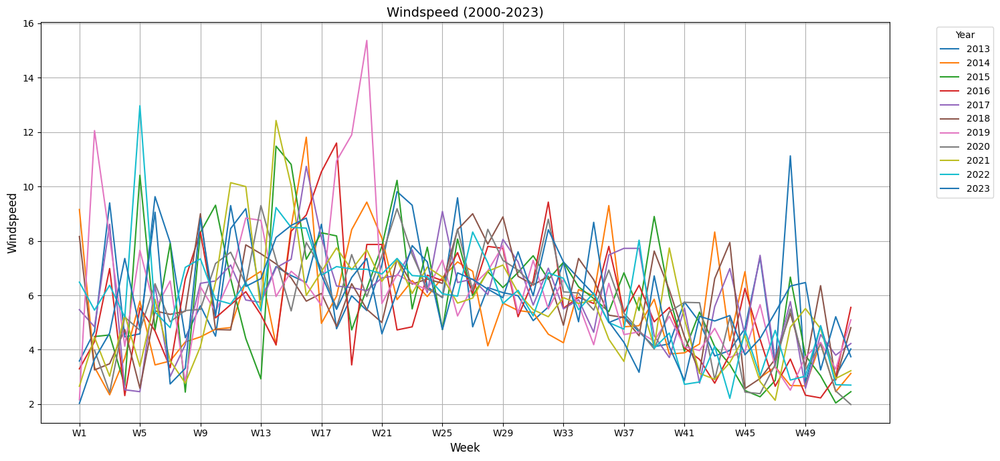

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_minusio['Date'] = pd.to_datetime(averages_df_minusio['Date'])

# Extract year and month
averages_df_minusio['Year'] = averages_df_minusio['Date'].dt.year
averages_df_minusio['Week'] = averages_df_minusio['Date'].dt.isocalendar().week

averages_df_minusio = averages_df_minusio[averages_df_minusio['Week'] <= 52]

# Group by Year and Month and calculate the monthly average temperature
weekly_avg_temp = averages_df_minusio.groupby(['Year', "Week"])['wspd'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 53 weeks

plt.title('Windspeed (2000-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()


**Loading Dataset Robiei**

In [ ]:
dataframes = []

# Loop through the years from 2000 to 2023
for year in range(2018, 2024):
    try:
        # General case for all years
        filepath = f"Data//Robiei{year}.csv"
        
        # Read the CSV file and append to the list
        dataframes.append(pd.read_csv(filepath))
    except FileNotFoundError:
        # Print a message if the file is not found
        print(f"File for year {year} not found: {filepath}")

# Concatenate all the dataframes into one
robiei = pd.concat(dataframes, ignore_index=True)

# Display the concatenated DataFrame (optional)
robiei

File for year 2018 not found: Data//Robiei2018.csv


,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2019-01-01,5.6,3.3,7.4,NaN,NaN,339.0,16.3,63.0,1024.8,NaN
1,2019-01-02,-4.6,-9.2,2.5,NaN,NaN,332.0,13.9,68.5,1028.8,NaN
2,2019-01-03,-5.8,-8.4,-3.6,NaN,NaN,358.0,19.8,55.5,1033.1,NaN
3,2019-01-04,-3.5,-5.8,-1.9,NaN,NaN,350.0,18.7,53.7,1031.2,NaN
4,2019-01-05,-0.1,-2.0,2.2,NaN,NaN,346.0,21.5,68.5,1026.3,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1821,2023-12-27,2.1,0.2,4.0,NaN,NaN,270.0,5.9,25.9,NaN,NaN
1822,2023-12-28,-0.9,-2.4,0.0,NaN,NaN,299.0,4.7,20.4,NaN,NaN
1823,2023-12-29,-1.1,-2.5,-0.3,NaN,NaN,302.0,4.3,16.7,NaN,NaN
1824,2023-12-30,-0.4,-2.6,1.3,NaN,NaN,289.0,7.2,22.2,NaN,NaN


In [ ]:
#Unfortunately no prcp and snow, we also drop sunshine and pres 
columns_to_drop = ["prcp" , "snow", "tsun"]
robiei = robiei.drop(columns =columns_to_drop)


In [ ]:
columns_to_drop = ["pres"]
robiei = robiei.drop(columns =columns_to_drop)

In [ ]:
# Durchschnitt der ersten 6 Zeilen
averages_robiei = [robiei.head(6).mean(numeric_only=True)]

# Durchschnitt für jeweils 7 Zeilen
for i in range(6, len(robiei), 7):
    chunk = robiei.iloc[i:i + 7]
    averages_robiei.append(chunk.mean(numeric_only=True))

# Neuer DataFrame aus den Durchschnitten
averages_df_robiei = pd.DataFrame(averages_robiei)

# Hinzufügen einer Datumsspalte
start_date = datetime.strptime("2019-01-07", "%Y-%m-%d")  # Startdatum
dates = [start_date + timedelta(days=7 * i) for i in range(len(averages_df_robiei))]
averages_df_robiei.insert(0, "Date", dates)

# Display the DataFrame
averages_df_robiei

,Date,tavg,tmin,tmax,wdir,wspd,wpgt
0,2019-01-07,-1.633333,-4.050000,1.050000,345.166667,18.916667,62.333333
1,2019-01-14,-3.814286,-5.700000,-1.628571,293.571429,18.200000,61.914286
2,2019-01-21,-5.357143,-7.542857,-3.242857,303.142857,7.085714,34.657143
3,2019-01-28,-6.028571,-7.628571,-3.614286,306.142857,12.714286,41.257143
4,2019-02-04,-7.500000,-8.942857,-6.014286,271.285714,9.914286,36.528571
...,...,...,...,...,...,...,...
256,2023-12-04,-4.728571,-6.642857,-2.842857,228.714286,8.957143,41.285714
257,2023-12-11,-3.971429,-5.600000,-2.042857,304.714286,7.000000,34.671429
258,2023-12-18,1.442857,-0.314286,3.071429,259.285714,10.742857,38.628571
259,2023-12-25,3.214286,1.228571,5.114286,275.285714,13.314286,53.714286


Ploting and Generating Temperature

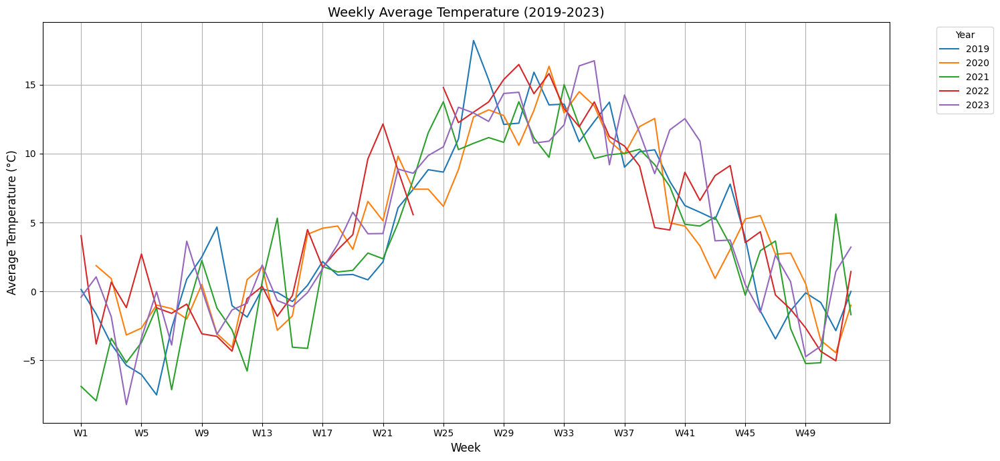

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_robiei['Date'] = pd.to_datetime(averages_df_robiei['Date'])

# Extract year and week number
averages_df_robiei['Year'] = averages_df_robiei['Date'].dt.year
averages_df_robiei['Week'] = averages_df_robiei['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_robiei = averages_df_robiei[(averages_df_robiei['Year'] >= 2019) & (averages_df_robiei['Year'] <= 2023)]
averages_df_robiei = averages_df_robiei[averages_df_robiei['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_temp = averages_df_robiei.groupby(['Year', 'Week'])['tavg'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Temperature (2019-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

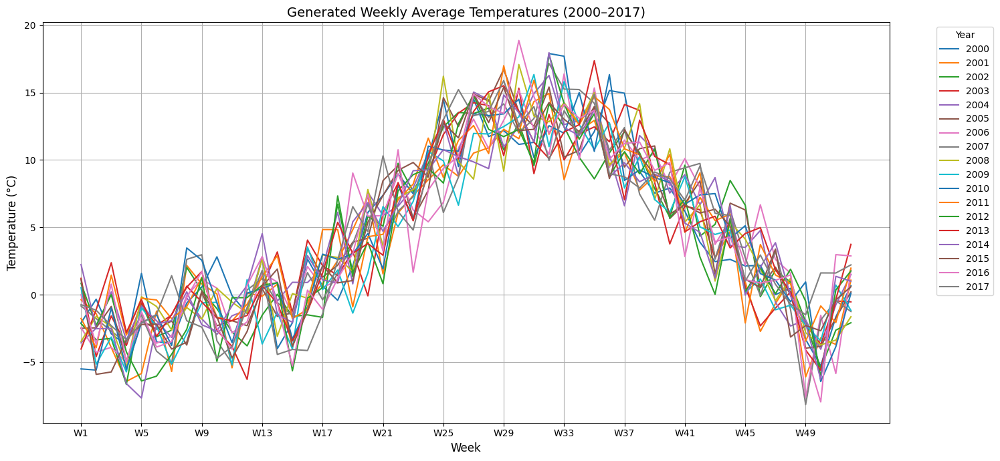

In [ ]:
# Assume 'weekly_avg_temp' is your weekly average temperature DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_temp = weekly_avg_temp.mean(axis=0)

# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2018)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean temperatures
    random_noise = np.random.normal(0, 2, size=len(weekly_mean_temp))  
    generated_temps = weekly_mean_temp + random_noise
    
    # Store the generated data
    for week, temp in zip(weeks, generated_temps):
        generated_data.append({"Year": year, "Week": week, "tavg": temp})

# Convert the list of generated data into a DataFrame
generated_df = pd.DataFrame(generated_data)

# Display the generated data (optional)
generated_df.columns

plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df[generated_df['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['tavg'], label=str(year))

plt.title('Generated Weekly Average Temperatures (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Convert Year and Week to Date
generated_df['Date'] = generated_df.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

# Drop Year and Week columns as they're no longer needed
generated_df = generated_df.drop(columns=['Year', 'Week'])

# Merge real_data (2018-2023) and generated_df (2000-2017)
# Assuming real_data has a 'Date' column and other relevant columns
merged_data_robiei = pd.concat([averages_df_robiei, generated_df], ignore_index=True)

# Sort the merged data by Date
merged_data_robiei = merged_data_robiei.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame
merged_data_robiei

,Date,tavg,tmin,tmax,wdir,wspd,wpgt,Year,Week
0,2000-01-03,-2.087567,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
1,2000-01-10,-0.335145,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
2,2000-01-17,-2.906296,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
3,2000-01-24,-3.747336,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
4,2000-01-31,1.577488,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
...,...,...,...,...,...,...,...,...,...
1190,2023-11-27,0.714286,-2.400000,2.842857,332.000000,15.428571,53.471429,2023.0,48
1191,2023-12-04,-4.728571,-6.642857,-2.842857,228.714286,8.957143,41.285714,2023.0,49
1192,2023-12-11,-3.971429,-5.600000,-2.042857,304.714286,7.000000,34.671429,2023.0,50
1193,2023-12-18,1.442857,-0.314286,3.071429,259.285714,10.742857,38.628571,2023.0,51


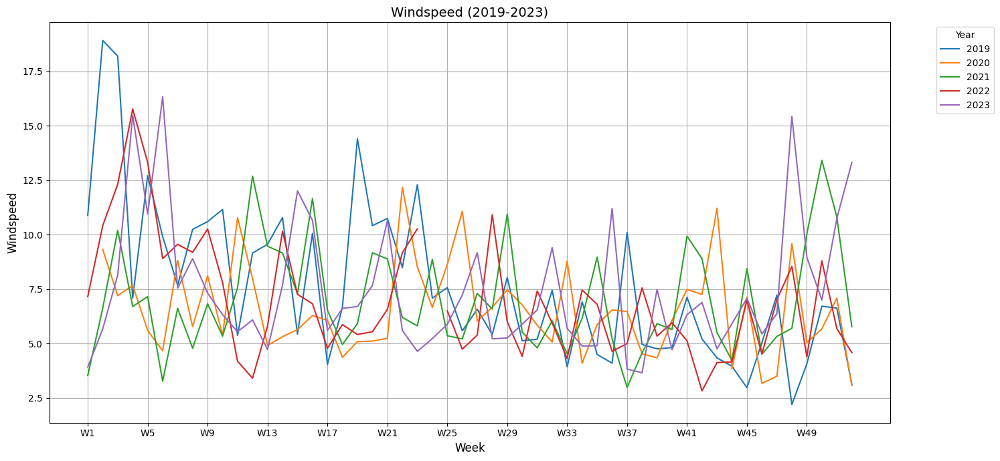

In [ ]:
# Extract year and week number
averages_df_robiei['Year'] = averages_df_robiei['Date'].dt.year
averages_df_robiei['Week'] = averages_df_robiei['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_robiei = averages_df_robiei[(averages_df_robiei['Year'] >= 2019) & (averages_df_robiei['Year'] <= 2023)]
averages_df_robiei = averages_df_robiei[averages_df_robiei['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_wspd = averages_df_robiei.groupby(['Year', 'Week'])['wspd'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_wspd.index:
    plt.plot(range(1, 53), weekly_avg_wspd.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Windspeed (2019-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

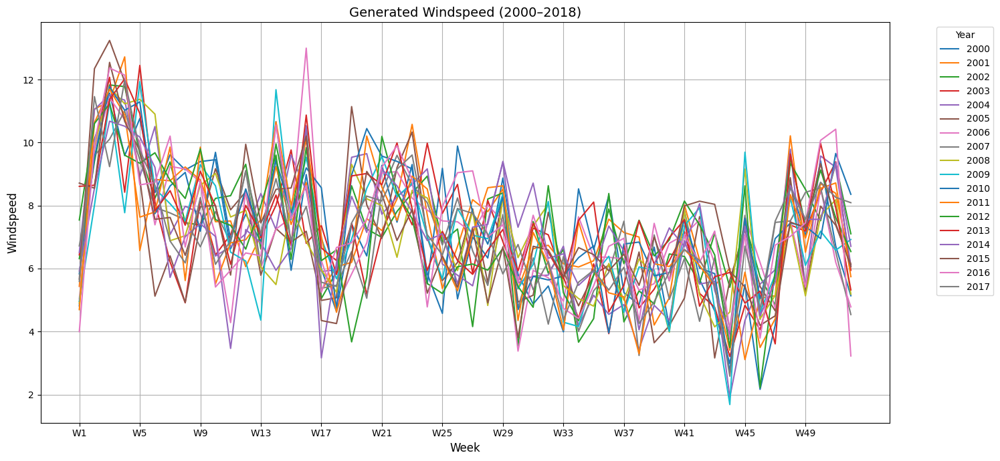

In [ ]:
# Assume 'weekly_avg_temp' is your weekly average temperature DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_wspd = weekly_avg_wspd.mean(axis=0)
weekly_std_wspd = weekly_avg_wspd.std(axis=0)
# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2018)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean temperatures
    random_noise = np.random.normal(0, 1.2 , size=len(weekly_mean_wspd))  
    generated_wspds = weekly_mean_wspd + random_noise
    
    # Store the generated data
    for week, wspd in zip(weeks, generated_wspds):
        generated_data.append({"Year": year, "Week": week, "wspd": wspd})

# Convert the list of generated data into a DataFrame
generated_df1 = pd.DataFrame(generated_data)

plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df1[generated_df1['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['wspd'], label=str(year))

plt.title('Generated Windspeed (2000–2018)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Convert weekly_avg_prcp from wide to long format
weekly_avg_wspd_reset = weekly_avg_wspd.reset_index()  # Reset index to expose 'Year'
long_wspd = weekly_avg_wspd_reset.melt(
    id_vars='Year',           # Keep 'Year' as a column
    var_name='Week',          # Name for the variable column (previously wide headers)
    value_name='wspd'         # Name for the values
)

# Ensure Week is numeric
long_wspd['Week'] = long_wspd['Week'].astype(int)

# Concatenate generated_df1 (2000–2016) with long_prcp (2017–2023)
merged_wspd = pd.concat([generated_df1, long_wspd], ignore_index=True)

# Sort by Year and Week for continuity
merged_wspd = merged_wspd.sort_values(by=['Year', 'Week']).reset_index(drop=True)

# Convert Year and Week to Date (start of the week)
merged_wspd['Date'] = merged_wspd.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

merged_wspd = merged_wspd.drop(columns=['Year', 'Week'])
merged_wspd

,wspd,Date
0,4.815827,2000-01-03
1,10.105099,2000-01-10
2,11.572026,2000-01-17
3,9.587354,2000-01-24
4,10.766174,2000-01-31
...,...,...
1191,15.428571,2023-11-27
1192,8.957143,2023-12-04
1193,7.000000,2023-12-11
1194,10.742857,2023-12-18


In [ ]:
# Merge real_data (2018–2023) and generated_df (2000–2017)
merged_data_robiei1 = pd.concat([merged_data_robiei, merged_wspd], ignore_index=True)

# Group by Date and combine rows with the same date
merged_data_robiei1 = merged_data_robiei1.groupby('Date').agg({
    'tavg': 'mean',  # Take the mean if duplicates exist
    'wspd': 'mean',
}).reset_index()

# Sort the merged data by Date
merged_data_robiei1 = merged_data_robiei1.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame & rename columns
merged_data_robiei1 = merged_data_robiei1.rename(columns={'tavg': 'tavg_robiei',"wspd": 'wspd_robiei'})
merged_data_robiei1

,Date,tavg_robiei,wspd_robiei
0,2000-01-03,-2.087567,4.815827
1,2000-01-10,-0.335145,10.105099
2,2000-01-17,-2.906296,11.572026
3,2000-01-24,-3.747336,9.587354
4,2000-01-31,1.577488,10.766174
...,...,...,...
1191,2023-11-27,0.714286,15.428571
1192,2023-12-04,-4.728571,8.957143
1193,2023-12-11,-3.971429,7.000000
1194,2023-12-18,1.442857,10.742857


In [ ]:
dataframes = []

# Loop through the years from 2000 to 2023
for year in range(2017, 2024):
    try:
        # General case for all years
        filepath = f"Data//Comprovasco{year}.csv"
        
        # Read the CSV file and append to the list
        dataframes.append(pd.read_csv(filepath))
    except FileNotFoundError:
        # Print a message if the file is not found
        print(f"File for year {year} not found: {filepath}")

# Concatenate all the dataframes into one
comprovasco = pd.concat(dataframes, ignore_index=True)

# Display the concatenated DataFrame (optional)
comprovasco

File for year 2017 not found: Data//Comprovasco2017.csv


,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2186,2023-12-27,4.2,2.5,7.8,NaN,NaN,318.0,4.7,13.0,1026.9,NaN
2187,2023-12-28,3.6,1.2,6.7,NaN,NaN,326.0,4.7,13.0,1028.4,NaN
2188,2023-12-29,4.6,3.1,7.9,NaN,NaN,321.0,4.4,11.1,1024.2,NaN
2189,2023-12-30,4.5,2.7,8.5,NaN,NaN,320.0,4.4,11.1,1021.7,NaN


In [ ]:
comprovasco = comprovasco[["date", "tavg", "wspd"]]
comprovasco = comprovasco[comprovasco['date'] >= '2018-07-21']
comprovasco

,date,tavg,wspd
201,2018-07-21,17.1,4.1
202,2018-07-22,19.5,10.2
203,2018-07-23,22.2,12.2
204,2018-07-24,21.1,6.7
205,2018-07-25,22.2,7.0
...,...,...,...
2186,2023-12-27,4.2,4.7
2187,2023-12-28,3.6,4.7
2188,2023-12-29,4.6,4.4
2189,2023-12-30,4.5,4.4


In [ ]:
# Durchschnitt der ersten 6 Zeilen
averages_comprovasco = [comprovasco.head(6).mean(numeric_only=True)]

# Durchschnitt für jeweils 7 Zeilen
for i in range(6, len(comprovasco), 7):
    chunk = comprovasco.iloc[i:i + 7]
    averages_comprovasco.append(chunk.mean(numeric_only=True))

# Neuer DataFrame aus den Durchschnitten
averages_df_comprovasco = pd.DataFrame(averages_comprovasco)

# Hinzufügen einer Datumsspalte
start_date = datetime.strptime("2018-07-23", "%Y-%m-%d")
dates = [start_date + timedelta(days=7 * i) for i in range(len(averages_df_comprovasco))]
averages_df_comprovasco.insert(0, "Date", dates)

averages_df_comprovasco

,Date,tavg,wspd
0,2018-07-23,20.833333,7.966667
1,2018-07-30,22.400000,6.385714
2,2018-08-06,22.471429,5.514286
3,2018-08-13,19.157143,5.985714
4,2018-08-20,20.357143,5.457143
...,...,...,...
280,2023-12-04,1.942857,7.500000
281,2023-12-11,4.042857,4.842857
282,2023-12-18,6.171429,8.157143
283,2023-12-25,8.128571,10.285714


Ploting and Generating Temperature 

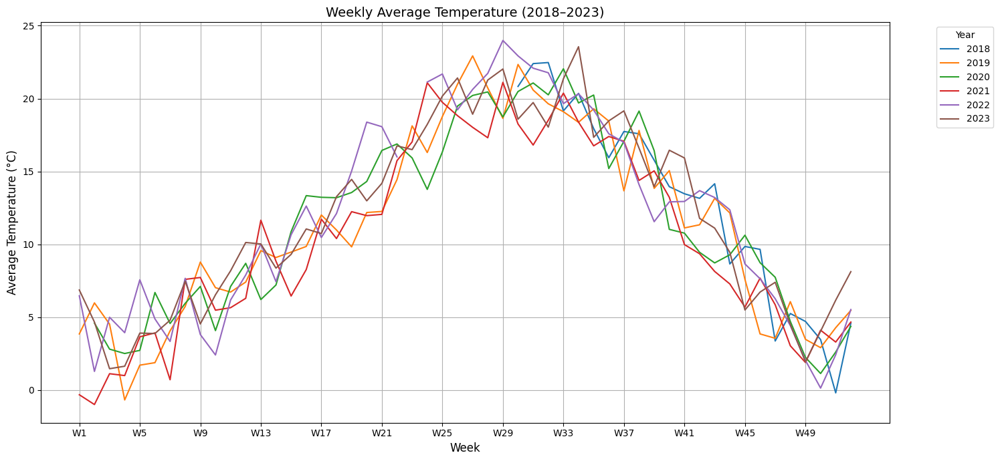

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_comprovasco['Date'] = pd.to_datetime(averages_df_comprovasco['Date'])

# Extract year and week number
averages_df_comprovasco['Year'] = averages_df_comprovasco['Date'].dt.year
averages_df_comprovasco['Week'] = averages_df_comprovasco['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_comprovasco = averages_df_comprovasco[(averages_df_comprovasco['Year'] >= 2018) & (averages_df_comprovasco['Year'] <= 2023)]
averages_df_comprovasco = averages_df_comprovasco[averages_df_comprovasco['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_temp = averages_df_comprovasco.groupby(['Year', 'Week'])['tavg'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Temperature (2018–2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

Index(['Year', 'Week', 'tavg'], dtype='object')


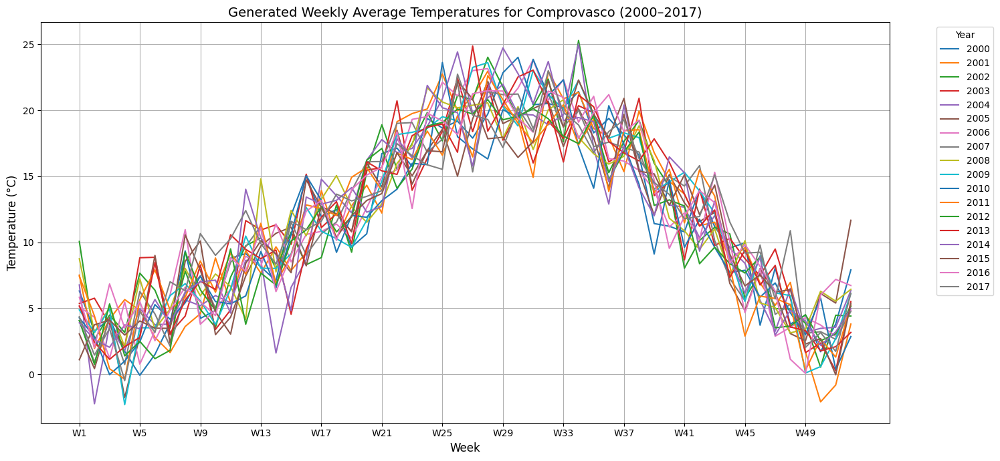

In [ ]:
# Assume 'weekly_avg_temp' is your weekly average temperature DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_temp_comprovasco = weekly_avg_temp.mean(axis=0)

# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2018)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data_comprovasco = []

for year in missing_years:
    # Add random noise to the weekly mean temperatures
    random_noise = np.random.normal(0, 2, size=len(weekly_mean_temp_comprovasco))  
    generated_temps = weekly_mean_temp_comprovasco + random_noise
    
    # Store the generated data
    for week, temp in zip(weeks, generated_temps):
        generated_data_comprovasco.append({"Year": year, "Week": week, "tavg": temp})

# Convert the list of generated data into a DataFrame
generated_df_comprovasco = pd.DataFrame(generated_data_comprovasco)

# Display the generated data (optional)
print(generated_df_comprovasco.columns)

# Plotting the generated data
plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df_comprovasco[generated_df_comprovasco['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['tavg'], label=str(year))

plt.title('Generated Weekly Average Temperatures for Comprovasco (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Convert Year and Week to Date
generated_df_comprovasco['Date'] = generated_df_comprovasco.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

# Drop Year and Week columns as they're no longer needed
generated_df_comprovasco = generated_df_comprovasco.drop(columns=['Year', 'Week'])

# Merge real_data (2018-2023) and generated_df_comprovasco (2000-2017)
# Assuming real_data has a 'Date' column and other relevant columns
merged_data_comprovasco = pd.concat([averages_df_comprovasco, generated_df_comprovasco], ignore_index=True)

# Sort the merged data by Date
merged_data_comprovasco = merged_data_comprovasco.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame
merged_data_comprovasco

,Date,tavg,wspd,Year,Week
0,2000-01-03,6.313791,NaN,NaN,<NA>
1,2000-01-10,3.269066,NaN,NaN,<NA>
2,2000-01-17,4.196129,NaN,NaN,<NA>
3,2000-01-24,1.742378,NaN,NaN,<NA>
4,2000-01-31,-0.079938,NaN,NaN,<NA>
...,...,...,...,...,...
1214,2023-11-27,4.500000,11.857143,2023.0,48
1215,2023-12-04,1.942857,7.500000,2023.0,49
1216,2023-12-11,4.042857,4.842857,2023.0,50
1217,2023-12-18,6.171429,8.157143,2023.0,51


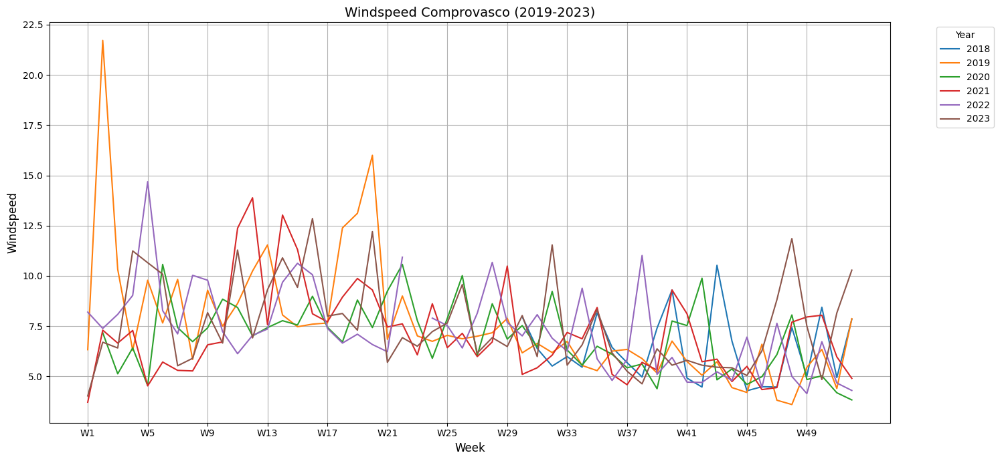

In [ ]:
# Extract year and week number
averages_df_comprovasco['Year'] = averages_df_comprovasco['Date'].dt.year
averages_df_comprovasco['Week'] = averages_df_comprovasco['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_comprovasco = averages_df_comprovasco[(averages_df_comprovasco['Year'] >= 2018) & (averages_df_comprovasco['Year'] <= 2023)]
averages_df_comprovasco = averages_df_comprovasco[averages_df_comprovasco['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_wspd = averages_df_comprovasco.groupby(['Year', 'Week'])['wspd'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_wspd.index:
    plt.plot(range(1, 53), weekly_avg_wspd.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Windspeed Comprovasco (2019-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

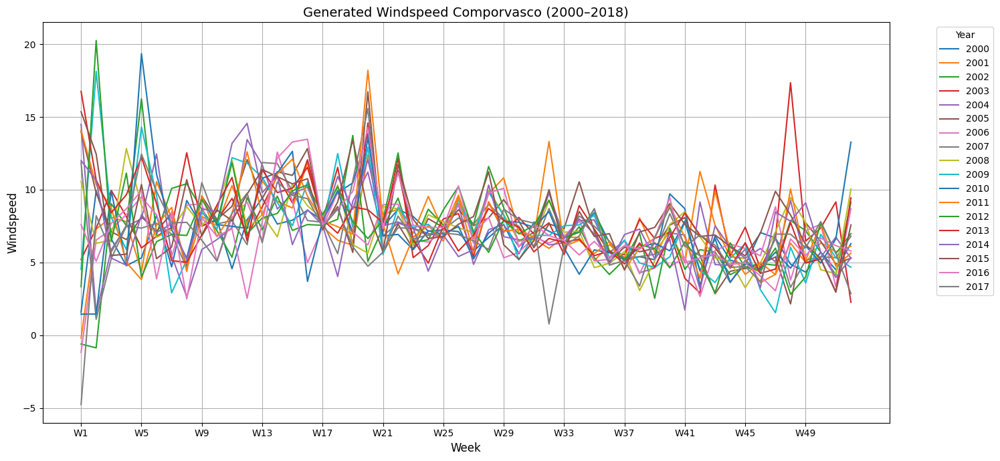

In [ ]:
# Assume 'weekly_avg_temp' is your weekly average temperature DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_wspd = weekly_avg_wspd.mean(axis=0)
weekly_std_wspd = weekly_avg_wspd.std(axis=0)
# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2018)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean temperatures
    random_noise = np.random.normal(0, weekly_std_wspd , size=len(weekly_mean_wspd))  
    generated_wspds = weekly_mean_wspd + random_noise
    
    # Store the generated data
    for week, wspd in zip(weeks, generated_wspds):
        generated_data.append({"Year": year, "Week": week, "wspd": wspd})

# Convert the list of generated data into a DataFrame
generated_df1 = pd.DataFrame(generated_data)

plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df1[generated_df1['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['wspd'], label=str(year))

plt.title('Generated Windspeed Comporvasco (2000–2018)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Convert weekly_avg_prcp from wide to long format
weekly_avg_wspd_reset = weekly_avg_wspd.reset_index()  # Reset index to expose 'Year'
long_wspd = weekly_avg_wspd_reset.melt(
    id_vars='Year',           # Keep 'Year' as a column
    var_name='Week',          # Name for the variable column (previously wide headers)
    value_name='wspd'         # Name for the values
)

# Ensure Week is numeric
long_wspd['Week'] = long_wspd['Week'].astype(int)

# Concatenate generated_df1 (2000–2016) with long_prcp (2017–2023)
merged_wspd = pd.concat([generated_df1, long_wspd], ignore_index=True)

# Sort by Year and Week for continuity
merged_wspd = merged_wspd.sort_values(by=['Year', 'Week']).reset_index(drop=True)

# Convert Year and Week to Date (start of the week)
merged_wspd['Date'] = merged_wspd.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

merged_wspd = merged_wspd.drop(columns=['Year', 'Week'])
merged_wspd

,wspd,Date
0,1.578627,2000-01-03
1,9.927867,2000-01-10
2,6.615073,2000-01-17
3,4.773384,2000-01-24
4,5.312293,2000-01-31
...,...,...
1243,11.857143,2023-11-27
1244,7.500000,2023-12-04
1245,4.842857,2023-12-11
1246,8.157143,2023-12-18


In [ ]:
# Merge real_data (2018–2023) and generated_df (2000–2017)
merged_data_comprovasco1 = pd.concat([merged_data_comprovasco, merged_wspd], ignore_index=True)

# Group by Date and combine rows with the same date
merged_data_comprovasco1 = merged_data_comprovasco1.groupby('Date').agg({
    'tavg': 'mean',  # Take the mean if duplicates exist
    'wspd': 'mean',
}).reset_index()

# Sort the merged data by Date
merged_data_comprovasco1 = merged_data_comprovasco1.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame & rename columns
merged_data_comprovasco1 = merged_data_comprovasco1.rename(columns={'tavg': 'tavg_comporvasco',"wspd": 'wspd_comprovasco'})
merged_data_comprovasco1

,Date,tavg_comporvasco,wspd_comprovasco
0,2000-01-03,6.313791,1.578627
1,2000-01-10,3.269066,9.927867
2,2000-01-17,4.196129,6.615073
3,2000-01-24,1.742378,4.773384
4,2000-01-31,-0.079938,5.312293
...,...,...,...
1244,2023-11-27,4.500000,11.857143
1245,2023-12-04,1.942857,7.500000
1246,2023-12-11,4.042857,4.842857
1247,2023-12-18,6.171429,8.157143


**Load Dataset Piotta**

In [ ]:
dataframes = []

# Loop through the years from 2000 to 2023
for year in range(2018, 2024):
    try:
        # General case for all years
        filepath = f"Data//Piotta{year}.csv"
        
        # Read the CSV file and append to the list
        dataframes.append(pd.read_csv(filepath))
    except FileNotFoundError:
        # Print a message if the file is not found
        print(f"File for year {year} not found: {filepath}")

# Concatenate all the dataframes into one
piotta = pd.concat(dataframes, ignore_index=True)

# Display the concatenated DataFrame (optional)
piotta

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2186,2023-12-27,0.3,-2.4,2.6,NaN,NaN,34.0,3.0,20.4,1024.8,NaN
2187,2023-12-28,-0.6,-2.8,2.4,NaN,NaN,45.0,1.6,7.4,1024.9,NaN
2188,2023-12-29,0.5,-0.6,1.8,NaN,NaN,316.0,1.7,9.3,1022.7,NaN
2189,2023-12-30,-0.3,-1.7,0.5,NaN,NaN,288.0,2.0,7.4,1022.2,NaN


In [ ]:
#Also data starts at 07-21-2018
piotta = piotta[["date", "tavg", "wspd"]]
piotta = piotta[piotta['date'] >= '2018-07-21']
piotta

,date,tavg,wspd
201,2018-07-21,15.7,6.5
202,2018-07-22,18.4,17.0
203,2018-07-23,19.7,17.0
204,2018-07-24,19.8,9.9
205,2018-07-25,21.9,10.0
...,...,...,...
2186,2023-12-27,0.3,3.0
2187,2023-12-28,-0.6,1.6
2188,2023-12-29,0.5,1.7
2189,2023-12-30,-0.3,2.0


In [ ]:
# Durchschnitt der ersten 6 Zeilen
averages_piotta = [piotta.head(6).mean(numeric_only=True)]

# Durchschnitt für jeweils 7 Zeilen
for i in range(6, len(piotta), 7):
    chunk = piotta.iloc[i:i + 7]
    averages_piotta.append(chunk.mean(numeric_only=True))

# Neuer DataFrame aus den Durchschnitten
averages_df_piotta = pd.DataFrame(averages_comprovasco)

# Hinzufügen einer Datumsspalte
start_date = datetime.strptime("2018-07-23", "%Y-%m-%d")
dates = [start_date + timedelta(days=7 * i) for i in range(len(averages_df_piotta))]
averages_df_piotta.insert(0, "Date", dates)

averages_df_piotta

,Date,tavg,wspd
0,2018-07-23,20.833333,7.966667
1,2018-07-30,22.400000,6.385714
2,2018-08-06,22.471429,5.514286
3,2018-08-13,19.157143,5.985714
4,2018-08-20,20.357143,5.457143
...,...,...,...
280,2023-12-04,1.942857,7.500000
281,2023-12-11,4.042857,4.842857
282,2023-12-18,6.171429,8.157143
283,2023-12-25,8.128571,10.285714


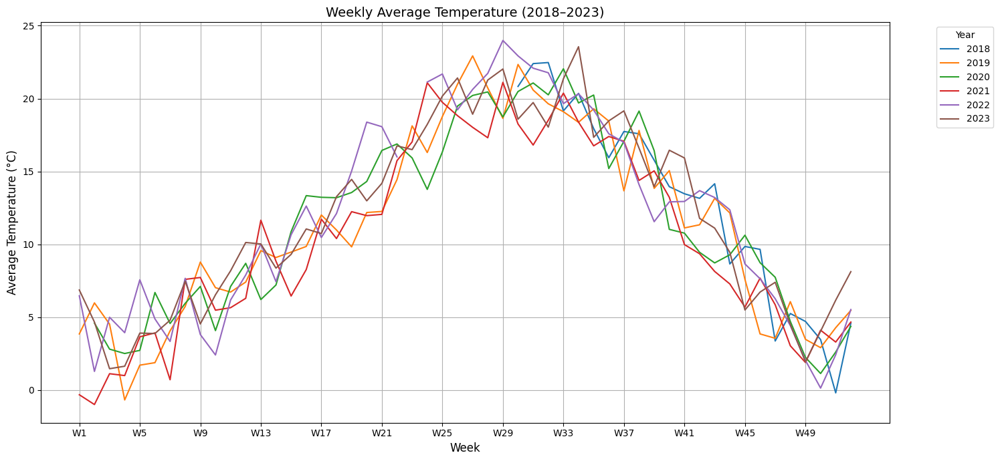

In [ ]:
# Ensure 'Date' is in datetime format
averages_df_piotta['Date'] = pd.to_datetime(averages_df_piotta['Date'])

# Extract year and week number
averages_df_piotta['Year'] = averages_df_piotta['Date'].dt.year
averages_df_piotta['Week'] = averages_df_piotta['Date'].dt.isocalendar().week

# Filter out data to only include years 2018–2023 and exclude Week 53
averages_df_piotta = averages_df_piotta[(averages_df_piotta['Year'] >= 2018) & (averages_df_piotta['Year'] <= 2023)]
averages_df_piotta = averages_df_piotta[averages_df_piotta['Week'] <= 52]

# Group by Year and Week and calculate the weekly average temperature
weekly_avg_temp = averages_df_piotta.groupby(['Year', 'Week'])['tavg'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_temp.index:
    plt.plot(range(1, 53), weekly_avg_temp.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Weekly Average Temperature (2018–2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

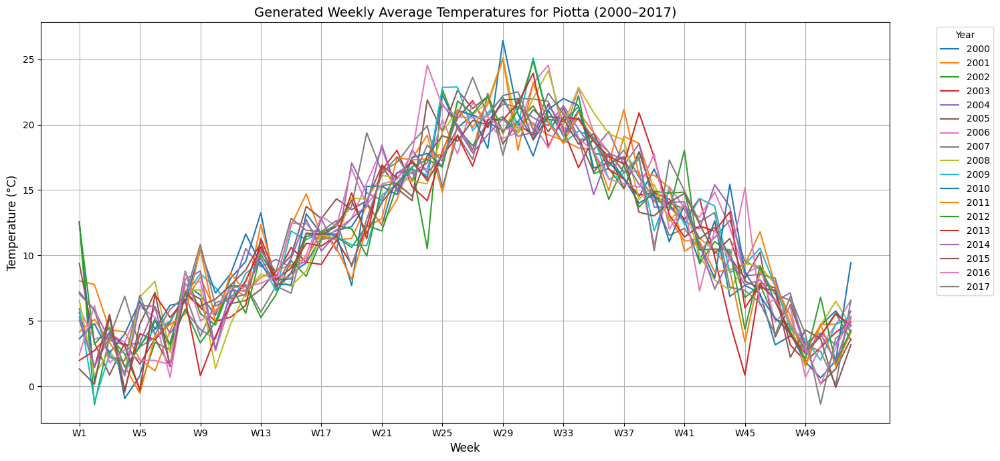

In [ ]:
# Assume 'weekly_avg_temp' is your weekly average temperature DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_temp_piotta = weekly_avg_temp.mean(axis=0)
weekly_std_temp_piotta = weekly_avg_temp.std(axis=0)
# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2018)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data_piotta = []

for year in missing_years:
    # Add random noise to the weekly mean temperatures
    random_noise = np.random.normal(0, weekly_std_temp_piotta, size=len(weekly_mean_temp_piotta))  
    generated_temps = weekly_mean_temp_piotta + random_noise
    
    # Store the generated data
    for week, temp in zip(weeks, generated_temps):
        generated_data_piotta.append({"Year": year, "Week": week, "tavg": temp})

# Convert the list of generated data into a DataFrame
generated_df_piotta = pd.DataFrame(generated_data_piotta)

# Plotting the generated data
plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df_piotta[generated_df_piotta['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['tavg'], label=str(year))

plt.title('Generated Weekly Average Temperatures for Piotta (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Convert Year and Week to Date
generated_df_piotta['Date'] = generated_df_piotta.apply(
    lambda row: datetime.strptime(f'{int(row["Year"])}-{int(row["Week"])}-1', "%Y-%W-%w"), axis=1
)

# Drop Year and Week columns as they're no longer needed
generated_df_piotta = generated_df_piotta.drop(columns=['Year', 'Week'])

# Merge real_data (2018-2023) and generated_df_comprovasco (2000-2017)
# Assuming real_data has a 'Date' column and other relevant columns
merged_data_piotta = pd.concat([averages_df_piotta, generated_df_piotta], ignore_index=True)

# Sort the merged data by Date
merged_data_piotta = merged_data_piotta.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame
merged_data_piotta

,Date,tavg,wspd,Year,Week
0,2000-01-03,12.572295,NaN,NaN,<NA>
1,2000-01-10,0.399387,NaN,NaN,<NA>
2,2000-01-17,5.298474,NaN,NaN,<NA>
3,2000-01-24,-0.919147,NaN,NaN,<NA>
4,2000-01-31,0.799014,NaN,NaN,<NA>
...,...,...,...,...,...
1214,2023-11-27,4.500000,11.857143,2023.0,48
1215,2023-12-04,1.942857,7.500000,2023.0,49
1216,2023-12-11,4.042857,4.842857,2023.0,50
1217,2023-12-18,6.171429,8.157143,2023.0,51


Plot and Generate Windspeed

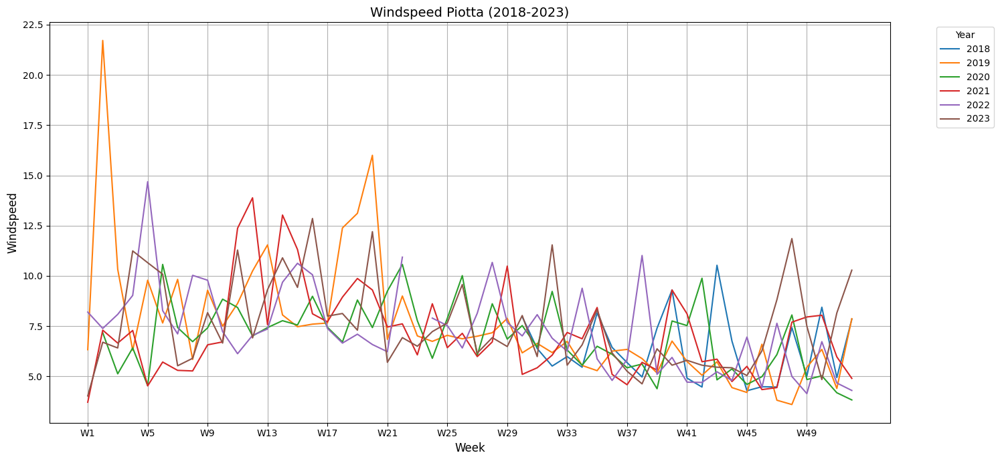

In [ ]:
 # Extract year and week number
averages_df_piotta['Year'] = averages_df_piotta['Date'].dt.year
averages_df_piotta['Week'] = averages_df_piotta['Date'].dt.isocalendar().week

# Filter out data to only include years 2019–2023 and exclude Week 53
averages_df_piotta = averages_df_piotta[(averages_df_piotta['Year'] >= 2018) & (averages_df_piotta['Year'] <= 2023)]
averages_df_piotta = averages_df_piotta[averages_df_piotta['Week'] <= 52]

# Group by Year and Week and calculate the weekly average windspeed
weekly_avg_wspd = averages_df_piotta.groupby(['Year', 'Week'])['wspd'].mean().unstack()

# Plotting the data
plt.figure(figsize=(15, 7))
for year in weekly_avg_wspd.index:
    plt.plot(range(1, 53), weekly_avg_wspd.loc[year], label=str(year))  # 1 to 52 weeks

plt.title('Windspeed Piotta (2018-2023)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

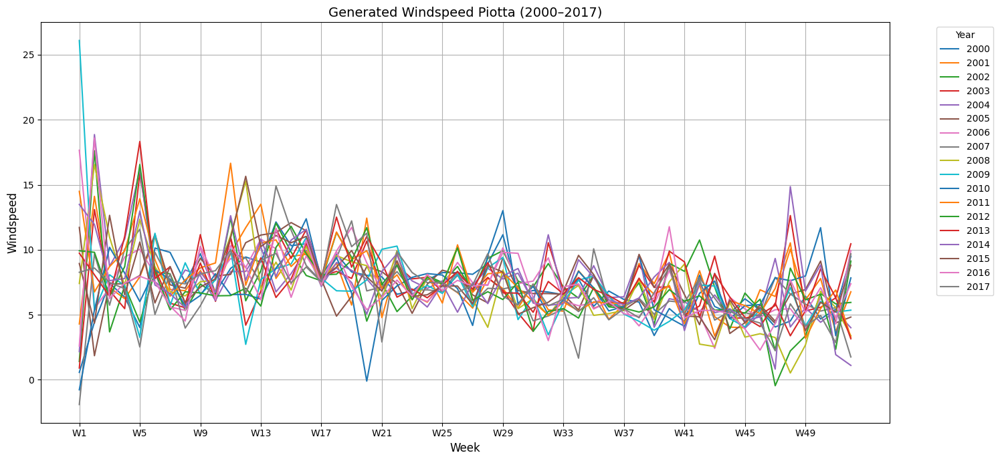

In [ ]:
# Assume 'weekly_avg_temp' is your weekly average temperature DataFrame (2018–2023)
# Compute the mean across all available years for each week
weekly_mean_wspd = weekly_avg_wspd.mean(axis=0)
weekly_std_wspd = weekly_avg_wspd.std(axis=0)
# Generate data for the missing years (2000–2017)
missing_years = range(2000, 2018)
weeks = np.arange(1, 53)

# Create a DataFrame to store the generated data
generated_data = []

for year in missing_years:
    # Add random noise to the weekly mean temperatures
    random_noise = np.random.normal(0, weekly_std_wspd , size=len(weekly_mean_wspd))  
    generated_wspds = weekly_mean_wspd + random_noise
    
    # Store the generated data
    for week, wspd in zip(weeks, generated_wspds):
        generated_data.append({"Year": year, "Week": week, "wspd": wspd})

# Convert the list of generated data into a DataFrame
generated_df1 = pd.DataFrame(generated_data)

plt.figure(figsize=(15, 7))
for year in missing_years:
    yearly_data = generated_df1[generated_df1['Year'] == year]
    plt.plot(yearly_data['Week'], yearly_data['wspd'], label=str(year))

plt.title('Generated Windspeed Piotta (2000–2017)', fontsize=14)
plt.xlabel('Week', fontsize=12)
plt.ylabel('Windspeed', fontsize=12)
plt.xticks(range(1, 53, 4), ['W'+str(i) for i in range(1, 53, 4)])  # Showing every 4th week
plt.legend(title='Year', fontsize=10, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Merge real_data (2018–2023) and generated_df (2000–2017)
merged_data_piotta1 = pd.concat([merged_data_piotta, merged_wspd], ignore_index=True)

# Group by Date and combine rows with the same date
merged_data_piotta1 = merged_data_piotta1.groupby('Date').agg({
    'tavg': 'mean',  # Take the mean if duplicates exist
    'wspd': 'mean',
}).reset_index()

# Sort the merged data by Date
merged_data_piotta1 = merged_data_piotta1.sort_values(by='Date').reset_index(drop=True)

# Display the merged DataFrame & rename columns
merged_data_piotta1 = merged_data_piotta1.rename(columns={'tavg': 'tavg_piotta',"wspd": 'wspd_piotta'})
merged_data_piotta1

,Date,tavg_piotta,wspd_piotta
0,2000-01-03,12.572295,1.578627
1,2000-01-10,0.399387,9.927867
2,2000-01-17,5.298474,6.615073
3,2000-01-24,-0.919147,4.773384
4,2000-01-31,0.799014,5.312293
...,...,...,...
1244,2023-11-27,4.500000,11.857143
1245,2023-12-04,1.942857,7.500000
1246,2023-12-11,4.042857,4.842857
1247,2023-12-18,6.171429,8.157143


**Putting tessin together**

In [ ]:
# Check for NaNs in Date before merging on date 
print(merged_data_minusio['Date'].isnull().sum())  
print(merged_data_robiei1['Date'].isnull().sum())
print(merged_data_piotta1['Date'].isnull().sum())
print(merged_data_comprovasco1['Date'].isnull().sum())

0
0
0
53


In [ ]:
#Comprovasco and Minusio has 24 missing values on date so we delete the missing oberservations
merged_data_comprovasco1 = merged_data_comprovasco1.dropna(subset=['Date'])
merged_data_minusio = merged_data_minusio.dropna(subset=['Date'])

In [ ]:
# Check for NaNs in Date before merging on date 
print(merged_data_minusio['Date'].isnull().sum())  
print(merged_data_robiei1['Date'].isnull().sum())
print(merged_data_piotta1['Date'].isnull().sum())
print(merged_data_comprovasco1['Date'].isnull().sum())

0
0
0
0


In [ ]:
merged_data_minusio['Date'] = pd.to_datetime(averages_df_minusio['Date'])
merged_data_piotta1['Date'] = pd.to_datetime(merged_data_piotta1['Date'])
merged_data_comprovasco1['Date'] = pd.to_datetime(merged_data_robiei1['Date'])
merged_data_robiei1['Date'] = pd.to_datetime(merged_data_robiei1['Date'])

merged_data_minusio = merged_data_minusio.sort_values(by='Date')
merged_data_robiei1 = merged_data_robiei1.sort_values(by='Date')
merged_data_comprovasco1 = merged_data_comprovasco1.sort_values(by='Date')
merged_data_piotta1 = merged_data_piotta1.sort_values(by='Date')

# Perform sequential asof merges
merged = pd.merge_asof(
    merged_data_minusio,
    merged_data_robiei1,
    on='Date',
    direction='nearest',  # Choose nearest match
    tolerance=pd.Timedelta('3 days')  # Allow a 3-day tolerance
)

merged = pd.merge_asof(
    merged,
    merged_data_piotta1,
    on='Date',
    direction='nearest',  # Choose nearest match
    tolerance=pd.Timedelta('3 days')  # Allow a 3-day tolerance
)

tessin_weatherdataset = pd.merge_asof(
    merged,
    merged_data_comprovasco1,
    on='Date',
    direction='nearest',  # Choose nearest match
    tolerance=pd.Timedelta('5 days')  # Allow a 3-day tolerance
)

# Display the merged DataFrame
tessin_weatherdataset

,Date,tavg_minusio,tmin_minusio,tmax,snow,wdir_minusio,wspd_minusio,wpgt,pres,tsun,prcp_minusio,tavg_robiei,wspd_robiei,tavg_piotta,wspd_piotta,tavg_comporvasco,wspd_comprovasco
0,2000-01-03,-1.380000,-5.340000,4.120000,NaN,95.000000,3.640000,NaN,1027.420000,NaN,0.000000,-2.087567,4.815827,12.572295,1.578627,6.313791,1.578627
1,2000-01-10,0.600000,-2.683333,4.500000,NaN,128.000000,3.200000,NaN,1029.100000,NaN,4.348509,-0.335145,10.105099,0.399387,9.927867,3.269066,9.927867
2,2000-01-17,2.900000,-1.675000,7.900000,NaN,118.666667,6.700000,NaN,1023.775000,NaN,0.094005,-2.906296,11.572026,5.298474,6.615073,4.196129,6.615073
3,2000-01-24,2.233333,-3.616667,8.266667,NaN,96.200000,8.716667,NaN,1017.900000,NaN,0.000000,-3.747336,9.587354,-0.919147,4.773384,1.742378,4.773384
4,2000-01-31,2.683333,-2.650000,9.050000,NaN,102.500000,5.433333,NaN,1023.466667,NaN,1.629867,1.577488,10.766174,0.799014,5.312293,-0.079938,5.312293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,2023-10-30,4.728571,-1.428571,10.900000,NaN,92.571429,6.342857,35.457143,1007.557143,NaN,0.000000,3.728571,5.914286,9.457143,5.428571,13.214286,5.228571
1244,2023-11-06,2.971429,-0.742857,6.885714,NaN,73.000000,6.471429,29.371429,1013.357143,NaN,9.742857,0.500000,7.071429,5.500000,5.042857,12.371429,4.800000
1245,2023-11-13,4.571429,1.000000,8.428571,NaN,104.428571,3.257143,13.214286,1014.085714,NaN,1.271429,-1.514286,5.442857,6.728571,6.271429,8.657143,6.957143
1246,2023-11-20,3.671429,-0.942857,10.928571,NaN,83.142857,5.214286,24.585714,1028.485714,NaN,0.000000,2.628571,6.371429,7.400000,8.814286,7.642857,4.442857


In [ ]:
tessin_weatherdataset.isnull().sum()  

Date                   0
tavg_minusio           7
tmin_minusio           7
tmax                   7
snow                1248
wdir_minusio          80
wspd_minusio          23
wpgt                 966
pres                   8
tsun                1248
prcp_minusio          67
tavg_robiei           58
wspd_robiei           57
tavg_piotta           34
wspd_piotta           32
tavg_comporvasco      87
wspd_comprovasco      85
dtype: int64

In [ ]:
#Snow, tsun, wpgt have a lot of missing values we drop the columns 
columns_to_drop = ["tsun" , "wpgt", "snow"]
tessin_weatherdataset = tessin_weatherdataset.drop(columns =columns_to_drop)
tessin_weatherdataset = tessin_weatherdataset.rename(columns={'tmax': 'tmax_minusio',"pres": 'pres_minusio'})
tessin_weatherdataset = tessin_weatherdataset.rename(columns={'tmax': 'tmax_minusio',"pres": 'pres_minusio'})
tessin_weatherdataset

,Date,tavg_minusio,tmin_minusio,tmax_minusio,wdir_minusio,wspd_minusio,pres_minusio,prcp_minusio,tavg_robiei,wspd_robiei,tavg_piotta,wspd_piotta,tavg_comporvasco,wspd_comprovasco
0,2000-01-03,-1.380000,-5.340000,4.120000,95.000000,3.640000,1027.420000,0.000000,-2.087567,4.815827,12.572295,1.578627,6.313791,1.578627
1,2000-01-10,0.600000,-2.683333,4.500000,128.000000,3.200000,1029.100000,4.348509,-0.335145,10.105099,0.399387,9.927867,3.269066,9.927867
2,2000-01-17,2.900000,-1.675000,7.900000,118.666667,6.700000,1023.775000,0.094005,-2.906296,11.572026,5.298474,6.615073,4.196129,6.615073
3,2000-01-24,2.233333,-3.616667,8.266667,96.200000,8.716667,1017.900000,0.000000,-3.747336,9.587354,-0.919147,4.773384,1.742378,4.773384
4,2000-01-31,2.683333,-2.650000,9.050000,102.500000,5.433333,1023.466667,1.629867,1.577488,10.766174,0.799014,5.312293,-0.079938,5.312293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,2023-10-30,4.728571,-1.428571,10.900000,92.571429,6.342857,1007.557143,0.000000,3.728571,5.914286,9.457143,5.428571,13.214286,5.228571
1244,2023-11-06,2.971429,-0.742857,6.885714,73.000000,6.471429,1013.357143,9.742857,0.500000,7.071429,5.500000,5.042857,12.371429,4.800000
1245,2023-11-13,4.571429,1.000000,8.428571,104.428571,3.257143,1014.085714,1.271429,-1.514286,5.442857,6.728571,6.271429,8.657143,6.957143
1246,2023-11-20,3.671429,-0.942857,10.928571,83.142857,5.214286,1028.485714,0.000000,2.628571,6.371429,7.400000,8.814286,7.642857,4.442857


# Energy Data

In [ ]:
grouped_data = pd.read_csv('Data//grouped_data.csv', sep=',', encoding='utf-8', decimal='.', low_memory=False)
grouped_data

,Unnamed: 0,Datum,Summe endverbrauchte Energie Regelblock Schweiz\nTotal energy consumed by end users in the Swiss controlblock,Summe produzierte Energie Regelblock Schweiz\nTotal energy production Swiss controlblock,Summe verbrauchte Energie Regelblock Schweiz\nTotal energy consumption Swiss controlblock,Positive Tertiär-Regelenergie\nPositive tertiary control energy,Negative Tertiär-Regelenergie\nNegative tertiary control energy,Durchschnittliche positive Tertiär-Regelenergie Preise\nAverage positive tertiary control energy prices,Durchschnittliche negative Tertiär-Regelenergie Preise\nAverage negative tertiary control energy prices,Produktion Kanton TI\nProduction Canton TI,Verbrauch Kanton TI\nConsumption Canton TI,Produktion Kanton VS\nProduction Canton VS,Verbrauch Kanton VS\nConsumption Canton VS,Transit,Import,Export
0,0,2009-01-05,1.317330e+09,1.198918e+09,1.416182e+09,405234.0,-1895250.0,0.000,0.000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,520039100.0,748859750.0,530311250.0
1,1,2009-01-12,1.315926e+09,1.187909e+09,1.419111e+09,816500.0,0.0,0.000,0.000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,566359750.0,805442750.0,572602500.0
2,2,2009-01-19,1.267021e+09,1.122777e+09,1.390561e+09,325000.0,-11301900.0,0.000,0.000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,575636750.0,844987500.0,576197750.0
3,3,2009-01-26,1.286233e+09,1.176537e+09,1.395654e+09,1542000.0,-4376000.0,0.000,0.000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,564866500.0,800834750.0,580598750.0
4,4,2009-02-02,1.247286e+09,1.106696e+09,1.361746e+09,0.0,-7116250.0,0.000,0.000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,529974650.0,786973350.0,530874250.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
821,821,2024-09-30,9.480956e+08,1.335629e+09,1.129165e+09,8082750.0,-5278250.0,27297.731,-220.558,8.301445e+07,5.081634e+07,1.732407e+08,5.996639e+07,457593709.0,479585178.0,685810842.0
822,822,2024-10-07,9.355299e+08,1.500600e+09,1.175333e+09,8807500.0,-7458750.0,33248.075,8091.819,1.055458e+08,5.793764e+07,1.903407e+08,7.681974e+07,376862011.0,382999771.0,708234833.0
823,823,2024-10-14,9.355479e+08,1.555558e+09,1.161583e+09,15369650.0,-5910250.0,43336.280,-7853.860,1.082968e+08,5.632937e+07,2.518364e+08,8.237915e+07,287079847.0,302890651.0,696592400.0
824,824,2024-10-21,9.344505e+08,1.438221e+09,1.144137e+09,14981950.0,-3655500.0,81223.698,6851.070,1.326815e+08,5.041117e+07,2.517288e+08,7.836867e+07,341336146.0,388151249.0,681623297.0


In [ ]:
# Drop the first Column
grouped_data = grouped_data.drop(columns=['Unnamed: 0'], errors='ignore')
# Remove decimal places in all numeric columns
grouped_data.iloc[:, 1:] = grouped_data.iloc[:, 1:].applymap(lambda x: int(x) if pd.notna(x) else x)
# Convert the Date to datetime
grouped_data['Datum'] = pd.to_datetime(grouped_data['Datum'], errors='coerce')
# Remove the last row (last week is incomplete)
grouped_data = grouped_data.iloc[:-1]

grouped_data

/var/folders/kz/cdns3q5j33910y0dt9d7416m0000gn/T/ipykernel_14214/214917233.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  grouped_data.iloc[:, 1:] = grouped_data.iloc[:, 1:].applymap(lambda x: int(x) if pd.notna(x) else x)


,Datum,Summe endverbrauchte Energie Regelblock Schweiz\nTotal energy consumed by end users in the Swiss controlblock,Summe produzierte Energie Regelblock Schweiz\nTotal energy production Swiss controlblock,Summe verbrauchte Energie Regelblock Schweiz\nTotal energy consumption Swiss controlblock,Positive Tertiär-Regelenergie\nPositive tertiary control energy,Negative Tertiär-Regelenergie\nNegative tertiary control energy,Durchschnittliche positive Tertiär-Regelenergie Preise\nAverage positive tertiary control energy prices,Durchschnittliche negative Tertiär-Regelenergie Preise\nAverage negative tertiary control energy prices,Produktion Kanton TI\nProduction Canton TI,Verbrauch Kanton TI\nConsumption Canton TI,Produktion Kanton VS\nProduction Canton VS,Verbrauch Kanton VS\nConsumption Canton VS,Transit,Import,Export
0,2009-01-05,1.317330e+09,1.198918e+09,1.416182e+09,405234.0,-1895250.0,0.0,0.0,0.0,0.0,0.0,0.0,520039100.0,748859750.0,530311250.0
1,2009-01-12,1.315926e+09,1.187909e+09,1.419111e+09,816500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,566359750.0,805442750.0,572602500.0
2,2009-01-19,1.267021e+09,1.122777e+09,1.390561e+09,325000.0,-11301900.0,0.0,0.0,0.0,0.0,0.0,0.0,575636750.0,844987500.0,576197750.0
3,2009-01-26,1.286233e+09,1.176537e+09,1.395654e+09,1542000.0,-4376000.0,0.0,0.0,0.0,0.0,0.0,0.0,564866500.0,800834750.0,580598750.0
4,2009-02-02,1.247286e+09,1.106696e+09,1.361746e+09,0.0,-7116250.0,0.0,0.0,0.0,0.0,0.0,0.0,529974650.0,786973350.0,530874250.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820,2024-09-23,9.750883e+08,1.343157e+09,1.151793e+09,9705500.0,-5089500.0,29378.0,4833.0,70812026.0,53354551.0,187821700.0,85995034.0,420911271.0,456177451.0,647073903.0
821,2024-09-30,9.480956e+08,1.335629e+09,1.129165e+09,8082750.0,-5278250.0,27297.0,-220.0,83014454.0,50816335.0,173240691.0,59966388.0,457593709.0,479585178.0,685810842.0
822,2024-10-07,9.355299e+08,1.500600e+09,1.175333e+09,8807500.0,-7458750.0,33248.0,8091.0,105545792.0,57937644.0,190340685.0,76819736.0,376862011.0,382999771.0,708234833.0
823,2024-10-14,9.355479e+08,1.555558e+09,1.161583e+09,15369650.0,-5910250.0,43336.0,-7853.0,108296751.0,56329369.0,251836390.0,82379148.0,287079847.0,302890651.0,696592400.0


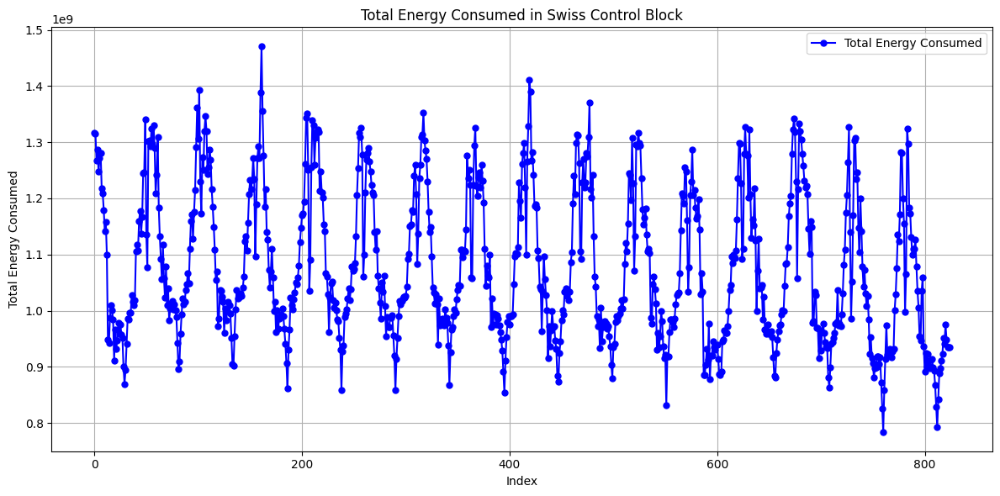

In [ ]:
# Define the energy column to plot
energy_column = 'Summe endverbrauchte Energie Regelblock Schweiz\nTotal energy consumed by end users in the Swiss controlblock'

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(grouped_data.index, grouped_data[energy_column], label='Total Energy Consumed', color='blue', marker='o', linestyle='-', markersize=5)

# Add labels and title
plt.xlabel('Index')
plt.ylabel('Total Energy Consumed')
plt.title('Total Energy Consumed in Swiss Control Block')

# Add grid and legend
plt.grid(True)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

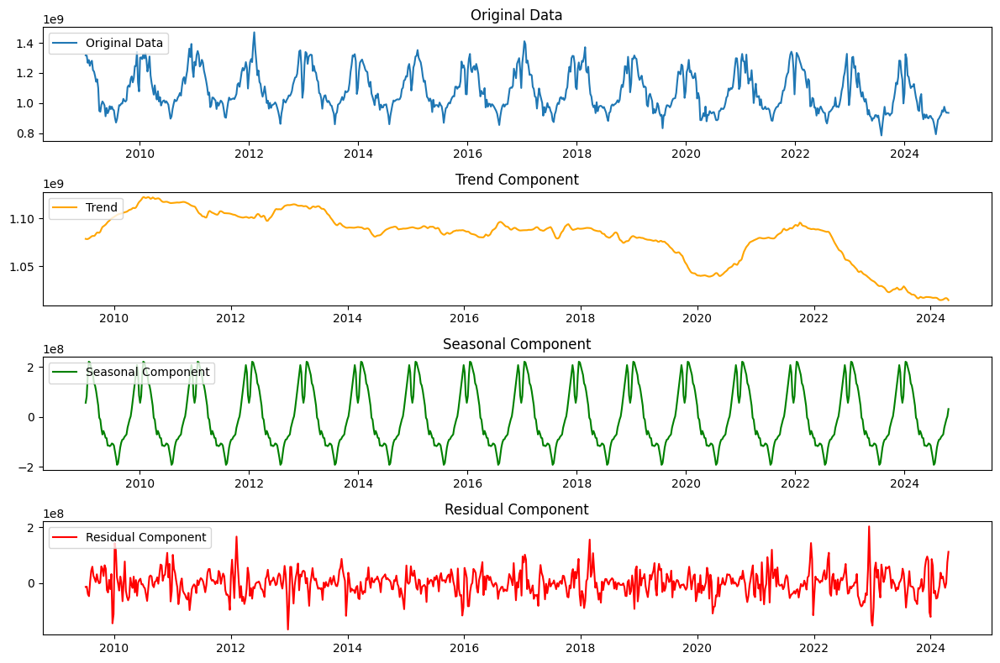

In [ ]:
# Set the 'Datum' column as the index
grouped_data.set_index('Datum', inplace=True)

# Select the first column for time series decomposition
data = grouped_data.iloc[:, 0]

# Perform seasonal decomposition
decomposition = seasonal_decompose(data, model='additive', period=52)

# Extract components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot the components
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(data, label='Original Data')
plt.legend(loc='upper left')
plt.title('Original Data')

plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='upper left')
plt.title('Trend Component')

plt.subplot(413)
plt.plot(seasonal, label='Seasonal Component', color='green')
plt.legend(loc='upper left')
plt.title('Seasonal Component')

plt.subplot(414)
plt.plot(residual, label='Residual Component', color='red')
plt.legend(loc='upper left')
plt.title('Residual Component')

plt.tight_layout()
plt.show()

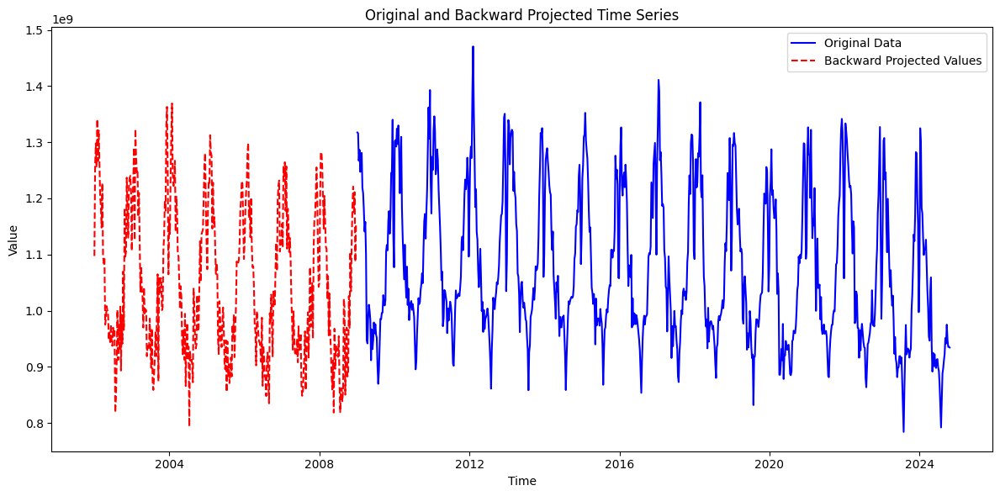

In [ ]:
# Decompose the time series into its components
data = grouped_data.iloc[:, 0]  # Select the column to analyze
decomposition = seasonal_decompose(data, model='additive', period=52)  # Weekly data with period=52

# Extract the components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Determine the starting point for backward projection
current_start_date = grouped_data.index[0]  # First date in the index
target_date = pd.to_datetime('2002-01-01')  # Target date for backward projection

# Calculate the number of weeks to project backward
weeks_back = (current_start_date - target_date).days // 7

# Backward projection of the trend and seasonal components
projected_trend = np.linspace(trend.dropna().iloc[0], trend.dropna().iloc[-1], weeks_back)
projected_seasonal = seasonal[:weeks_back]

# Reconstruct the backward-projected time series
projected_data = projected_trend + projected_seasonal[:weeks_back]

# Add random error similar to the residuals
random_error = np.random.normal(loc=0, scale=np.std(residual.dropna()), size=weeks_back)

# Final backward-projected data with random error
final_projected_data = projected_data + random_error

# Create a time series for the projected dates
projected_dates = pd.date_range(target_date, periods=weeks_back, freq='7D')

# Combine the original and backward-projected data
original_dates = grouped_data.index  # Original timestamps
original_data_series = pd.Series(data.values, index=original_dates)  # Original data as a Series

# Combine the projected and original data into a single Series
combined_data = pd.concat([pd.Series(final_projected_data, index=projected_dates), original_data_series])

# Plot the original and backward-projected time series
plt.figure(figsize=(12, 6))

# Plot the original time series
plt.plot(original_dates, data, label='Original Data', color='blue')

# Plot the backward-projected time series
plt.plot(projected_dates, final_projected_data, label='Backward Projected Values', color='red', linestyle='--')

plt.title('Original and Backward Projected Time Series')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Create a DataFrame for backward projected data
projected_df = pd.DataFrame({
    'Timestamp': projected_dates,
    'Values': final_projected_data
}).set_index('Timestamp')

# Create a DataFrame for original data
original_df = pd.DataFrame({
    'Timestamp': original_dates,
    'Values': data
}).set_index('Timestamp')

# Combine the two DataFrames
combined_df_Swiss = pd.concat([projected_df, original_df])

# Display the combined DataFrame
combined_df_Swiss = combined_df_Swiss.rename(columns={"Values": "ProductionSwiss"})
combined_df_Swiss = combined_df_Swiss.reset_index().rename(columns={"Timestamp": "Date"})
combined_df_Swiss


,Date,ProductionSwiss
0,2002-01-01,1.097388e+09
1,2002-01-08,1.259473e+09
2,2002-01-15,1.298045e+09
3,2002-01-22,1.255399e+09
4,2002-01-29,1.340986e+09
...,...,...
1185,2024-09-23,9.750883e+08
1186,2024-09-30,9.480956e+08
1187,2024-10-07,9.355299e+08
1188,2024-10-14,9.355479e+08


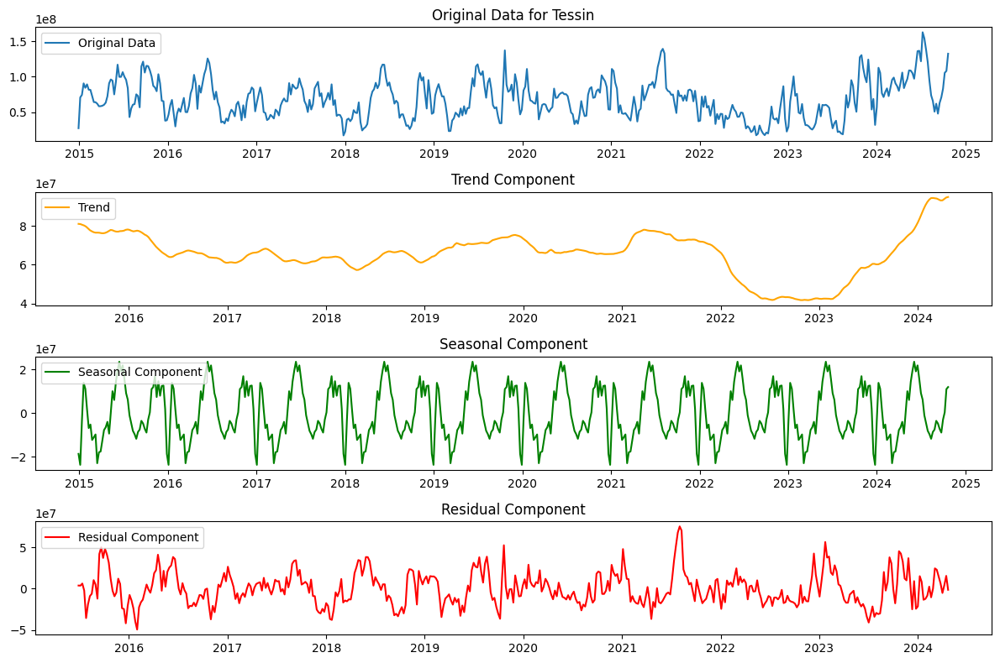

In [ ]:
# Ensure the index is in datetime format
grouped_data.index = pd.to_datetime(grouped_data.index, errors='coerce')

# Select the column for Tessin
tessin_column = 'Produktion Kanton TI\nProduction Canton TI'  # Adjust the column name as needed
data = grouped_data[tessin_column]

# Find the first non-zero value and filter the data
start_index = data.ne(0).idxmax()  # Finds the first index where the value is not 0
filtered_data = data.loc[start_index:]  # Filter the data starting from the first non-zero value

# Perform seasonal decomposition
decomposition = seasonal_decompose(filtered_data, model='additive', period=52)

# Extract the components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot the components
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(filtered_data, label='Original Data')
plt.legend(loc='upper left')
plt.title('Original Data for Tessin')

plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='upper left')
plt.title('Trend Component')

plt.subplot(413)
plt.plot(seasonal, label='Seasonal Component', color='green')
plt.legend(loc='upper left')
plt.title('Seasonal Component')

plt.subplot(414)
plt.plot(residual, label='Residual Component', color='red')
plt.legend(loc='upper left')
plt.title('Residual Component')

plt.tight_layout()
plt.show()

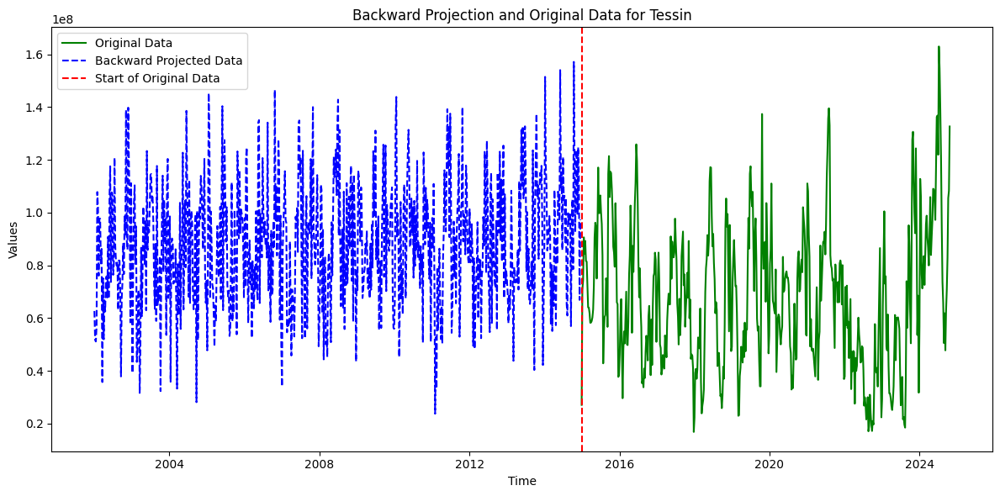

In [ ]:
# Ensure the index is in datetime format
grouped_data.index = pd.to_datetime(grouped_data.index, errors='coerce')

# Select the column for Tessin
tessin_column = 'Produktion Kanton TI\nProduction Canton TI'  # Adjust the column name as needed
tessin_data = grouped_data[tessin_column]

# Find the first non-zero value and filter the data
tessin_start_index = tessin_data.ne(0).idxmax()  # Finds the first index where the value is not 0
tessin_filtered_data = tessin_data.loc[tessin_start_index:]  # Filter the data starting from the first non-zero value

# Perform seasonal decomposition
tessin_decomposition = seasonal_decompose(tessin_filtered_data, model='additive', period=52)

# Extract the components
tessin_trend = tessin_decomposition.trend
tessin_seasonal = tessin_decomposition.seasonal
tessin_residual = tessin_decomposition.resid

# Backward projection setup
tessin_target_date = pd.to_datetime('2002-01-01')  # Target date for backward projection
tessin_weeks_back = (tessin_filtered_data.index[0] - tessin_target_date).days // 7

# Backward project the trend
tessin_projected_trend = np.linspace(tessin_trend.dropna().iloc[0], tessin_trend.dropna().iloc[-1], tessin_weeks_back)

# Repeat the seasonal component for backward projection
tessin_projected_seasonal = np.tile(tessin_seasonal.dropna().iloc[:52], tessin_weeks_back // 52 + 1)[:tessin_weeks_back]

# Add random noise based on the residual's standard deviation
tessin_random_error = np.random.normal(loc=0, scale=np.std(tessin_residual.dropna()), size=tessin_weeks_back)

# Combine trend, seasonal, and random noise for the reconstructed data
tessin_reconstructed_data = tessin_projected_trend + tessin_projected_seasonal + tessin_random_error

# Generate timestamps for the backward projection
tessin_projected_dates = pd.date_range(tessin_target_date, periods=tessin_weeks_back, freq='7D')

# Create a DataFrame for the backward projection
tessin_projected_df = pd.DataFrame({'Original': tessin_reconstructed_data}, index=tessin_projected_dates)

# Combine reconstructed and original data
tessin_filtered_df = pd.DataFrame({'Original': tessin_filtered_data})
tessin_combined_df = pd.concat([tessin_projected_df, tessin_filtered_df], axis=0)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(tessin_filtered_df.index, tessin_filtered_df['Original'], label='Original Data', color='green')
plt.plot(tessin_projected_df.index, tessin_projected_df['Original'], label='Backward Projected Data', linestyle='--', color='blue')
plt.axvline(x=tessin_filtered_data.index[0], color='red', linestyle='--', label='Start of Original Data')
plt.title('Backward Projection and Original Data for Tessin')
plt.xlabel('Time')
plt.ylabel('Values')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
combined_tessin_df = pd.concat([tessin_projected_df, tessin_filtered_df], axis=0)
combined_tessin_df = combined_tessin_df.rename(columns={
    "Original": "ProductionTessin"
})
combined_tessin_df = combined_tessin_df.reset_index().rename(columns={"index": "Date"})
combined_tessin_df



,Date,ProductionTessin
0,2002-01-01,6.271988e+07
1,2002-01-08,5.177258e+07
2,2002-01-15,5.115237e+07
3,2002-01-22,5.675567e+07
4,2002-01-29,1.078208e+08
...,...,...
1185,2024-09-23,7.081203e+07
1186,2024-09-30,8.301445e+07
1187,2024-10-07,1.055458e+08
1188,2024-10-14,1.082968e+08


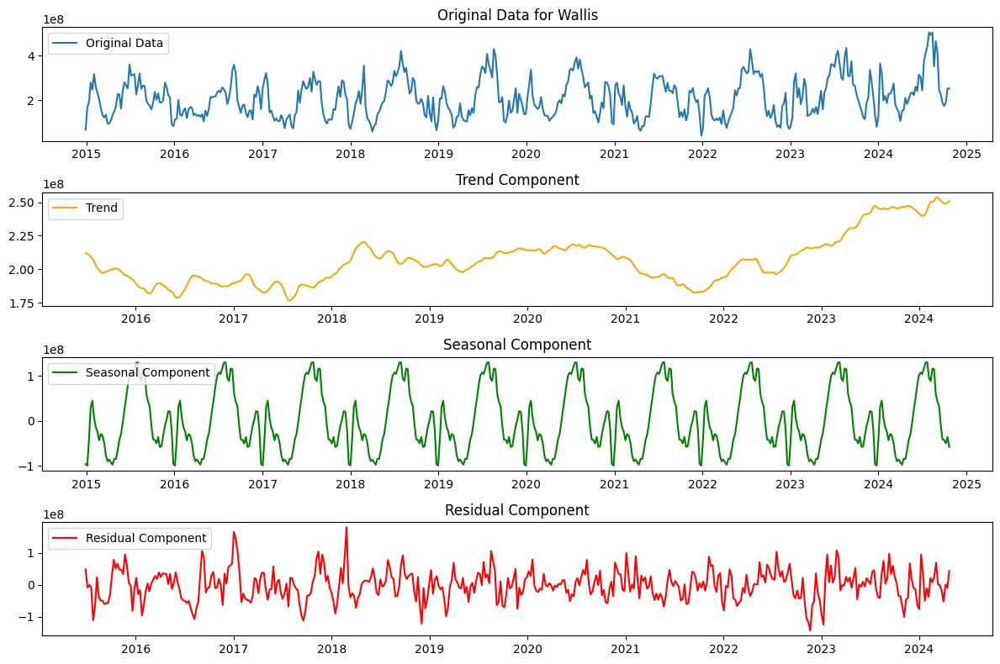

In [ ]:
# Ensure the index is in datetime format
grouped_data.index = pd.to_datetime(grouped_data.index, errors='coerce')

# Select the column for Wallis
wallis_column = 'Produktion Kanton VS\nProduction Canton VS'  # Adjust the column name as needed
data = grouped_data[wallis_column]

# Find the first non-zero value and filter the data
start_index = data.ne(0).idxmax()  # Finds the first index where the value is not 0
filtered_data = data.loc[start_index:]  # Filter the data starting from the first non-zero value

# Perform seasonal decomposition
decomposition = seasonal_decompose(filtered_data, model='additive', period=52)

# Extract the components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot the components
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(filtered_data, label='Original Data')
plt.legend(loc='upper left')
plt.title('Original Data for Wallis')

plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='upper left')
plt.title('Trend Component')

plt.subplot(413)
plt.plot(seasonal, label='Seasonal Component', color='green')
plt.legend(loc='upper left')
plt.title('Seasonal Component')

plt.subplot(414)
plt.plot(residual, label='Residual Component', color='red')
plt.legend(loc='upper left')
plt.title('Residual Component')

plt.tight_layout()
plt.show()

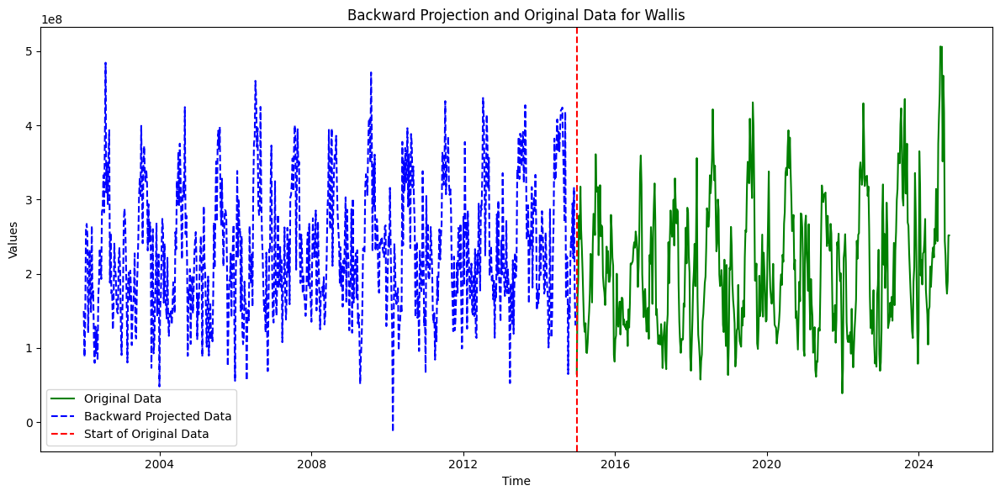

In [ ]:
# Ensure the index is in datetime format
grouped_data.index = pd.to_datetime(grouped_data.index, errors='coerce')

# Select the column for Wallis
wallis_column = 'Produktion Kanton VS\nProduction Canton VS'  # Adjust the column name as needed
wallis_data = grouped_data[wallis_column]

# Find the first non-zero value and filter the data
wallis_start_index = wallis_data.ne(0).idxmax()  # Finds the first index where the value is not 0
wallis_filtered_data = wallis_data.loc[wallis_start_index:]  # Filter the data starting from the first non-zero value

# Perform seasonal decomposition
wallis_decomposition = seasonal_decompose(wallis_filtered_data, model='additive', period=52)

# Extract the components
wallis_trend = wallis_decomposition.trend
wallis_seasonal = wallis_decomposition.seasonal
wallis_residual = wallis_decomposition.resid

# Backward projection setup
wallis_target_date = pd.to_datetime('2002-01-01')  # Target date for backward projection
wallis_weeks_back = (wallis_filtered_data.index[0] - wallis_target_date).days // 7

# Backward project the trend
wallis_projected_trend = np.linspace(wallis_trend.dropna().iloc[0], wallis_trend.dropna().iloc[-1], wallis_weeks_back)

# Repeat the seasonal component for backward projection
wallis_projected_seasonal = np.tile(wallis_seasonal.dropna().iloc[:52], wallis_weeks_back // 52 + 1)[:wallis_weeks_back]

# Add random noise based on the residual's standard deviation
wallis_random_error = np.random.normal(loc=0, scale=np.std(wallis_residual.dropna()), size=wallis_weeks_back)

# Combine trend, seasonal, and random noise for the reconstructed data
wallis_reconstructed_data = wallis_projected_trend + wallis_projected_seasonal + wallis_random_error

# Generate timestamps for the backward projection
wallis_projected_dates = pd.date_range(wallis_target_date, periods=wallis_weeks_back, freq='7D')

# Create a DataFrame for the backward projection
wallis_projected_df = pd.DataFrame({'Original': wallis_reconstructed_data}, index=wallis_projected_dates)

# Combine reconstructed and original data
wallis_filtered_df = pd.DataFrame({'Original': wallis_filtered_data})
wallis_combined_df = pd.concat([wallis_projected_df, wallis_filtered_df], axis=0)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(wallis_filtered_df.index, wallis_filtered_df['Original'], label='Original Data', color='green')
plt.plot(wallis_projected_df.index, wallis_projected_df['Original'], label='Backward Projected Data', linestyle='--', color='blue')
plt.axvline(x=wallis_filtered_data.index[0], color='red', linestyle='--', label='Start of Original Data')
plt.title('Backward Projection and Original Data for Wallis')
plt.xlabel('Time')
plt.ylabel('Values')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
wallis_combined_df = wallis_combined_df.rename(columns={
    "Original": "ProductionWallis"})
wallis_combined_df = wallis_combined_df.reset_index().rename(columns={"index": "Date"})
wallis_combined_df


,Date,ProductionWallis
0,2002-01-01,1.497987e+08
1,2002-01-08,8.808873e+07
2,2002-01-15,1.372815e+08
3,2002-01-22,2.595296e+08
4,2002-01-29,2.672085e+08
...,...,...
1185,2024-09-23,1.878217e+08
1186,2024-09-30,1.732407e+08
1187,2024-10-07,1.903407e+08
1188,2024-10-14,2.518364e+08


In [ ]:
wallis_combined_df

,Date,ProductionWallis
0,2002-01-01,1.497987e+08
1,2002-01-08,8.808873e+07
2,2002-01-15,1.372815e+08
3,2002-01-22,2.595296e+08
4,2002-01-29,2.672085e+08
...,...,...
1185,2024-09-23,1.878217e+08
1186,2024-09-30,1.732407e+08
1187,2024-10-07,1.903407e+08
1188,2024-10-14,2.518364e+08


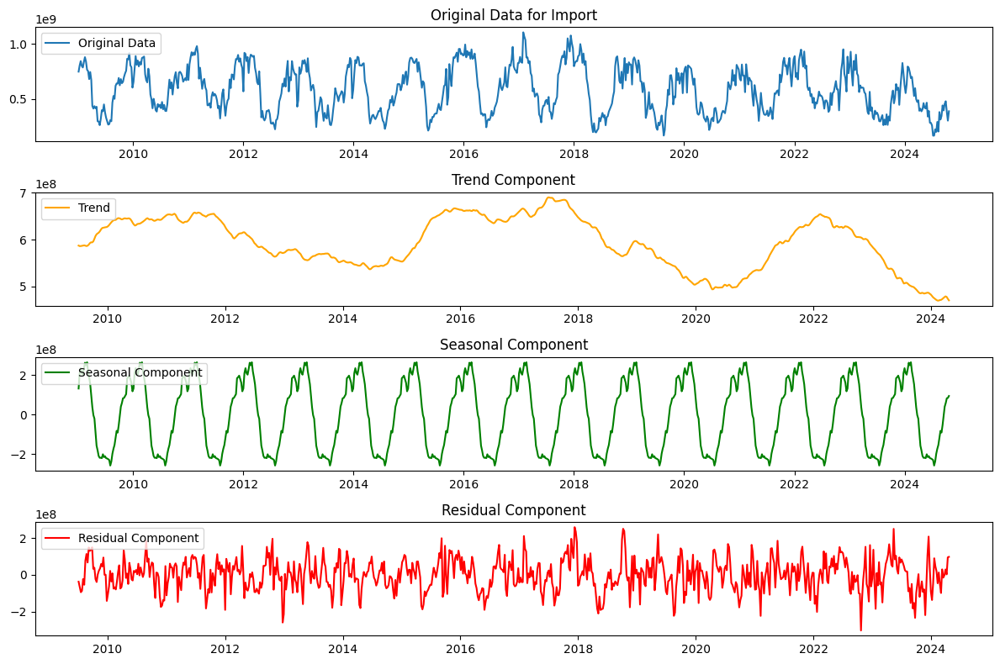

In [ ]:
import_data = grouped_data["Import"]

# Perform decomposition
import_decomposition = seasonal_decompose(import_data, model='additive', period=52)

# Extract components
trend = import_decomposition.trend
seasonal = import_decomposition.seasonal
residual = import_decomposition.resid

# Plot the components
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(import_data, label="Original Data")
plt.legend(loc="upper left")
plt.title("Original Data for Import")

plt.subplot(412)
plt.plot(trend, label="Trend", color="orange")
plt.legend(loc="upper left")
plt.title("Trend Component")

plt.subplot(413)
plt.plot(seasonal, label="Seasonal Component", color="green")
plt.legend(loc="upper left")
plt.title("Seasonal Component")

plt.subplot(414)
plt.plot(residual, label="Residual Component", color="red")
plt.legend(loc="upper left")
plt.title("Residual Component")

plt.tight_layout()
plt.show()

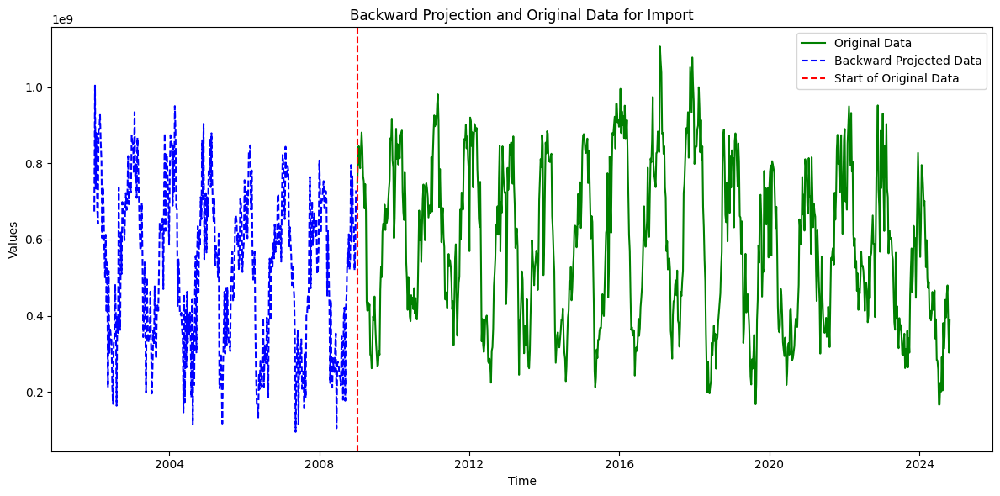

In [ ]:
# Backward projection setup
import_target_date = pd.to_datetime("2002-01-01")  # Target date for backward projection
import_weeks_back = (import_data.index[0] - import_target_date).days // 7

# Backward project the trend
import_projected_trend = np.linspace(trend.dropna().iloc[0], trend.dropna().iloc[-1], import_weeks_back)

# Repeat the seasonal component for backward projection
import_projected_seasonal = np.tile(seasonal.dropna().iloc[:52], import_weeks_back // 52 + 1)[:import_weeks_back]

# Add random noise based on the residual's standard deviation
import_random_error = np.random.normal(loc=0, scale=np.std(residual.dropna()), size=import_weeks_back)

# Combine trend, seasonal, and random noise for the reconstructed data
import_reconstructed_data = import_projected_trend + import_projected_seasonal + import_random_error

# Generate timestamps for the backward projection
import_projected_dates = pd.date_range(import_target_date, periods=import_weeks_back, freq="7D")

# Create a DataFrame for the backward projection
import_projected_df = pd.DataFrame({"Original": import_reconstructed_data}, index=import_projected_dates)

# Combine reconstructed and original data
import_filtered_df = pd.DataFrame({"Original": import_data})
import_combined_df = pd.concat([import_projected_df, import_filtered_df], axis=0)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(import_filtered_df.index, import_filtered_df["Original"], label="Original Data", color="green")
plt.plot(import_projected_df.index, import_projected_df["Original"], label="Backward Projected Data", linestyle="--", color="blue")
plt.axvline(x=import_data.index[0], color="red", linestyle="--", label="Start of Original Data")
plt.title("Backward Projection and Original Data for Import")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import_combined_df = import_combined_df.rename(columns={"Original": "ImportData"})
import_combined_df = import_combined_df.reset_index().rename(columns={"index": "Date"})



In [ ]:
import_combined_df

,Date,ImportData
0,2002-01-01,6.711828e+08
1,2002-01-08,7.303346e+08
2,2002-01-15,7.746387e+08
3,2002-01-22,8.665408e+08
4,2002-01-29,7.208765e+08
...,...,...
1185,2024-09-23,4.561775e+08
1186,2024-09-30,4.795852e+08
1187,2024-10-07,3.829998e+08
1188,2024-10-14,3.028907e+08


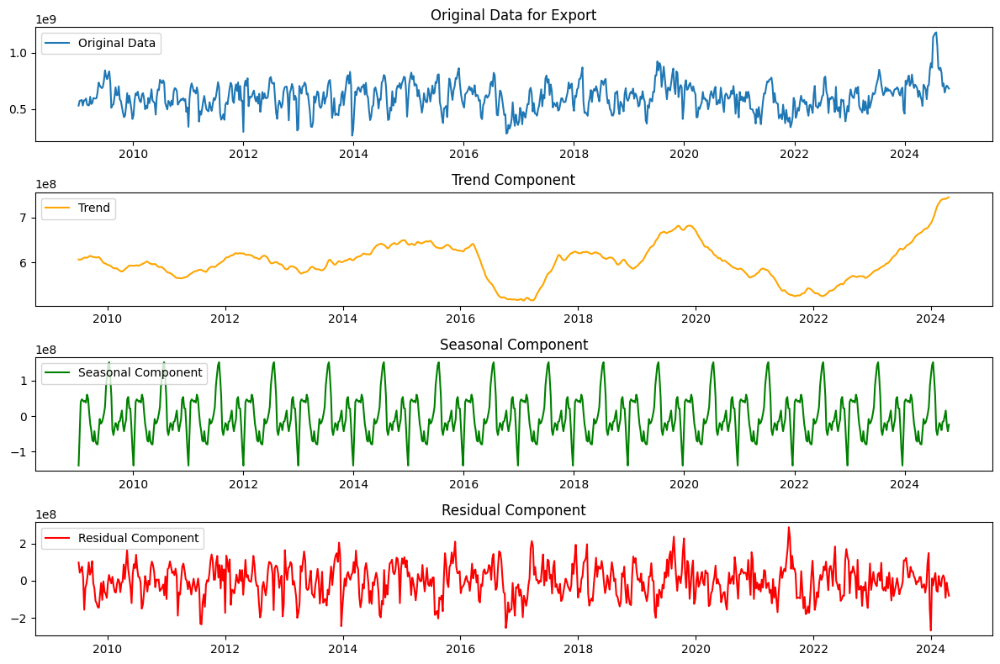

In [ ]:
# Select the Export column
export_column = "Export"  # Column name is "Export"
export_data = grouped_data[export_column]

# Find the first non-zero value and filter the data
export_start_index = export_data.ne(0).idxmax()  # Finds the first index where the value is not 0
export_filtered_data = export_data.loc[export_start_index:]  # Filter the data starting from the first non-zero value

# Perform seasonal decomposition
export_decomposition = seasonal_decompose(export_filtered_data, model="additive", period=52)

# Extract the components
export_trend = export_decomposition.trend
export_seasonal = export_decomposition.seasonal
export_residual = export_decomposition.resid

# Plot the components
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(export_filtered_data, label="Original Data")
plt.legend(loc="upper left")
plt.title("Original Data for Export")

plt.subplot(412)
plt.plot(export_trend, label="Trend", color="orange")
plt.legend(loc="upper left")
plt.title("Trend Component")

plt.subplot(413)
plt.plot(export_seasonal, label="Seasonal Component", color="green")
plt.legend(loc="upper left")
plt.title("Seasonal Component")

plt.subplot(414)
plt.plot(export_residual, label="Residual Component", color="red")
plt.legend(loc="upper left")
plt.title("Residual Component")

plt.tight_layout()
plt.show()

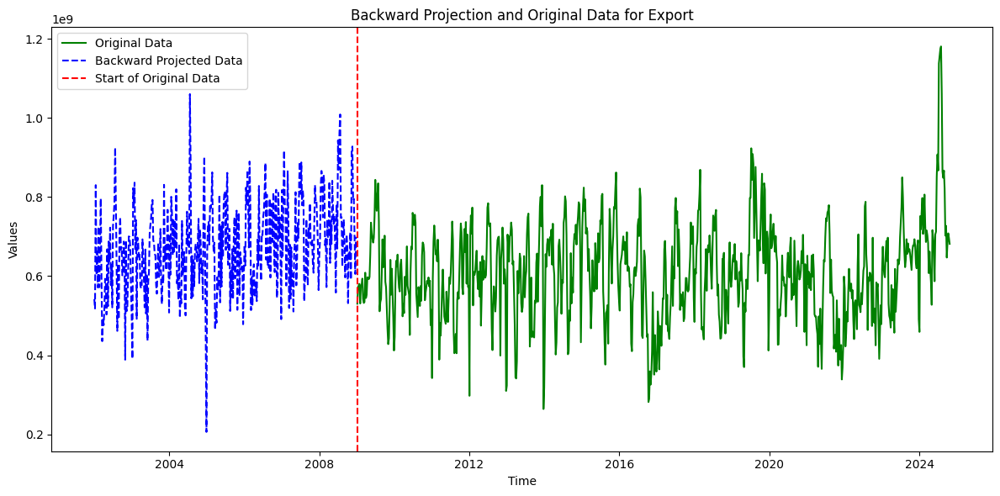

In [ ]:
# Backward projection setup
export_target_date = pd.to_datetime("2002-01-01")  # Target date for backward projection
export_weeks_back = (export_filtered_data.index[0] - export_target_date).days // 7

# Backward project the trend
export_projected_trend = np.linspace(export_trend.dropna().iloc[0], export_trend.dropna().iloc[-1], export_weeks_back)

# Repeat the seasonal component for backward projection
export_projected_seasonal = np.tile(export_seasonal.dropna().iloc[:52], export_weeks_back // 52 + 1)[:export_weeks_back]

# Add random noise based on the residual's standard deviation
export_random_error = np.random.normal(loc=0, scale=np.std(export_residual.dropna()), size=export_weeks_back)

# Combine trend, seasonal, and random noise for the reconstructed data
export_reconstructed_data = export_projected_trend + export_projected_seasonal + export_random_error

# Generate timestamps for the backward projection
export_projected_dates = pd.date_range(export_target_date, periods=export_weeks_back, freq="7D")

# Create a DataFrame for the backward projection
export_projected_df = pd.DataFrame({"Original": export_reconstructed_data}, index=export_projected_dates)

# Combine reconstructed and original data
export_filtered_df = pd.DataFrame({"Original": export_filtered_data})
export_combined_df = pd.concat([export_projected_df, export_filtered_df], axis=0)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(export_filtered_df.index, export_filtered_df["Original"], label="Original Data", color="green")
plt.plot(export_projected_df.index, export_projected_df["Original"], label="Backward Projected Data", linestyle="--", color="blue")
plt.axvline(x=export_filtered_data.index[0], color="red", linestyle="--", label="Start of Original Data")
plt.title("Backward Projection and Original Data for Export")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
export_combined_df= export_combined_df.rename(columns={"Original": "ExportData"})
export_combined_df = export_combined_df.reset_index().rename(columns={"index": "Date"})


**Bring the energy data together **

In [ ]:
merged_df  = pd.merge(import_combined_df, export_combined_df, how="inner", on='Date')
merged_df  = pd.merge(merged_df, wallis_combined_df, how="inner", on='Date')
energydata = pd.merge(merged_df, combined_tessin_df, how="inner", on='Date')
energydata 

,Date,ImportData,ExportData,ProductionWallis,ProductionTessin
0,2002-01-01,6.734195e+08,5.420266e+08,1.497987e+08,6.271988e+07
1,2002-01-08,1.004132e+09,5.181713e+08,8.808873e+07,5.177258e+07
2,2002-01-15,7.339983e+08,8.302285e+08,1.372815e+08,5.115237e+07
3,2002-01-22,8.790395e+08,6.041495e+08,2.595296e+08,5.675567e+07
4,2002-01-29,6.830562e+08,6.617729e+08,2.672085e+08,1.078208e+08
...,...,...,...,...,...
873,2024-09-23,4.561775e+08,6.470739e+08,1.878217e+08,7.081203e+07
874,2024-09-30,4.795852e+08,6.858108e+08,1.732407e+08,8.301445e+07
875,2024-10-07,3.829998e+08,7.082348e+08,1.903407e+08,1.055458e+08
876,2024-10-14,3.028907e+08,6.965924e+08,2.518364e+08,1.082968e+08


# Exchange Rate Data

In [ ]:
fx_excel_file = "Data/ExchangeRateData.xlsx"

# Load the Excel file into a DataFrame
exchangerates = pd.read_excel(fx_excel_file, engine='openpyxl')  # Ensure openpyxl is installed


exchangerates

,Exchange Date,Bid,Ask
0,2024-11-27,0.9316,0.9318
1,2024-11-26,0.9296,0.9300
2,2024-11-25,0.9301,0.9303
3,2024-11-22,0.9314,0.9319
4,2024-11-21,0.9286,0.9290
...,...,...,...
5213,2004-12-03,1.5212,1.5217
5214,2004-12-02,1.5273,1.5279
5215,2004-12-01,1.5202,1.5209
5216,2004-11-30,1.5148,1.5155


We have the Bid and the Ask Price, to get the  Market Rate for the FX Rate we make another column (Bid + Ask)/2 and call in Markret Rate

In [ ]:
exchangerates['Market Rate'] = (exchangerates['Bid'] + exchangerates['Ask']) / 2


In [ ]:
exchangerates = exchangerates[["Exchange Date",'Market Rate']]
exchangerates

,Exchange Date,Market Rate
0,2024-11-27,0.93170
1,2024-11-26,0.92980
2,2024-11-25,0.93020
3,2024-11-22,0.93165
4,2024-11-21,0.92880
...,...,...
5213,2004-12-03,1.52145
5214,2004-12-02,1.52760
5215,2004-12-01,1.52055
5216,2004-11-30,1.51515


To merge with our other features we compute the weekly average of the exchange rate and start from 2004-11-29 onwards 

In [ ]:
# Filter data from 2004-01-05 onwards
exchangerates_filtered = exchangerates[exchangerates['Exchange Date'] >= '2004-11-29']

# Set 'Exchange Date' as the index
exchangerates_filtered = exchangerates_filtered.set_index('Exchange Date')

# Resample data to weekly frequency and calculate the mean for 'Market Rate'
weekly_avg_fxrate = exchangerates_filtered['Market Rate'].resample('W-MON').mean().reset_index()

# Rename columns for clarity
weekly_avg_fxrate.columns = ['Date', 'CHF/EUR']
pd.to_datetime(weekly_avg_fxrate['Date'], format='%Y-%m-%d', errors='coerce')
# Display the resulting DataFrame
weekly_avg_fxrate

,Date,CHF/EUR
0,2004-11-29,1.51660
1,2004-12-06,1.52292
2,2004-12-13,1.53328
3,2004-12-20,1.53539
4,2004-12-27,1.54482
...,...,...
1040,2024-11-04,0.94026
1041,2024-11-11,0.94080
1042,2024-11-18,0.93635
1043,2024-11-25,0.93159


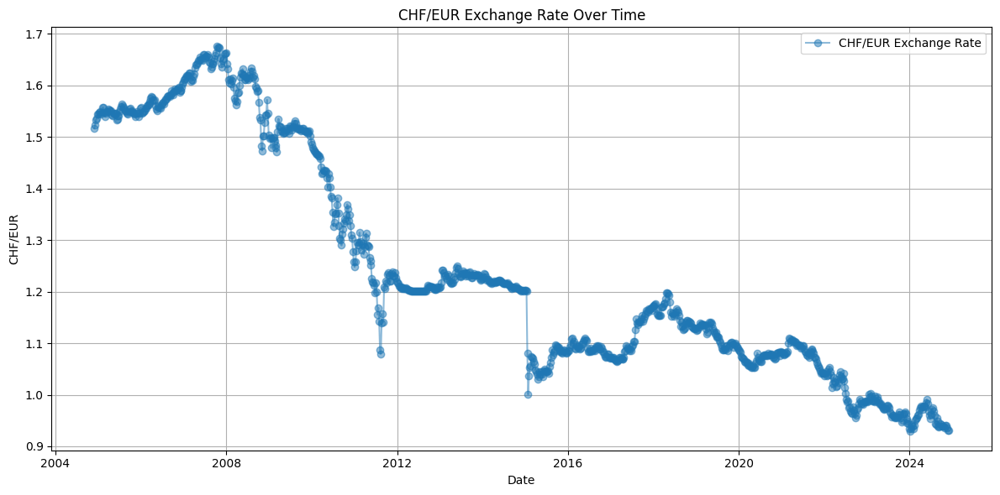

In [ ]:
# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(weekly_avg_fxrate["Date"], weekly_avg_fxrate["CHF/EUR"], label="CHF/EUR Exchange Rate", marker="o", alpha=0.5)
plt.title("CHF/EUR Exchange Rate Over Time")
plt.xlabel("Date")
plt.ylabel("CHF/EUR")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

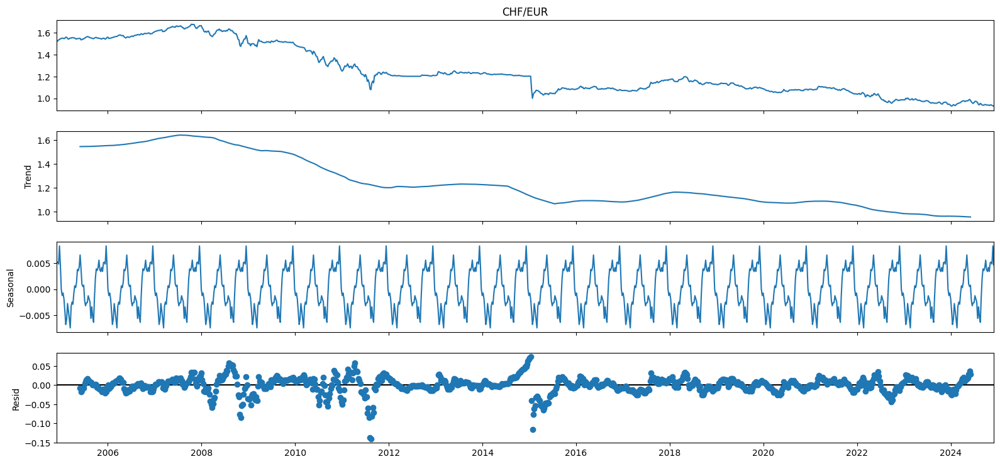

In [ ]:
# Decompose the time series for weekly data
# The period is set to 52 weeks (for yearly seasonality)
weekly_avg_fxrate.set_index("Date", inplace=True)
decomposedfx = seasonal_decompose(weekly_avg_fxrate['CHF/EUR'], model='additive', period=52)

# Plot the decomposition results
fig = decomposedfx.plot()
fig.set_size_inches(18, 8)
plt.show()

In [ ]:
#We will use the residuals to generate for the random weekly data we need later 
residuals = decomposedfx.resid
residuals = residuals.dropna()
residuals.describe()

count    993.000000
mean       0.000093
std        0.020752
min       -0.139750
25%       -0.008827
50%        0.000856
75%        0.011828
max        0.073727
Name: resid, dtype: float64

In [ ]:
weekly_avg_fxrate

,CHF/EUR
Date,
2004-11-29,1.51660
2004-12-06,1.52292
2004-12-13,1.53328
2004-12-20,1.53539
2004-12-27,1.54482
...,...
2024-11-04,0.94026
2024-11-11,0.94080
2024-11-18,0.93635


Unfortunately there are no good datafiles going back from 2004 to 2000. We went to the ECB website and conducted the yearly averages, given that the Euro was launched in 1999, but the banknote implemntation started in 2002 we found it fair to just work with yearly averages, as there should be that much of an impact
https://www.ecb.europa.eu/stats/policy_and_exchange_rates/euro_reference_exchange_rates/html/eurofxref-graph-chf.en.html

In [ ]:
annualweeklyfx = pd.read_csv("Data//WeeklyFXRateGen.csv")
annualweeklyfx

,Date,CHF/EUR
0,2000-01-03,1.5579
1,2000-01-10,1.5579
2,2000-01-17,1.5579
3,2000-01-24,1.5579
4,2000-01-31,1.5579
...,...,...
1299,2024-11-10,1.5166
1300,2024-11-17,1.5166
1301,2024-11-24,1.5166
1302,2024-12-01,1.5166


In [ ]:
#Only observation up to the data where we have the actual better data 
annualweeklyfx['Date'] = pd.to_datetime(annualweeklyfx['Date'], format='%Y-%m-%d', errors='coerce')
annualweeklyfx = annualweeklyfx[annualweeklyfx['Date'] < pd.to_datetime('2004-11-29')]
annualweeklyfx

,Date,CHF/EUR
0,2000-01-03,1.5579
1,2000-01-10,1.5579
2,2000-01-17,1.5579
3,2000-01-24,1.5579
4,2000-01-31,1.5579
...,...,...
253,2004-10-25,1.5455
254,2004-11-01,1.5455
255,2004-11-08,1.5455
256,2004-11-15,1.5455


In [ ]:
weekly_avg_fxrate = weekly_avg_fxrate.reset_index()
weekly_avg_fxrate['Date'] = pd.to_datetime(weekly_avg_fxrate['Date'], format='%Y-%m-%d', errors='coerce')
weekly_avg_fxrate['Date']

0      2004-11-29
1      2004-12-06
2      2004-12-13
3      2004-12-20
4      2004-12-27
          ...    
1040   2024-11-04
1041   2024-11-11
1042   2024-11-18
1043   2024-11-25
1044   2024-12-02
Name: Date, Length: 1045, dtype: datetime64[ns]

In [ ]:
#Concat the 2 dfs and make datetime
fxrates = pd.concat([annualweeklyfx, weekly_avg_fxrate])
fxrates['Date'] = pd.to_datetime(fxrates['Date'], format='%Y-%m-%d', errors='coerce')
fxrates

,Date,CHF/EUR
0,2000-01-03,1.55790
1,2000-01-10,1.55790
2,2000-01-17,1.55790
3,2000-01-24,1.55790
4,2000-01-31,1.55790
...,...,...
1040,2024-11-04,0.94026
1041,2024-11-11,0.94080
1042,2024-11-18,0.93635
1043,2024-11-25,0.93159


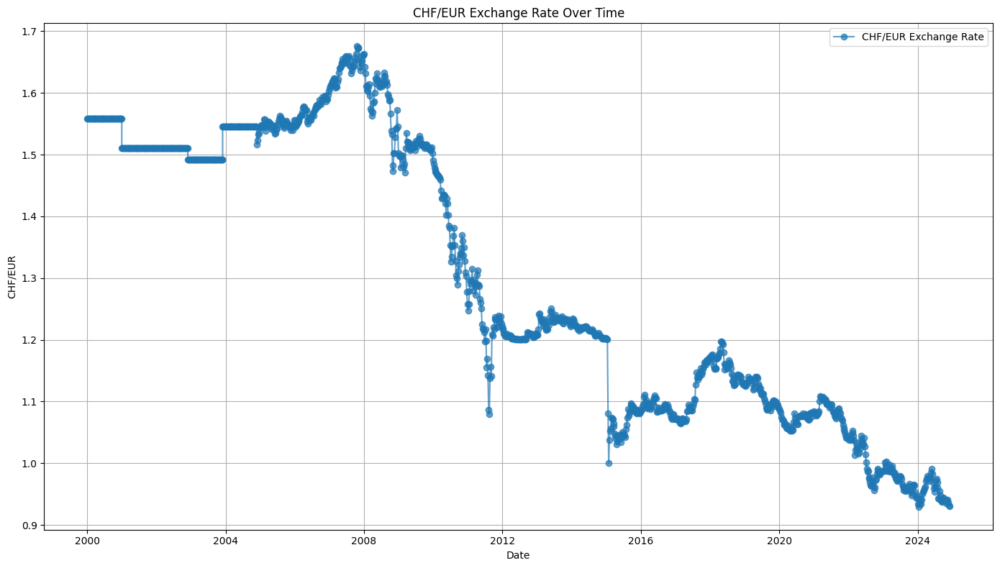

In [ ]:
# Plot the data
plt.figure(figsize=(14, 8))
plt.plot(fxrates["Date"], fxrates["CHF/EUR"], label="CHF/EUR Exchange Rate", marker="o", linestyle="-", alpha=0.7)
plt.title("CHF/EUR Exchange Rate Over Time")
plt.xlabel("Date")
plt.ylabel("CHF/EUR")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


Obviously there are only yearly fluctuation before 2000-2004 this approach is not perfect but we can work with the data. To add noise that it looks like an actual time series we work with the before observed residual data to ad some random noise to the created columns 

In [ ]:
#Mean and Std of the residuals from the actual data
residual_mean = residuals.mean()
residual_std = residuals.std()
max_fluctuation = 0.004

#We displayed the data and saw that without maximum boundaries there would be unrealistic volatility in the dataset so we clipped (maximum fluctuation the dataset)
noise = np.random.normal(loc=residual_mean, scale=residual_std, size=annualweeklyfx.shape[0])
clipped_noise = np.clip(noise, -max_fluctuation, max_fluctuation)  # Clip to [-0.003, 0.003]

annualweeklyfx['CHF/EUR'] = annualweeklyfx['CHF/EUR'] + clipped_noise
annualweeklyfx['Date'] = pd.to_datetime(annualweeklyfx['Date'], format='%Y-%m-%d', errors='coerce')
annualweeklyfx

/var/folders/kz/cdns3q5j33910y0dt9d7416m0000gn/T/ipykernel_14214/1871322950.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  annualweeklyfx['CHF/EUR'] = annualweeklyfx['CHF/EUR'] + clipped_noise
/var/folders/kz/cdns3q5j33910y0dt9d7416m0000gn/T/ipykernel_14214/1871322950.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  annualweeklyfx['Date'] = pd.to_datetime(annualweeklyfx['Date'], format='%Y-%m-%d', errors='coerce')


,Date,CHF/EUR
0,2000-01-03,1.545900
1,2000-01-10,1.553900
2,2000-01-17,1.560568
3,2000-01-24,1.553900
4,2000-01-31,1.561900
...,...,...
253,2004-10-25,1.542483
254,2004-11-01,1.542994
255,2004-11-08,1.538981
256,2004-11-15,1.557500


In [ ]:
#Concat the dfs again and plot the new timeseries 
fxrates = pd.concat([annualweeklyfx, weekly_avg_fxrate])
fxrates['Date'] = pd.to_datetime(fxrates['Date'], format='%Y-%m-%d', errors='coerce')
fxrates


,Date,CHF/EUR
0,2000-01-03,1.545900
1,2000-01-10,1.553900
2,2000-01-17,1.560568
3,2000-01-24,1.553900
4,2000-01-31,1.561900
...,...,...
1040,2024-11-04,0.940260
1041,2024-11-11,0.940800
1042,2024-11-18,0.936350
1043,2024-11-25,0.931590


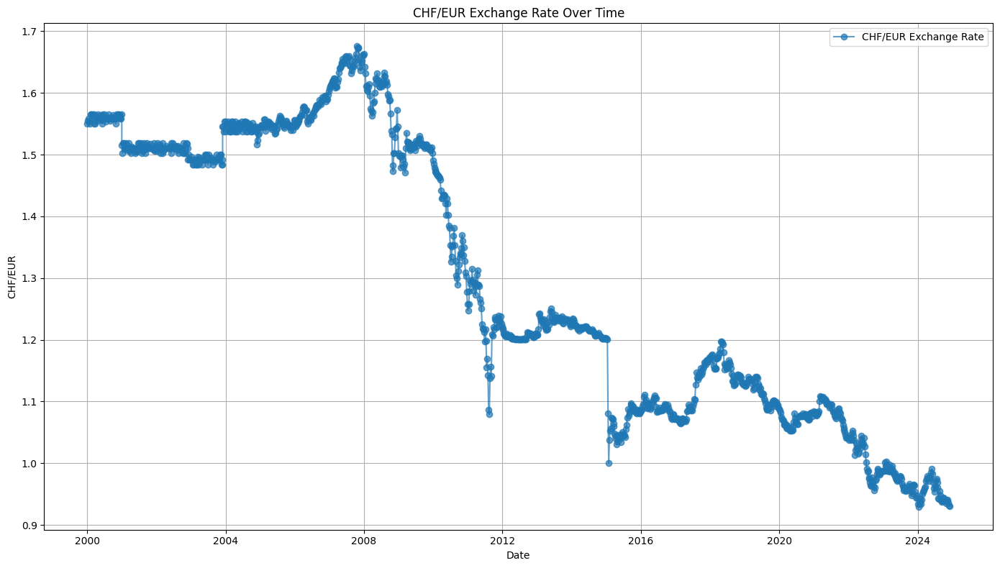

In [ ]:
#Plotting 
plt.figure(figsize=(14, 8))
plt.plot(fxrates["Date"], fxrates["CHF/EUR"], label="CHF/EUR Exchange Rate", marker="o", linestyle="-", alpha=0.7)
plt.title("CHF/EUR Exchange Rate Over Time")
plt.xlabel("Date")
plt.ylabel("CHF/EUR")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [31]:
FX_Data = pd.read_csv('FX_Data.csv', sep=';', encoding='utf-8', decimal='.')
print(FX_Data.head())  # Display the first few rows

FX_Data.columns = ['Date', 'Rate']  # Rename columns
FX_Data['Date'] = pd.to_datetime(FX_Data['Date'])  # Convert Date column to datetime

plt.figure(figsize=(10, 6))
plt.plot(FX_Data['Date'], FX_Data['Rate'], label='CHF/EUR Rate', linewidth=2)
plt.title('Exchange Rate CHF/EUR Over Time')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.grid(True)
plt.legend()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'FX_Data.csv'

Obviously this approach is not perfect but we can work with it

# Creating our final Dataset and Preprocessing

**Displaying the datas we want to merge**

In [ ]:
#1 Exchange rates 
fxrates

,Date,CHF/EUR
0,2000-01-03,1.545900
1,2000-01-10,1.553900
2,2000-01-17,1.560568
3,2000-01-24,1.553900
4,2000-01-31,1.561900
...,...,...
1040,2024-11-04,0.940260
1041,2024-11-11,0.940800
1042,2024-11-18,0.936350
1043,2024-11-25,0.931590


In [ ]:
#2 Energy Data 
energydata

,Date,ImportData,ExportData,ProductionWallis,ProductionTessin
0,2002-01-01,6.734195e+08,5.420266e+08,1.497987e+08,6.271988e+07
1,2002-01-08,1.004132e+09,5.181713e+08,8.808873e+07,5.177258e+07
2,2002-01-15,7.339983e+08,8.302285e+08,1.372815e+08,5.115237e+07
3,2002-01-22,8.790395e+08,6.041495e+08,2.595296e+08,5.675567e+07
4,2002-01-29,6.830562e+08,6.617729e+08,2.672085e+08,1.078208e+08
...,...,...,...,...,...
873,2024-09-23,4.561775e+08,6.470739e+08,1.878217e+08,7.081203e+07
874,2024-09-30,4.795852e+08,6.858108e+08,1.732407e+08,8.301445e+07
875,2024-10-07,3.829998e+08,7.082348e+08,1.903407e+08,1.055458e+08
876,2024-10-14,3.028907e+08,6.965924e+08,2.518364e+08,1.082968e+08


In [ ]:
#3 Wallis Weather Data 
wallis_weatherdataset

,Date,tavg_sion,tmin_sion,tmax_sion,prcp_sion,snow_sion,wdir_sion,wspd_sion,wpgt_sion,pres_sion,...,Week,tavg_sierre,prcp_sierre,wspd_sierre,tavg_bernhard,tmin_bernhard,tmax_bernhard,prcp_bernhard,tavg_aigle,wspd_aigle
0,2000-01-03,-2.483333,-6.100000,2.016667,0.000000,78.333333,69.000000,6.540000,NaN,1030.900000,...,1,-0.411242,0.785401,7.347522,-5.930519,-6.583333,-1.516667,0.000000,8.700877,7.395098
1,2000-01-10,-1.728571,-5.257143,3.085714,0.000000,51.428571,78.000000,5.200000,NaN,1029.350000,...,2,-1.599595,3.816001,5.230095,-6.330519,-9.542857,-6.228571,0.000000,2.387637,3.180928
2,2000-01-17,-2.414286,-6.457143,2.142857,0.000000,48.571429,186.000000,4.375000,NaN,1027.675000,...,3,-4.871539,0.260596,5.592553,-6.437013,-9.642857,-4.942857,0.614286,3.314527,7.200038
3,2000-01-24,-3.371429,-7.185714,1.185714,0.128571,42.857143,116.000000,4.666667,NaN,1023.916667,...,4,0.973337,0.099203,6.234835,-4.964286,-14.185714,-9.171429,4.957143,2.267254,5.763300
4,2000-01-31,1.500000,-2.342857,6.171429,3.085714,28.571429,NaN,4.414286,NaN,1027.083333,...,5,3.632865,1.202356,7.464722,-5.551558,-6.028571,-0.571429,9.600000,-0.540552,8.738478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1193,2022-12-12,-0.071429,-3.285714,2.271429,9.357143,100.000000,109.000000,4.800000,20.014286,1013.457143,...,50,-1.800000,0.142857,5.083333,-3.300000,-5.957143,-0.814286,16.285714,1.357143,8.000000
1194,2022-12-19,3.128571,0.842857,5.785714,11.985714,37.142857,95.428571,4.114286,19.857143,1016.171429,...,51,-1.071429,5.128571,7.133333,-2.114286,-5.342857,1.057143,1.228571,4.071429,6.771429
1195,2022-12-26,2.628571,-1.371429,7.771429,0.000000,0.000000,137.428571,4.571429,20.857143,1033.414286,...,52,-0.714286,0.757143,4.533333,-6.442857,-9.242857,-3.100000,1.914286,7.500000,9.371429
1196,2023-01-02,4.771429,0.414286,9.742857,0.342857,0.000000,159.428571,8.057143,31.471429,1021.957143,...,1,-0.800000,0.000000,5.800000,-8.014286,-11.857143,-4.785714,11.400000,9.000000,10.671429


In [ ]:
#4 Tessin Weather Data 
tessin_weatherdataset

,Date,tavg_minusio,tmin_minusio,tmax_minusio,wdir_minusio,wspd_minusio,pres_minusio,prcp_minusio,tavg_robiei,wspd_robiei,tavg_piotta,wspd_piotta,tavg_comporvasco,wspd_comprovasco
0,2000-01-03,-1.380000,-5.340000,4.120000,95.000000,3.640000,1027.420000,0.000000,-2.087567,4.815827,12.572295,1.578627,6.313791,1.578627
1,2000-01-10,0.600000,-2.683333,4.500000,128.000000,3.200000,1029.100000,4.348509,-0.335145,10.105099,0.399387,9.927867,3.269066,9.927867
2,2000-01-17,2.900000,-1.675000,7.900000,118.666667,6.700000,1023.775000,0.094005,-2.906296,11.572026,5.298474,6.615073,4.196129,6.615073
3,2000-01-24,2.233333,-3.616667,8.266667,96.200000,8.716667,1017.900000,0.000000,-3.747336,9.587354,-0.919147,4.773384,1.742378,4.773384
4,2000-01-31,2.683333,-2.650000,9.050000,102.500000,5.433333,1023.466667,1.629867,1.577488,10.766174,0.799014,5.312293,-0.079938,5.312293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,2023-10-30,4.728571,-1.428571,10.900000,92.571429,6.342857,1007.557143,0.000000,3.728571,5.914286,9.457143,5.428571,13.214286,5.228571
1244,2023-11-06,2.971429,-0.742857,6.885714,73.000000,6.471429,1013.357143,9.742857,0.500000,7.071429,5.500000,5.042857,12.371429,4.800000
1245,2023-11-13,4.571429,1.000000,8.428571,104.428571,3.257143,1014.085714,1.271429,-1.514286,5.442857,6.728571,6.271429,8.657143,6.957143
1246,2023-11-20,3.671429,-0.942857,10.928571,83.142857,5.214286,1028.485714,0.000000,2.628571,6.371429,7.400000,8.814286,7.642857,4.442857


**QickNote**


1. We only have legitmitate oberservation to 2002 for the energy dataset, since we have manye obersvations and features we think its okay to just merge from the beginning of 2002 on and drop data from 2000-2002. Also some of the data from 2000-2002 was randomaly generated for FX Rates and would even be better since the euro was no banknoted currency before 
2. To merge every dataframe we have to egineer a little bit. The energy data sets starts at 01-01-2002, whereas our other datasets start at 07-01-2002, we therefore add 6 days on every oberservation on ennergy dataset eve if this is not 100% correct 
3. We also consider only values less than year 2024 since there is uneven distribution in 2024 for availaible data in the different datasets 

In [ ]:
energydata['Date'] = pd.to_datetime(energydata['Date']) + pd.Timedelta(days=6)
energydata

,Date,ImportData,ExportData,ProductionWallis,ProductionTessin
0,2002-01-07,6.734195e+08,5.420266e+08,1.497987e+08,6.271988e+07
1,2002-01-14,1.004132e+09,5.181713e+08,8.808873e+07,5.177258e+07
2,2002-01-21,7.339983e+08,8.302285e+08,1.372815e+08,5.115237e+07
3,2002-01-28,8.790395e+08,6.041495e+08,2.595296e+08,5.675567e+07
4,2002-02-04,6.830562e+08,6.617729e+08,2.672085e+08,1.078208e+08
...,...,...,...,...,...
873,2024-09-29,4.561775e+08,6.470739e+08,1.878217e+08,7.081203e+07
874,2024-10-06,4.795852e+08,6.858108e+08,1.732407e+08,8.301445e+07
875,2024-10-13,3.829998e+08,7.082348e+08,1.903407e+08,1.055458e+08
876,2024-10-20,3.028907e+08,6.965924e+08,2.518364e+08,1.082968e+08


We now perform an inner join because we dont want missing values and see if wee have enough columns left 

In [ ]:
#Make Sure everything is in datetime 
fxrates['Date'] = pd.to_datetime(fxrates['Date'])
energydata['Date'] = pd.to_datetime(energydata['Date'])
tessin_weatherdataset['Date'] = pd.to_datetime(tessin_weatherdataset['Date'])
wallis_weatherdataset['Date'] = pd.to_datetime(wallis_weatherdataset['Date'])

# Perform inner joins on the 'Date' column
wallisdataset = fxrates.merge(wallis_weatherdataset, how='inner', on='Date')
wallisdataset



,Date,CHF/EUR,tavg_sion,tmin_sion,tmax_sion,prcp_sion,snow_sion,wdir_sion,wspd_sion,wpgt_sion,...,Week,tavg_sierre,prcp_sierre,wspd_sierre,tavg_bernhard,tmin_bernhard,tmax_bernhard,prcp_bernhard,tavg_aigle,wspd_aigle
0,2000-01-03,1.545900,-2.483333,-6.100000,2.016667,0.000000,78.333333,69.000000,6.540000,NaN,...,1,-0.411242,0.785401,7.347522,-5.930519,-6.583333,-1.516667,0.000000,8.700877,7.395098
1,2000-01-10,1.553900,-1.728571,-5.257143,3.085714,0.000000,51.428571,78.000000,5.200000,NaN,...,2,-1.599595,3.816001,5.230095,-6.330519,-9.542857,-6.228571,0.000000,2.387637,3.180928
2,2000-01-17,1.560568,-2.414286,-6.457143,2.142857,0.000000,48.571429,186.000000,4.375000,NaN,...,3,-4.871539,0.260596,5.592553,-6.437013,-9.642857,-4.942857,0.614286,3.314527,7.200038
3,2000-01-24,1.553900,-3.371429,-7.185714,1.185714,0.128571,42.857143,116.000000,4.666667,NaN,...,4,0.973337,0.099203,6.234835,-4.964286,-14.185714,-9.171429,4.957143,2.267254,5.763300
4,2000-01-31,1.561900,1.500000,-2.342857,6.171429,3.085714,28.571429,NaN,4.414286,NaN,...,5,3.632865,1.202356,7.464722,-5.551558,-6.028571,-0.571429,9.600000,-0.540552,8.738478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,2022-12-12,0.986670,-0.071429,-3.285714,2.271429,9.357143,100.000000,109.000000,4.800000,20.014286,...,50,-1.800000,0.142857,5.083333,-3.300000,-5.957143,-0.814286,16.285714,1.357143,8.000000
1196,2022-12-19,0.987170,3.128571,0.842857,5.785714,11.985714,37.142857,95.428571,4.114286,19.857143,...,51,-1.071429,5.128571,7.133333,-2.114286,-5.342857,1.057143,1.228571,4.071429,6.771429
1197,2022-12-26,0.987080,2.628571,-1.371429,7.771429,0.000000,0.000000,137.428571,4.571429,20.857143,...,52,-0.714286,0.757143,4.533333,-6.442857,-9.242857,-3.100000,1.914286,7.500000,9.371429
1198,2023-01-02,0.986910,4.771429,0.414286,9.742857,0.342857,0.000000,159.428571,8.057143,31.471429,...,1,-0.800000,0.000000,5.800000,-8.014286,-11.857143,-4.785714,11.400000,9.000000,10.671429


In [ ]:
wallisdataset['Date'] = pd.to_datetime(wallisdataset['Date'])

# Sort both datasets by Date (required for merge_asof)
wallisdataset = wallisdataset.sort_values('Date')
energydata = energydata.sort_values('Date')

# Perform asof merge (inner join on the closest date)
wallisdataset = pd.merge_asof(wallisdataset, energydata, on='Date', direction='nearest')

# Drop production Tessin and Display  
wallisdataset = wallisdataset.drop(columns=["ProductionTessin"])
wallisdataset
wallisdataset.to_csv('Data//wallisdataset.csv', index=True)


In [ ]:
# Perform inner joins on the 'Date' column
tessindataset = fxrates.merge(tessin_weatherdataset, how='inner', on='Date')
tessindataset

tessindataset['Date'] = pd.to_datetime(tessindataset['Date'])

# Sort both datasets by Date (required for merge_asof)
tessindataset = tessindataset.sort_values('Date')
energydata = energydata.sort_values('Date')

# Perform asof merge (inner join on the closest date)
tessindataset = pd.merge_asof(tessindataset, energydata, on='Date', direction='nearest')

# Drop production Wallis 
tessindataset = tessindataset.drop(columns=["ProductionWallis"])





In [ ]:
tessindataset.to_csv('Data//tessindataset.csv', index=True)
tessindataset 


,Date,CHF/EUR,tavg_minusio,tmin_minusio,tmax_minusio,wdir_minusio,wspd_minusio,pres_minusio,prcp_minusio,tavg_robiei,wspd_robiei,tavg_piotta,wspd_piotta,tavg_comporvasco,wspd_comprovasco,ImportData,ExportData,ProductionTessin
0,2000-01-03,1.545900,-1.380000,-5.340000,4.120000,95.000000,3.640000,1027.420000,0.000000,-2.087567,4.815827,12.572295,1.578627,6.313791,1.578627,6.734195e+08,5.420266e+08,6.271988e+07
1,2000-01-10,1.553900,0.600000,-2.683333,4.500000,128.000000,3.200000,1029.100000,4.348509,-0.335145,10.105099,0.399387,9.927867,3.269066,9.927867,6.734195e+08,5.420266e+08,6.271988e+07
2,2000-01-17,1.560568,2.900000,-1.675000,7.900000,118.666667,6.700000,1023.775000,0.094005,-2.906296,11.572026,5.298474,6.615073,4.196129,6.615073,6.734195e+08,5.420266e+08,6.271988e+07
3,2000-01-24,1.553900,2.233333,-3.616667,8.266667,96.200000,8.716667,1017.900000,0.000000,-3.747336,9.587354,-0.919147,4.773384,1.742378,4.773384,6.734195e+08,5.420266e+08,6.271988e+07
4,2000-01-31,1.561900,2.683333,-2.650000,9.050000,102.500000,5.433333,1023.466667,1.629867,1.577488,10.766174,0.799014,5.312293,-0.079938,5.312293,6.734195e+08,5.420266e+08,6.271988e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,2023-10-30,0.950800,4.728571,-1.428571,10.900000,92.571429,6.342857,1007.557143,0.000000,3.728571,5.914286,9.457143,5.428571,13.214286,5.228571,5.139970e+08,6.775849e+08,1.306589e+08
1246,2023-11-06,0.962670,2.971429,-0.742857,6.885714,73.000000,6.471429,1013.357143,9.742857,0.500000,7.071429,5.500000,5.042857,12.371429,4.800000,6.356531e+08,6.769478e+08,1.123444e+08
1247,2023-11-13,0.963760,4.571429,1.000000,8.428571,104.428571,3.257143,1014.085714,1.271429,-1.514286,5.442857,6.728571,6.271429,8.657143,6.957143,5.827301e+08,6.933766e+08,9.994924e+07
1248,2023-11-20,0.965880,3.671429,-0.942857,10.928571,83.142857,5.214286,1028.485714,0.000000,2.628571,6.371429,7.400000,8.814286,7.642857,4.442857,6.038617e+08,6.773092e+08,9.221077e+07


**Next step look for correlation and missing values**

1 Missing values 

In [ ]:
tessindataset.isnull().sum() 

Date                 0
CHF/EUR              0
tavg_minusio         7
tmin_minusio         7
tmax_minusio         7
wdir_minusio        80
wspd_minusio        23
pres_minusio         8
prcp_minusio        67
tavg_robiei         58
wspd_robiei         57
tavg_piotta         34
wspd_piotta         32
tavg_comporvasco    87
wspd_comprovasco    85
ImportData           0
ExportData           0
ProductionTessin     0
dtype: int64

In [ ]:
#tessind has not much missing values 
# We fill this missing values with the mean of the same week from another year of each column 

# Extract the week number and year from the Date column
tessindataset['Week'] = tessindataset['Date'].dt.isocalendar().week
tessindataset['Year'] = tessindataset['Date'].dt.year

# Function to fill missing values with the weekly mean across other years
def fill_missing_with_weekly_mean(df, column):
    # Group by Week and calculate the mean of the column ignoring the current year
    weekly_means = (
        df.groupby('Week')[column]
        .transform(lambda x: x.mean(skipna=True))
    )
    # Fill missing values with the calculated weekly means
    df[column] = df[column].fillna(weekly_means)
    return df

# Iterate through each column with missing values
for column in tessindataset.columns:
    if tessindataset[column].isnull().sum() > 0 and column not in ['Date', 'Week', 'Year']:
        tessindataset = fill_missing_with_weekly_mean(tessindataset, column)

# Drop helper columns 
tessindataset = tessindataset.drop(columns=['Week', 'Year'])

In [ ]:
# Ensure that there are no missing values left 
tessindataset.isnull().sum() 

Date                0
CHF/EUR             0
tavg_minusio        0
tmin_minusio        0
tmax_minusio        0
wdir_minusio        0
wspd_minusio        0
pres_minusio        0
prcp_minusio        0
tavg_robiei         0
wspd_robiei         0
tavg_piotta         0
wspd_piotta         0
tavg_comporvasco    0
wspd_comprovasco    0
ImportData          0
ExportData          0
ProductionTessin    0
dtype: int64

In [ ]:
wallisdataset.isnull().sum() 

Date                   0
CHF/EUR                0
tavg_sion              1
tmin_sion              1
tmax_sion              1
prcp_sion              3
snow_sion              7
wdir_sion             18
wspd_sion              8
wpgt_sion            969
pres_sion              9
tsun                1200
Year                   0
Week                   0
tavg_sierre            3
prcp_sierre           55
wspd_sierre           60
tavg_bernhard          0
tmin_bernhard          0
tmax_bernhard          0
prcp_bernhard          0
tavg_aigle            33
wspd_aigle            84
ImportData             0
ExportData             0
ProductionWallis       0
dtype: int64

In [ ]:
#tsun has a lot of missing values same as wpgt_sion we drop this columns completely
wallisdataset = wallisdataset.drop(columns=['wpgt_sion', 'tsun'])


In [ ]:
#For the rest we do the same like tessin 

# Extract the week number and year from the Date column
wallisdataset['Week'] = wallisdataset['Date'].dt.isocalendar().week
wallisdataset['Year'] = wallisdataset['Date'].dt.year

# Function to fill missing values with the weekly mean across other years
def fill_missing_with_weekly_mean(df, column):
    # Group by Week and calculate the mean of the column ignoring the current year
    weekly_means = (
        df.groupby('Week')[column]
        .transform(lambda x: x.mean(skipna=True))
    )
    # Fill missing values with the calculated weekly means
    df[column] = df[column].fillna(weekly_means)
    return df

# Iterate through each column with missing values
for column in wallisdataset.columns:
    if wallisdataset[column].isnull().sum() > 0 and column not in ['Date', 'Week', 'Year']:
        wallisdataset = fill_missing_with_weekly_mean(wallisdataset, column)

# Drop helper columns 
wallisdataset = wallisdataset.drop(columns=['Week', 'Year'])

In [ ]:
# Ensure that there are no missing values left 
wallisdataset.isnull().sum() 

Date                0
CHF/EUR             0
tavg_sion           0
tmin_sion           0
tmax_sion           0
prcp_sion           0
snow_sion           0
wdir_sion           0
wspd_sion           0
pres_sion           0
tavg_sierre         0
prcp_sierre         0
wspd_sierre         0
tavg_bernhard       0
tmin_bernhard       0
tmax_bernhard       0
prcp_bernhard       0
tavg_aigle          0
wspd_aigle          0
ImportData          0
ExportData          0
ProductionWallis    0
dtype: int64

2 Look for correlation to drop unnecessary features 

